# Описание

## Задачи
_Испольуется три задачи:_
- DM -- двухальтернативный выбор
- Romo -- сравнение двух сигнало через задержку
- CtxDM -- DM с контекстом
Вход состоит из одного контекстного входа, одного стимула, 6 входов, кодирующих задачи. Выход как и раньше состоит из трех частей: контекстный выход, выходы принятия решения.

## Сеть
 Сеть состоит из lif AdEx нейронов

# Импорт всех необходимых библиотек

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from cgtasknet.instruments.instrument_accuracy_network import CorrectAnswerNetwork
from cgtasknet.tasks.reduce import (
    CtxDMTaskParameters,
    DMTaskParameters,
    DMTaskRandomModParameters,
    GoDlTaskParameters,
    GoDlTaskRandomModParameters,
    GoRtTaskParameters,
    GoRtTaskRandomModParameters,
    GoTaskParameters,
    GoTaskRandomModParameters,
    MultyReduceTasks,
    RomoTaskParameters,
    RomoTaskRandomModParameters,
)
from tqdm import tqdm

# Определяем устройство

In [2]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
print(f"{device}")

cuda:1


# Функция построения входов и выходов

In [3]:
import os


def plot_results(inputs, target_outputs, outputs):
    if isinstance(inputs, torch.Tensor) and isinstance(target_outputs, torch.Tensor):
        inputs, t_outputs = (
            inputs.detach().cpu().numpy(),
            target_outputs.detach().cpu().numpy(),
        )
    for bath in range(min(batch_size, 20)):
        fig = plt.figure(figsize=(15, 3))
        ax1 = fig.add_subplot(141)
        plt.title("Inputs")
        plt.xlabel("$time, ms$")
        plt.ylabel("$Magnitude$")
        for i in range(3):
            plt.plot(inputs[:, bath, i].T, label=rf"$in_{i + 1}$")
        plt.legend()
        plt.tight_layout()

        ax2 = fig.add_subplot(142)
        plt.title("Task code (context)")
        plt.xticks(np.arange(1, len(tasks) + 1), sorted(tasks), rotation=90)
        plt.yticks([])
        for i in range(3, inputs.shape[-1]):
            plt.plot([i - 2] * 2, [0, inputs[0, bath, i]])
        plt.tight_layout()

        ax3 = fig.add_subplot(143)
        plt.title("Target output")
        plt.xlabel("$time, ms$")
        for i in range(t_outputs.shape[-1]):
            plt.plot(t_outputs[:, bath, i], label=rf"$out_{i + 1}$")
        plt.legend()
        plt.tight_layout()

        ax4 = fig.add_subplot(144)
        plt.title("Real output")
        plt.xlabel("$time, ms$")
        for i in range(outputs.shape[-1]):
            plt.plot(
                outputs.detach().cpu().numpy()[:, bath, i], label=rf"$out_{i + 1}$"
            )
        plt.legend()
        plt.tight_layout()
        if not os.path.exists("figures"):
            os.mkdir("figures")
        plt.savefig(f"figures{os.sep}network_outputs_{name}_batch_{bath}.pdf")
        plt.show()
        plt.close()

# Определяем датасет
Датасет будет состоять из трех типов задач:
- DM задача;
- Romo задача;
- CtxDM задача.
_Параметры для последней задачи аналогичны DM задаче_
***
## Параметры датасета:

In [4]:
batch_size = 32
number_of_epochs = 3000
number_of_tasks = 2

go_task_list_values = np.linspace(0, 1, 8)

romo_parameters = RomoTaskRandomModParameters(
    romo=RomoTaskParameters(
        delay=0.2,
        positive_shift_delay_time=1.5,
        trial_time=0.2,
        positive_shift_trial_time=0.4,
        answer_time=0.25,
    ),
)
dm_parameters = DMTaskRandomModParameters(
    dm=DMTaskParameters(trial_time=0.3, positive_shift_trial_time=1.5, answer_time=0.25)
)
ctx_parameters = CtxDMTaskParameters(dm=dm_parameters.dm)
go_parameters = GoTaskRandomModParameters(
    go=GoTaskParameters(
        trial_time=0.3,
        positive_shift_trial_time=1.5,
        value=go_task_list_values,
        answer_time=0.25,
    )
)
gort_parameters = GoRtTaskRandomModParameters(
    go_rt=GoRtTaskParameters(
        trial_time=0.3,
        positive_shift_trial_time=1.5,
        answer_time=1.5,
        value=go_task_list_values,
    )
)
godl_parameters = GoDlTaskRandomModParameters(
    go_dl=GoDlTaskParameters(
        go=GoTaskParameters(
            trial_time=0.2,
            positive_shift_trial_time=0.4,
            answer_time=0.25,
            value=go_task_list_values,
        ),
        delay=0.2,
        positive_shift_delay_time=1.5,
    )
)

## Датасет

In [5]:
sigma = 0.5
tasks = [
    "RomoTask1",
    "RomoTask2",
    "DMTask1",
    "DMTask2",
    "CtxDMTask1",
    "CtxDMTask2",
    "GoTask1",
    "GoTask2",
    "GoRtTask1",
    "GoRtTask2",
    "GoDlTask1",
    "GoDlTask2",
]
task_dict = {
    tasks[0]: romo_parameters,
    tasks[1]: romo_parameters,
    tasks[2]: dm_parameters,
    tasks[3]: dm_parameters,
    tasks[4]: ctx_parameters,
    tasks[5]: ctx_parameters,
    tasks[6]: go_parameters,
    tasks[7]: go_parameters,
    tasks[8]: gort_parameters,
    tasks[9]: gort_parameters,
    tasks[10]: godl_parameters,
    tasks[11]: godl_parameters,
}
Task = MultyReduceTasks(
    tasks=task_dict,
    batch_size=batch_size,
    delay_between=0,
    enable_fixation_delay=True,
    mode="random",
)

print("Task parameters:")
for key in task_dict:
    print(f"{key}:\n{task_dict[key]}\n")

print(f"inputs/outputs: {Task.feature_and_act_size[0]}/{Task.feature_and_act_size[1]}")

Task parameters:
RomoTask1:
RomoTaskRandomModParameters(romo=RomoTaskParameters(dt=0.001, trial_time=0.2, answer_time=0.25, value=(None, None), delay=0.2, negative_shift_trial_time=0, positive_shift_trial_time=0.4, negative_shift_delay_time=0, positive_shift_delay_time=1.5), n_mods=2)

RomoTask2:
RomoTaskRandomModParameters(romo=RomoTaskParameters(dt=0.001, trial_time=0.2, answer_time=0.25, value=(None, None), delay=0.2, negative_shift_trial_time=0, positive_shift_trial_time=0.4, negative_shift_delay_time=0, positive_shift_delay_time=1.5), n_mods=2)

DMTask1:
DMTaskRandomModParameters(dm=DMTaskParameters(dt=0.001, trial_time=0.3, answer_time=0.25, value=None, negative_shift_trial_time=0, positive_shift_trial_time=1.5), n_mods=2)

DMTask2:
DMTaskRandomModParameters(dm=DMTaskParameters(dt=0.001, trial_time=0.3, answer_time=0.25, value=None, negative_shift_trial_time=0, positive_shift_trial_time=1.5), n_mods=2)

CtxDMTask1:
CtxDMTaskParameters(dm=DMTaskParameters(dt=0.001, trial_time=0.3,

In [6]:
sorted_tasks = sorted(tasks)
re_word = "Go"
choices_tasks = []
values_tasks = []
for i in range(len(sorted_tasks)):
    if re_word in sorted_tasks[i]:
        values_tasks.append(i)
    else:
        choices_tasks.append(i)
can = CorrectAnswerNetwork(choices_tasks, values_tasks, 0.15)

# Инициализация сети и выгрузка на device

In [7]:
from cgtasknet.net import SNNlifadex
from norse.torch import LIFAdExParameters

feature_size, output_size = Task.feature_and_act_size
hidden_size = 600

neuron_parameters = LIFAdExParameters(
    v_th=torch.as_tensor(0.55),
    tau_ada_inv=torch.as_tensor(1 / 2.0),
    alpha=100,
    method="super",
    # rho_reset = torch.as_tensor(5)
)
model = SNNlifadex(
    feature_size,
    hidden_size,
    output_size,
    neuron_parameters=neuron_parameters,
    tau_filter_inv=20,
    save_states=True,
    return_spiking=True
    
).to(device)
for name, param in model.named_parameters():
    if name == 'alif.recurrent_weights':
        initial_parameters = torch.clone(param.detach().cpu())


inputs, _ = Task.dataset(1)
inputs *= 0
additionalCurrent = 0.1 * torch.randn((1, hidden_size)).to(device) + 1.4
inputs = torch.from_numpy(inputs[-1000:]).type(torch.float).to(device)
outputs, states = model(inputs, additional_current = additionalCurrent)
outputs = outputs.detach().cpu()
plt.plot(outputs[:, 0, 0])
plt.show()
plt.close()

mean_fr = torch.zeros((hidden_size))

for i in range(len(states)):
    mean_fr += torch.mean(states[i].z.detach().cpu(), axis=0)
mean_fr /= len(states)
plt.plot(mean_fr == 0, '.')

mean_fr = torch.zeros((hidden_size))

for i in range(len(states)):
    mean_fr += torch.mean(states[i].z.detach().cpu(), axis=0)
mean_fr /= len(states)
plt.plot(mean_fr, '.')

# Критерий и функция ошибки

In [8]:
learning_rate = 5e-3
reg_freq = 1e4 #1e3 for square #for 600 1e5
class RMSELoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()

    def forward(self, yhat, y):
        return torch.sqrt(self.mse(yhat, y))


class MaskedMSELoss(torch.nn.Module):
    def __init__(self):
        super(MaskedMSELoss, self).__init__()

    def forward(self, input, target, mask):
        diff2 = (torch.flatten(input) - torch.flatten(target)) ** 2.0 * torch.flatten(
            mask
        )
        result = torch.sum(diff2) / torch.sum(mask)
        return result

class MaskedAndFrRegMSELoss(torch.nn.Module):
    def __init__(self):
        super(MaskedAndFrRegMSELoss, self).__init__()
        
    def forward(self, input, target, mask, state):
        diff2 = (torch.flatten(input) - torch.flatten(target)) ** 2.0 * torch.flatten(
        mask)
        result = torch.sum(diff2) / torch.sum(mask)
        s = []
        for i in range(len(state)):
            s.append(state[i])
        s = torch.stack(s)
        fr_neurons_mean = torch.mean(torch.mean(s, axis=0), axis=0)
        coefs = ((fr_neurons_mean > .03)).detach()
        fr_neurons_mean *= coefs
        fr_neurons_mean = torch.mean(fr_neurons_mean)
        result += fr_neurons_mean  * reg_freq
        return result

criterion = MaskedAndFrRegMSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

## Генерация всех эпох
> Если память не позволяет, то необходимо генерировать каждую эпоху в основном цикле обучения

In [9]:
if False:
    list_inputs = []
    list_t_outputs = []
    for i in tqdm(range(number_of_epochs)):
        temp_input, temp_t_output = Task.dataset()
        temp_input.astype(dtype=np.float16)
        temp_t_output.astype(dtype=np.float16)
        temp_input[:, :, :] += np.random.normal(0, sigma, size=temp_input.shape)
        list_inputs.append(temp_input)
        list_t_outputs.append(temp_t_output)

# JIT numba generator (test)
TODO: Необходимо добавить в cgtasknet и вызывать оттуда

In [10]:
#from numba import njit, prange


#@njit(cache=True, parallel=True)
def every_bath_generator(
        start_sigma: float,
        stop_sigma: float,
        times: int = 1,
        batches: int = 1,
        actions: int = 1,
):
    data = np.zeros((times, batches, actions))
    for i in range(batches):
        data[:, i, :] = np.random.normal(
            0, np.random.uniform(start_sigma, stop_sigma), size=(times, actions)
        )
    return data

In [11]:
torch.cuda.empty_cache()


In [12]:
from norse.torch import LIFAdExState
Task_test = MultyReduceTasks(
    tasks=task_dict,
    batch_size=batch_size,
    delay_between=0,
    enable_fixation_delay=True,
    mode="random",
    task_number=6
)
def check_mean_fr(task = Task):
    init_state = LIFAdExState(
            torch.zeros(batch_size, hidden_size).to(device),
            torch.rand(batch_size, hidden_size).to(device),
            torch.zeros(batch_size, hidden_size).to(device),
            torch.zeros(batch_size, hidden_size).to(device),
        )
    inputs, target_outputs = task.dataset(1)

    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    result = model(inputs, init_state,)
    #del inputs, init_state
    torch.cuda.empty_cache()
    states = result[-1]
    spikes = []
    for state in states:
        spikes.append(state.detach().cpu())

    last_fix = torch.where(inputs[:, :, 0] == 1)[0][-1].item()
    #s = torch.stack(spikes)[:last_fix, ...]
    s = torch.stack(spikes)[:, ...]
    freq_sequence_new = torch.sort(
        torch.mean(torch.mean(s, axis=0), axis=0), dim=0
    ).values
    for i in range(len(freq_sequence_new)):
        plt.plot([i + 1] * 2, [0, freq_sequence_new[i] * 1e3], c="b")
    plt.show()
    plt.close()
    index=0
    plt.plot(target_outputs[:, index, 0].detach().cpu(), c='r')
    plt.plot(target_outputs[:, index, 1].detach().cpu(), c='b')
    plt.plot(target_outputs[:, index, 2].detach().cpu(), c='g')

    plt.plot(result[0][:, index, 0].detach().cpu(), c='r', alpha=.6
            )
    plt.plot(result[0][:, index, 1].detach().cpu(), c='b', alpha=.6
            )
    plt.plot(result[0][:, index, 2].detach().cpu(), c='g', alpha=.6
        )
    plt.show()
    plt.close()
#check_mean_fr()

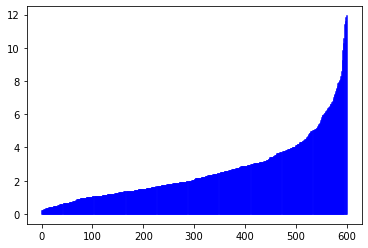

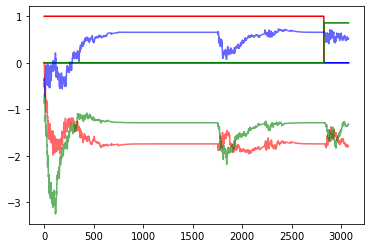

In [13]:
test = MultyReduceTasks(
    tasks=task_dict,
    batch_size=batch_size,
    delay_between=0,
    enable_fixation_delay=True,
    mode="random",
    task_number=1
)
check_mean_fr(Task)

# Основной цикл обучения

  0%|▏                                                                                                                                                              | 4/3000 [01:34<19:29:08, 23.41s/it]

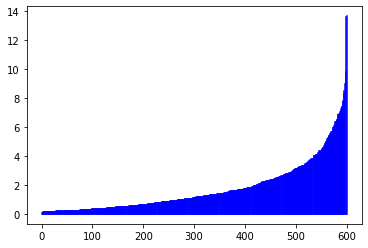

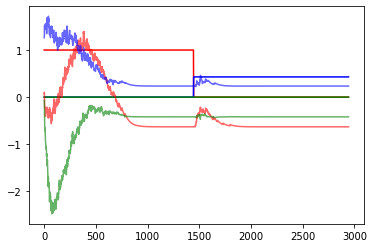

  0%|▍                                                                                                                                                              | 9/3000 [03:25<17:54:07, 21.55s/it]

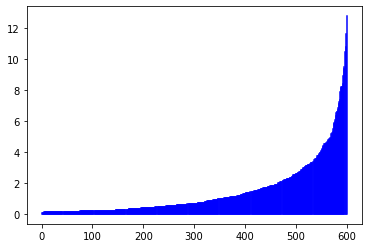

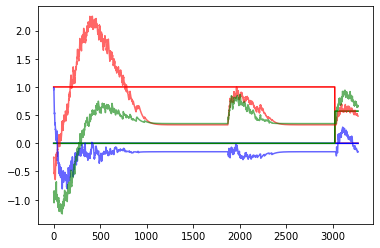

  0%|▋                                                                                                                                                             | 14/3000 [05:17<17:33:13, 21.16s/it]

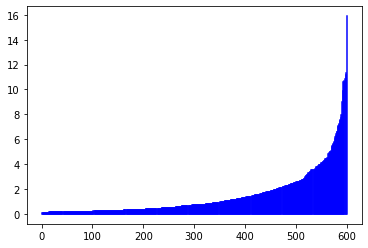

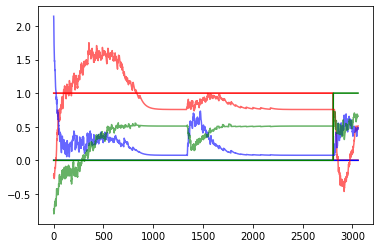

  1%|█                                                                                                                                                             | 19/3000 [07:11<18:08:45, 21.91s/it]

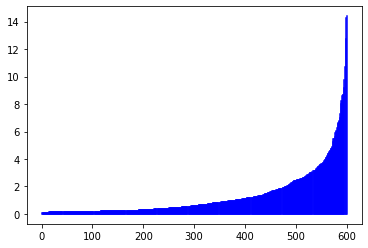

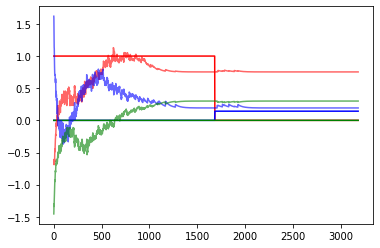

  1%|█▎                                                                                                                                                            | 24/3000 [09:03<18:01:06, 21.80s/it]

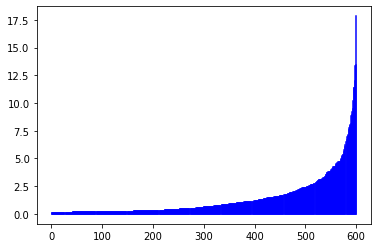

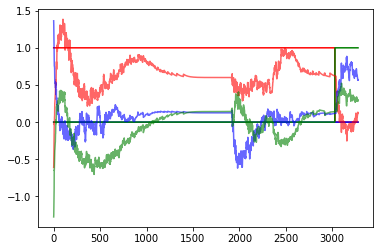

  1%|█▌                                                                                                                                                            | 29/3000 [10:53<17:41:52, 21.44s/it]

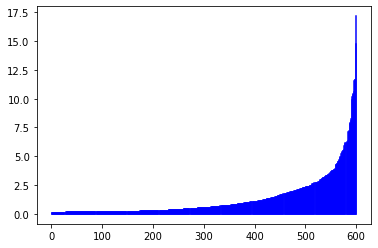

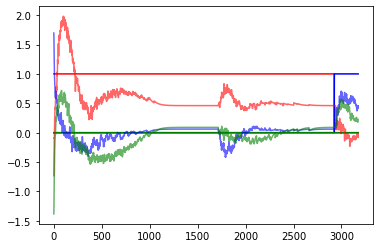

  1%|█▊                                                                                                                                                            | 34/3000 [12:44<17:30:29, 21.25s/it]

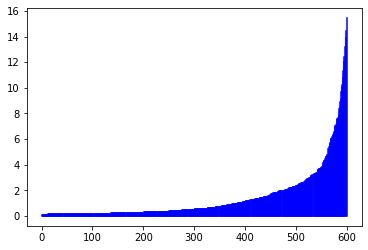

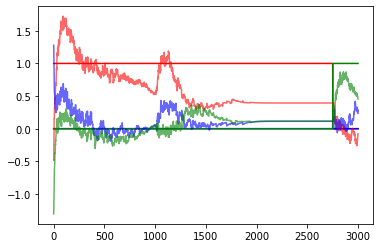

  1%|██                                                                                                                                                            | 39/3000 [14:40<18:19:21, 22.28s/it]

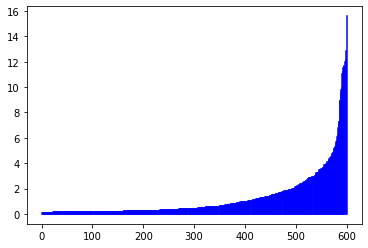

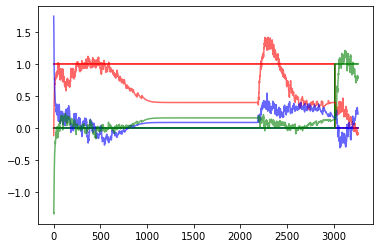

  1%|██▎                                                                                                                                                           | 44/3000 [16:33<17:51:39, 21.75s/it]

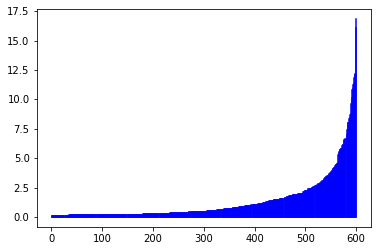

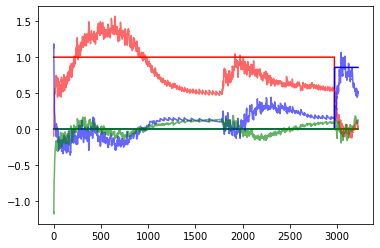

  2%|██▌                                                                                                                                                           | 49/3000 [18:22<17:31:03, 21.37s/it]

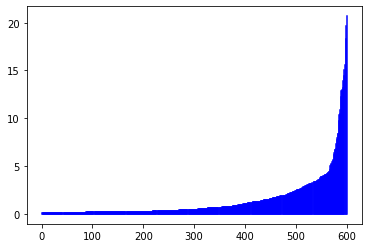

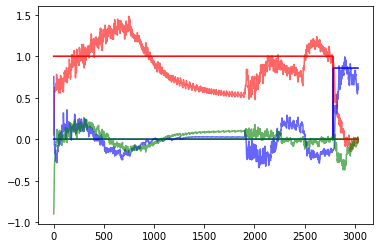

  2%|██▊                                                                                                                                                           | 54/3000 [21:08<20:57:11, 25.60s/it]

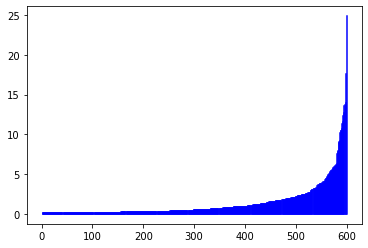

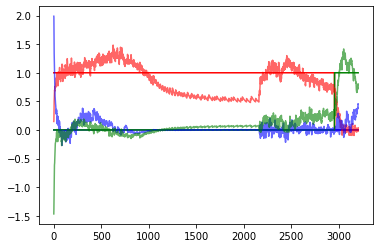

  2%|███                                                                                                                                                           | 59/3000 [23:02<18:36:12, 22.77s/it]

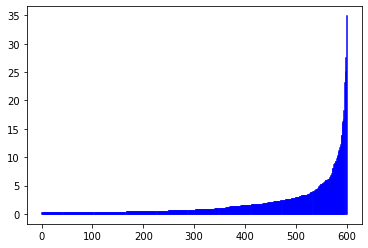

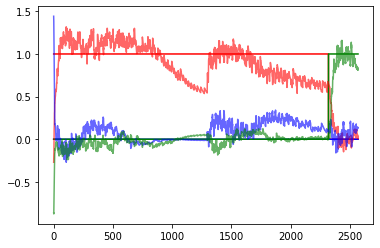

  2%|███▎                                                                                                                                                          | 64/3000 [24:54<17:53:22, 21.94s/it]

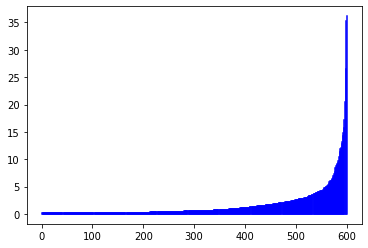

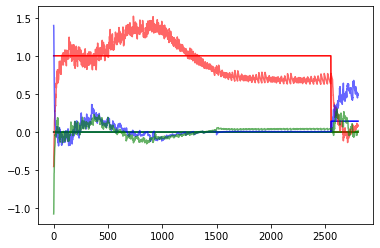

  2%|███▋                                                                                                                                                          | 69/3000 [26:43<17:05:04, 20.98s/it]

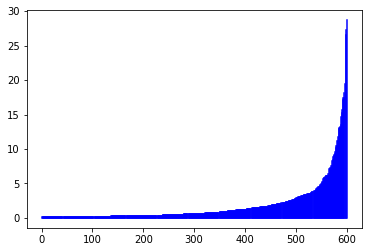

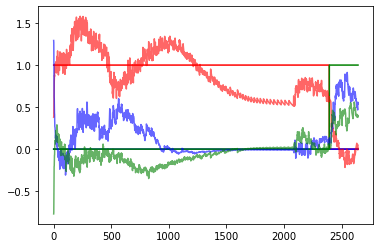

  2%|███▉                                                                                                                                                          | 74/3000 [28:36<17:35:55, 21.65s/it]

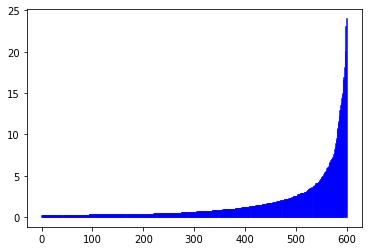

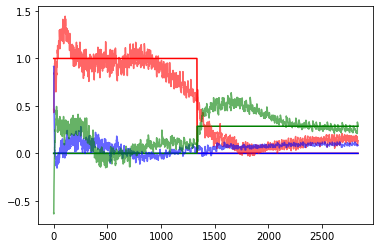

  3%|████▏                                                                                                                                                         | 79/3000 [30:27<17:19:30, 21.35s/it]

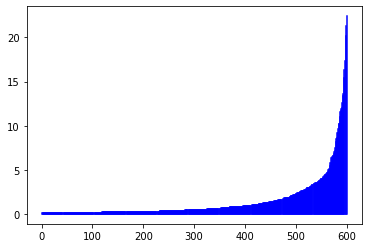

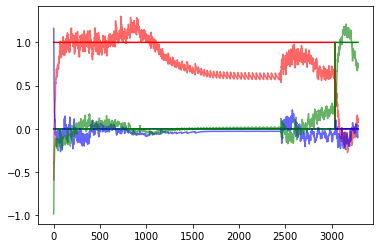

  3%|████▍                                                                                                                                                         | 84/3000 [32:21<17:44:11, 21.90s/it]

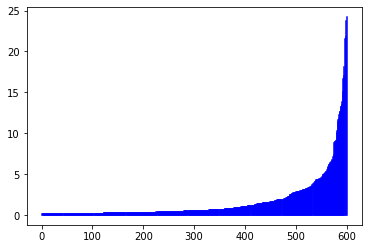

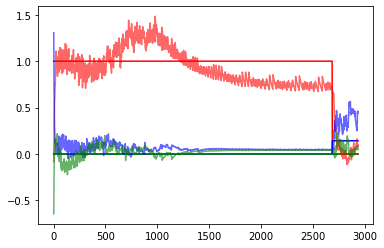

  3%|████▋                                                                                                                                                         | 89/3000 [34:13<17:31:01, 21.66s/it]

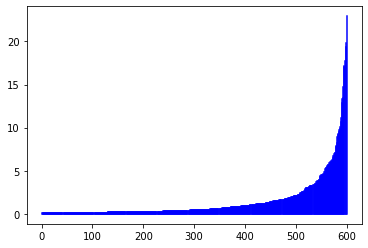

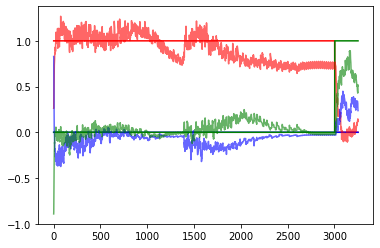

  3%|████▉                                                                                                                                                         | 94/3000 [36:03<17:09:49, 21.26s/it]

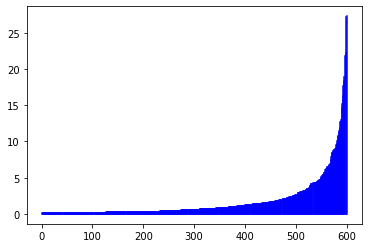

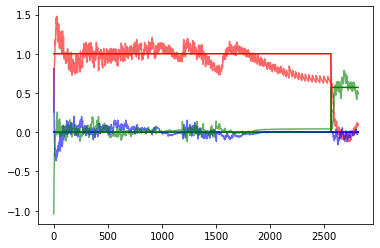

  3%|█████▏                                                                                                                                                        | 99/3000 [37:53<16:46:30, 20.82s/it]

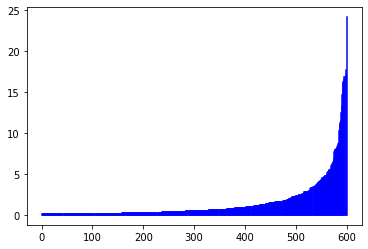

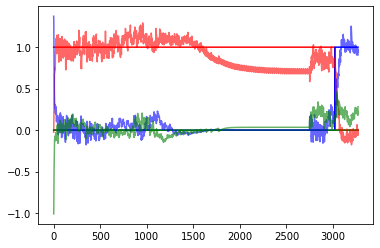

  3%|█████▍                                                                                                                                                       | 104/3000 [40:33<19:41:13, 24.47s/it]

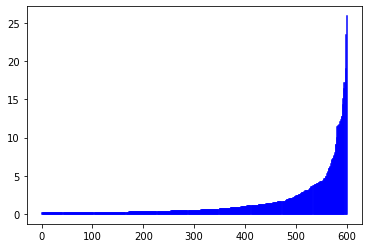

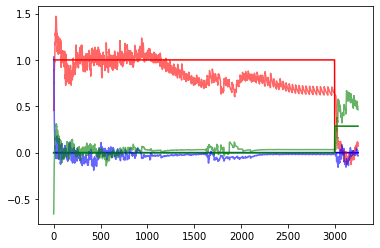

  4%|█████▋                                                                                                                                                       | 109/3000 [42:20<16:55:25, 21.07s/it]

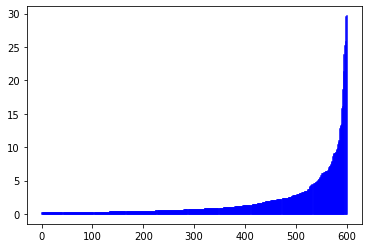

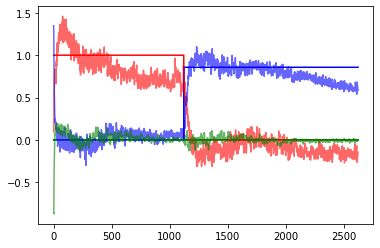

  4%|█████▉                                                                                                                                                       | 114/3000 [44:13<17:44:44, 22.14s/it]

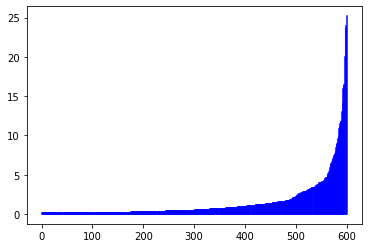

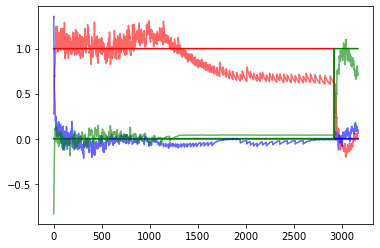

  4%|██████▏                                                                                                                                                      | 119/3000 [46:04<17:22:57, 21.72s/it]

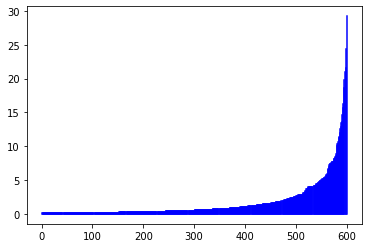

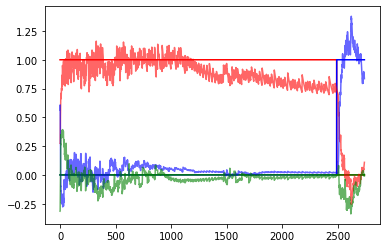

  4%|██████▍                                                                                                                                                      | 124/3000 [47:58<17:31:11, 21.93s/it]

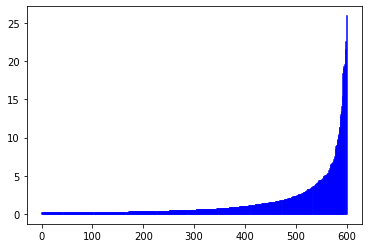

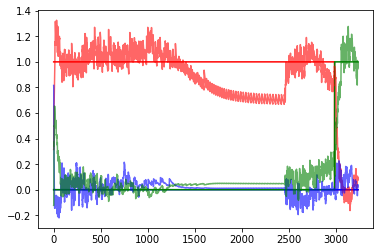

  4%|██████▊                                                                                                                                                      | 129/3000 [49:51<17:29:56, 21.94s/it]

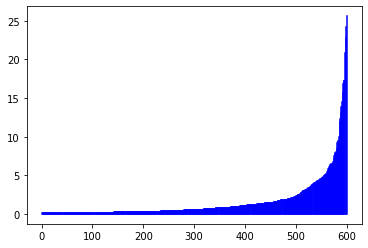

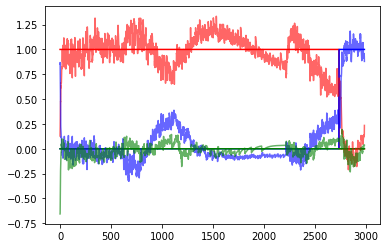

  4%|███████                                                                                                                                                      | 134/3000 [51:42<17:12:19, 21.61s/it]

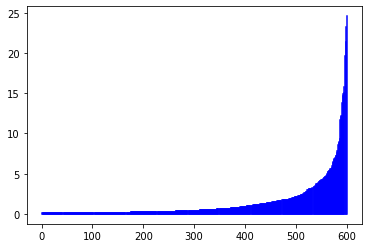

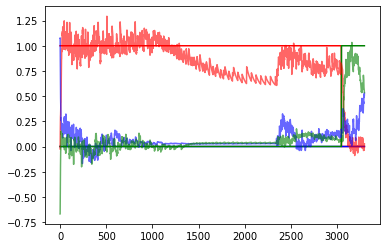

  5%|███████▎                                                                                                                                                     | 139/3000 [53:33<16:33:33, 20.84s/it]

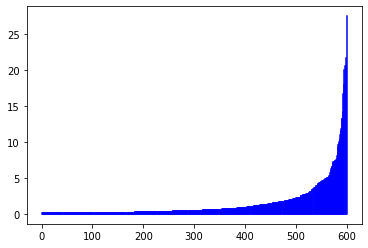

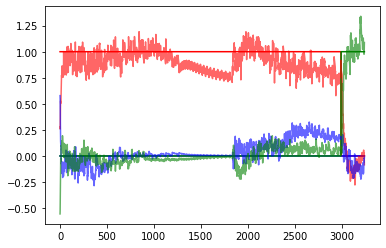

  5%|███████▌                                                                                                                                                     | 144/3000 [55:22<16:56:02, 21.35s/it]

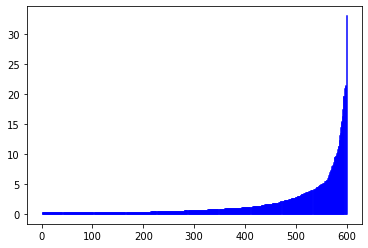

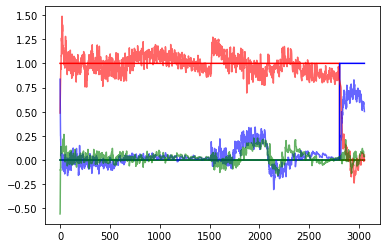

  5%|███████▊                                                                                                                                                     | 149/3000 [57:07<15:55:52, 20.12s/it]

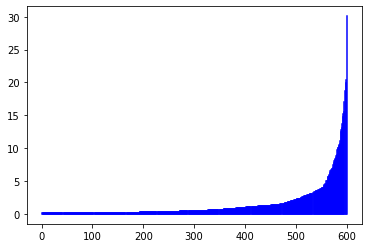

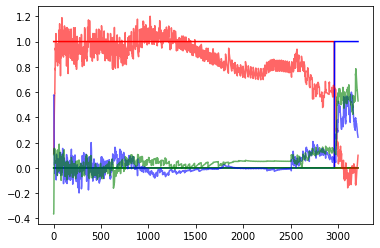

  5%|████████                                                                                                                                                     | 154/3000 [59:51<19:49:27, 25.08s/it]

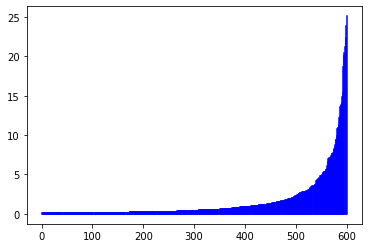

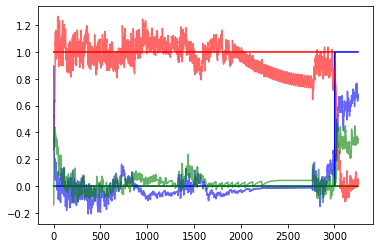

  5%|████████▏                                                                                                                                                  | 159/3000 [1:01:44<17:38:32, 22.36s/it]

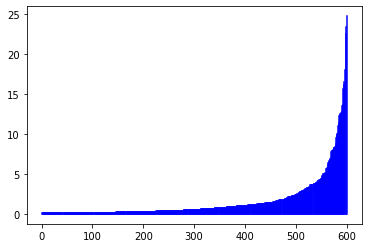

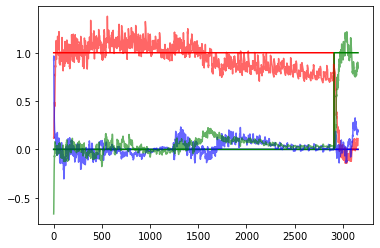

  5%|████████▍                                                                                                                                                  | 164/3000 [1:03:33<16:23:57, 20.82s/it]

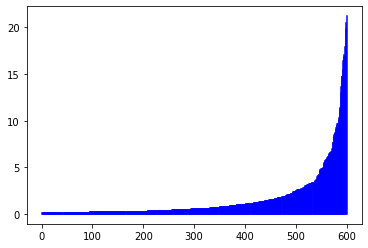

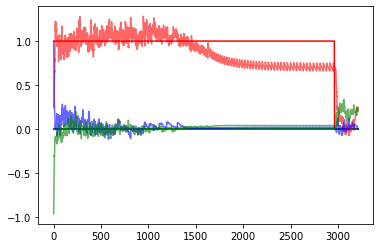

  6%|████████▋                                                                                                                                                  | 169/3000 [1:05:20<16:09:44, 20.55s/it]

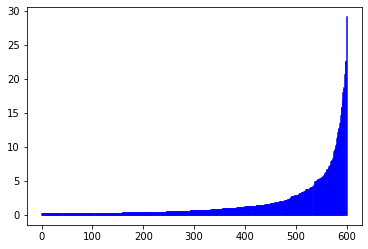

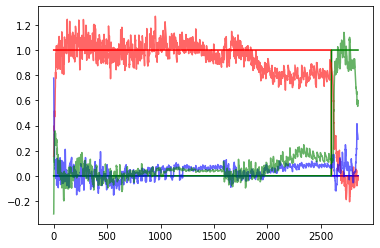

  6%|████████▉                                                                                                                                                  | 174/3000 [1:07:11<16:29:47, 21.01s/it]

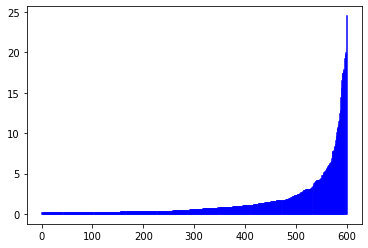

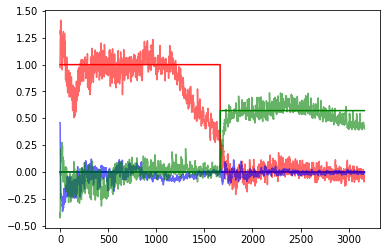

  6%|█████████▏                                                                                                                                                 | 179/3000 [1:09:03<16:32:35, 21.11s/it]

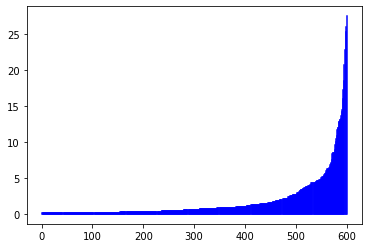

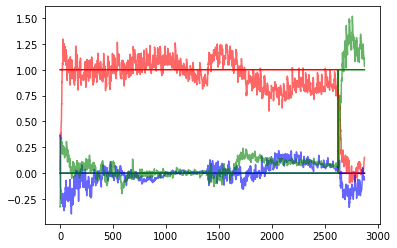

  6%|█████████▌                                                                                                                                                 | 184/3000 [1:10:56<16:52:40, 21.58s/it]

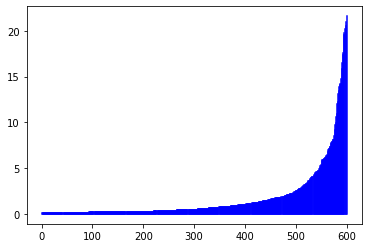

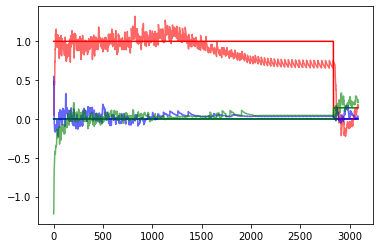

  6%|█████████▊                                                                                                                                                 | 189/3000 [1:12:44<16:21:39, 20.95s/it]

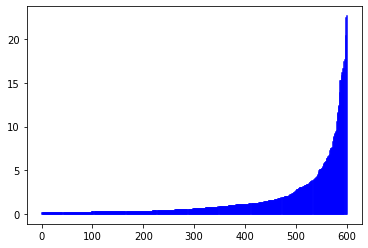

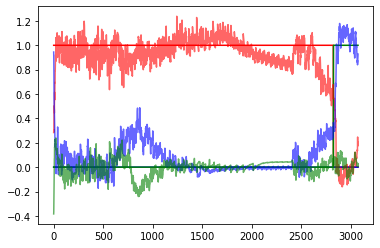

  6%|██████████                                                                                                                                                 | 194/3000 [1:14:36<16:27:46, 21.12s/it]

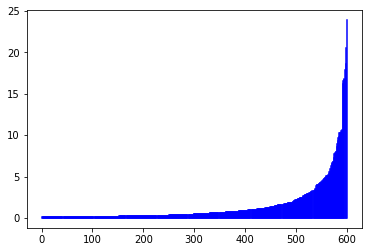

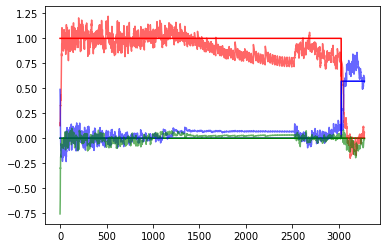

  7%|██████████▎                                                                                                                                                | 199/3000 [1:16:26<16:31:47, 21.24s/it]

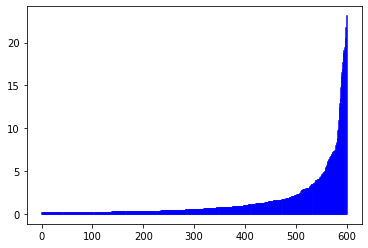

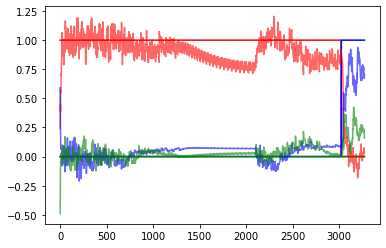

  7%|██████████▌                                                                                                                                                | 204/3000 [1:19:07<19:29:29, 25.10s/it]

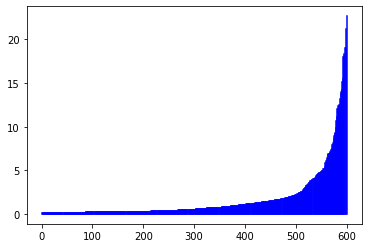

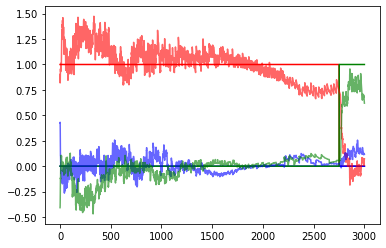

  7%|██████████▊                                                                                                                                                | 209/3000 [1:20:59<16:55:18, 21.83s/it]

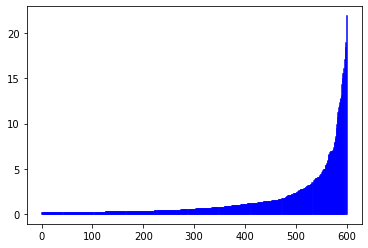

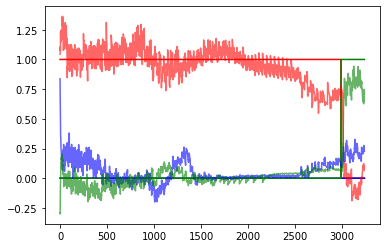

  7%|███████████                                                                                                                                                | 214/3000 [1:22:50<16:31:41, 21.36s/it]

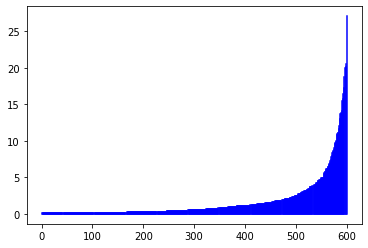

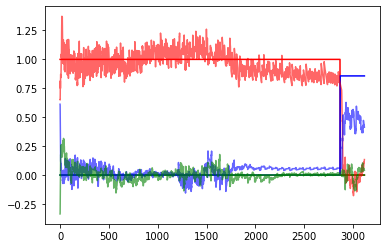

  7%|███████████▎                                                                                                                                               | 219/3000 [1:24:40<16:32:57, 21.42s/it]

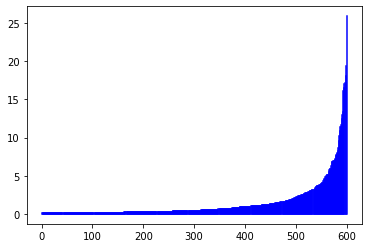

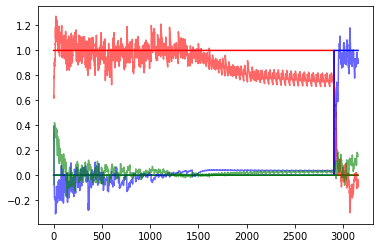

  7%|███████████▌                                                                                                                                               | 224/3000 [1:26:37<17:15:42, 22.39s/it]

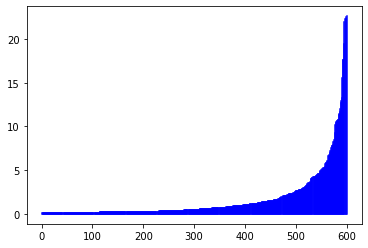

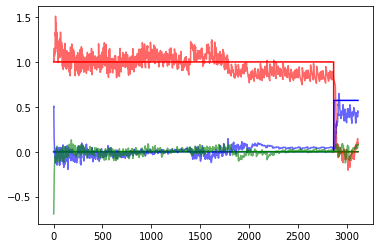

  8%|███████████▊                                                                                                                                               | 229/3000 [1:28:27<16:16:18, 21.14s/it]

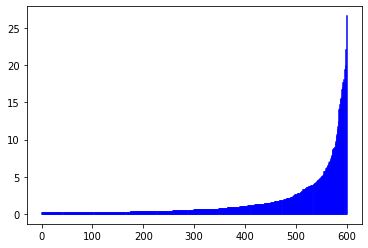

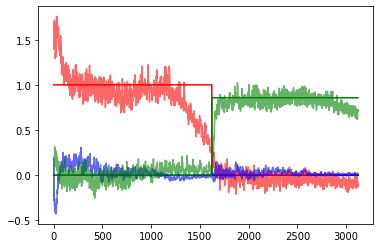

  8%|████████████                                                                                                                                               | 234/3000 [1:30:19<16:31:37, 21.51s/it]

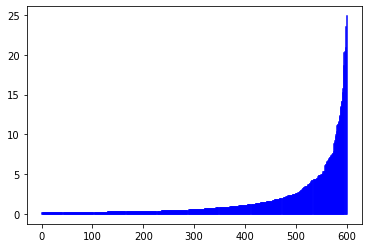

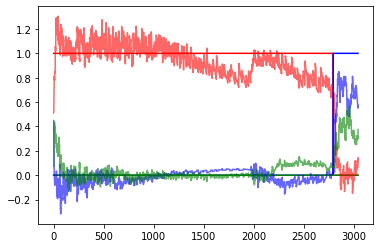

  8%|████████████▎                                                                                                                                              | 239/3000 [1:32:07<15:49:54, 20.64s/it]

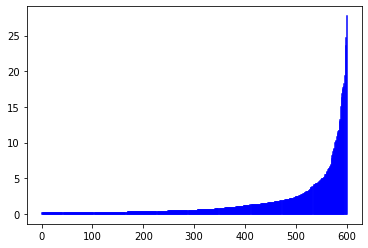

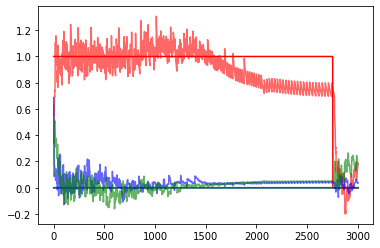

  8%|████████████▌                                                                                                                                              | 244/3000 [1:33:56<16:11:19, 21.15s/it]

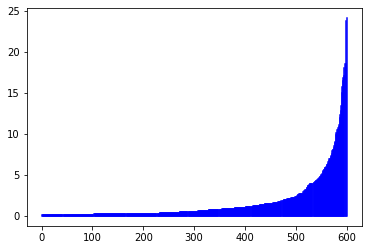

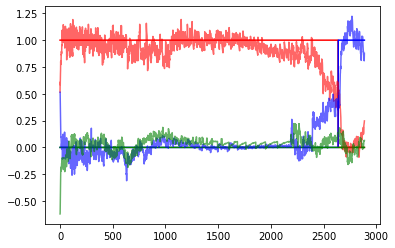

  8%|████████████▊                                                                                                                                              | 249/3000 [1:35:47<16:18:46, 21.35s/it]

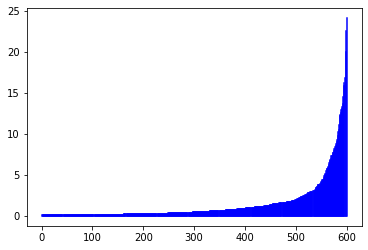

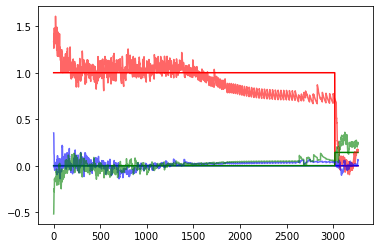

  8%|█████████████                                                                                                                                              | 254/3000 [1:38:28<18:48:05, 24.65s/it]

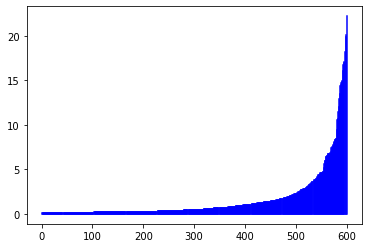

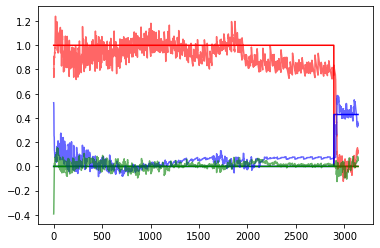

  9%|█████████████▍                                                                                                                                             | 259/3000 [1:40:20<16:43:31, 21.97s/it]

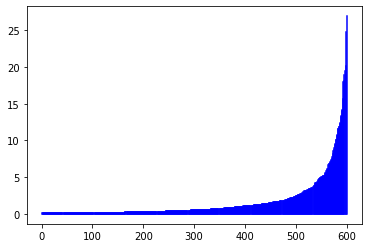

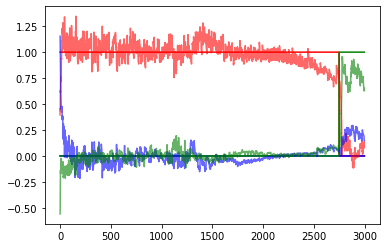

  9%|█████████████▋                                                                                                                                             | 264/3000 [1:42:08<16:12:22, 21.32s/it]

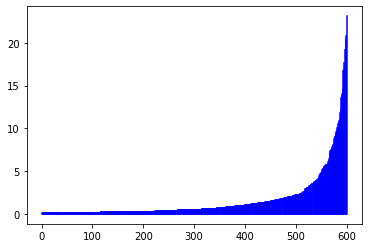

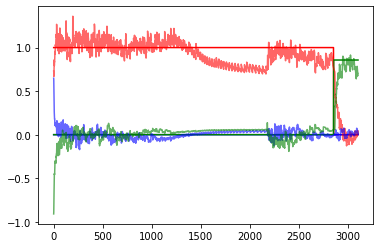

  9%|█████████████▉                                                                                                                                             | 269/3000 [1:43:57<16:02:54, 21.16s/it]

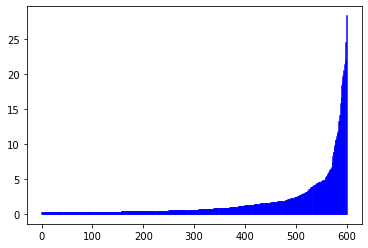

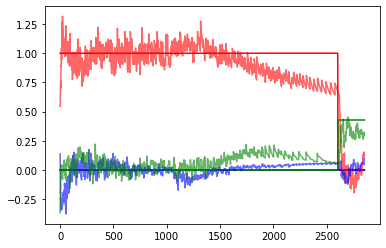

  9%|██████████████▏                                                                                                                                            | 274/3000 [1:45:52<16:29:02, 21.77s/it]

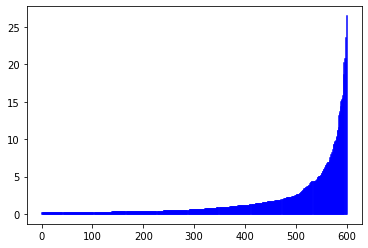

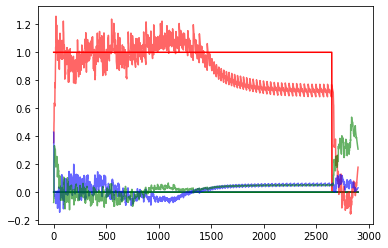

  9%|██████████████▍                                                                                                                                            | 279/3000 [1:47:43<16:24:19, 21.71s/it]

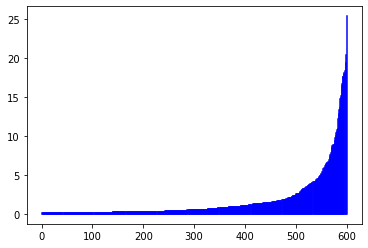

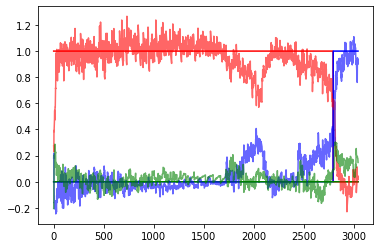

  9%|██████████████▋                                                                                                                                            | 284/3000 [1:49:29<15:28:08, 20.50s/it]

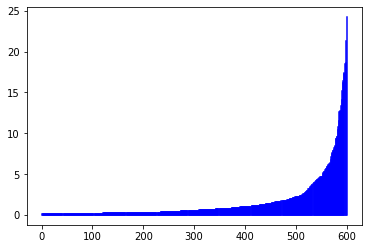

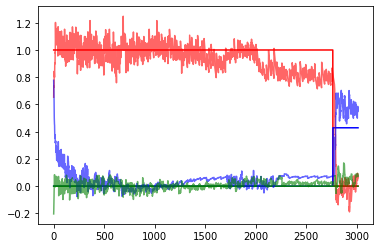

 10%|██████████████▉                                                                                                                                            | 289/3000 [1:51:17<15:37:36, 20.75s/it]

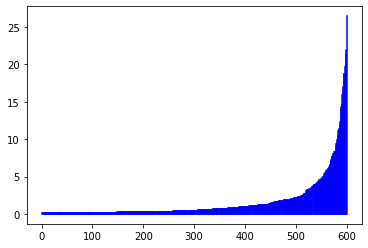

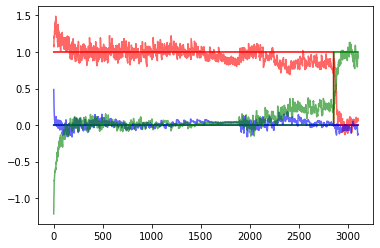

 10%|███████████████▏                                                                                                                                           | 294/3000 [1:53:13<16:39:26, 22.16s/it]

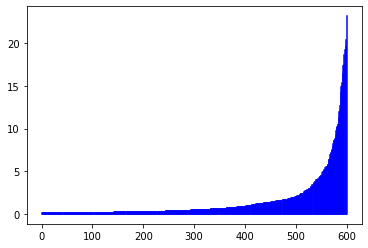

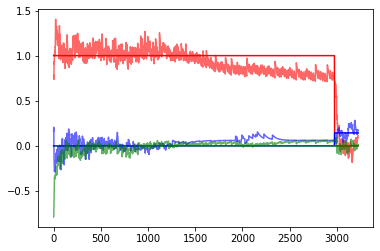

 10%|███████████████▍                                                                                                                                           | 299/3000 [1:55:07<16:14:55, 21.66s/it]

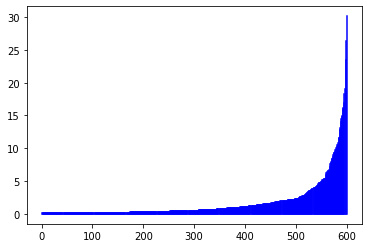

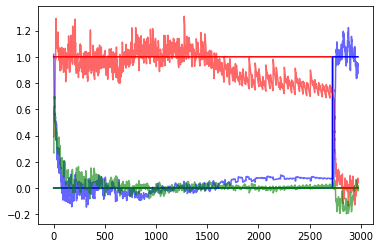

 10%|███████████████▋                                                                                                                                           | 304/3000 [1:57:52<18:57:10, 25.31s/it]

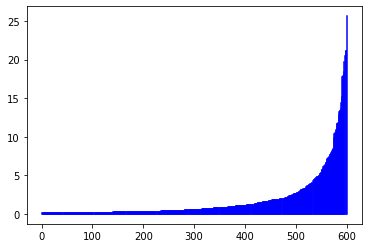

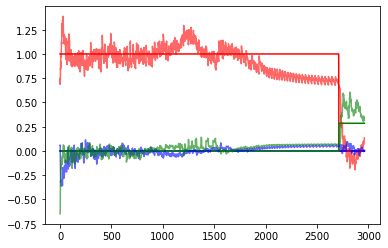

 10%|███████████████▉                                                                                                                                           | 309/3000 [1:59:42<16:12:55, 21.69s/it]

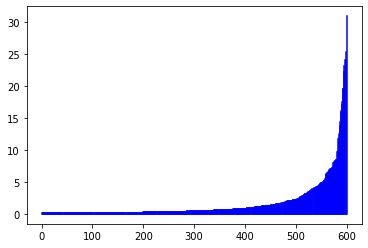

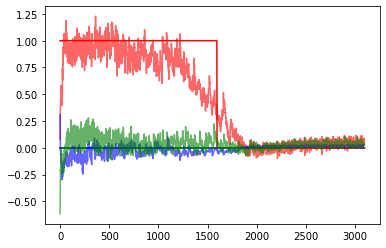

 10%|████████████████▏                                                                                                                                          | 314/3000 [2:01:35<16:05:43, 21.57s/it]

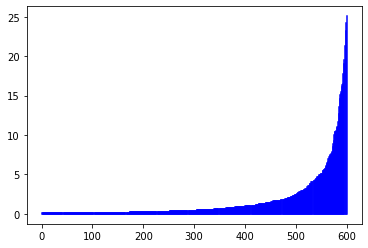

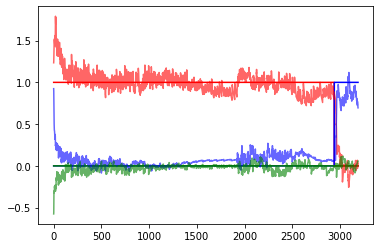

 11%|████████████████▍                                                                                                                                          | 319/3000 [2:03:29<16:23:20, 22.01s/it]

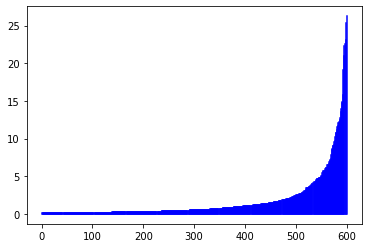

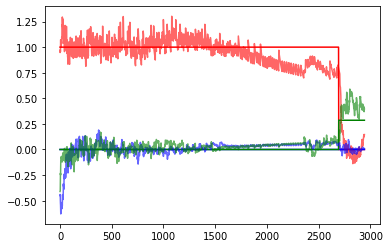

 11%|████████████████▋                                                                                                                                          | 324/3000 [2:05:21<16:15:43, 21.88s/it]

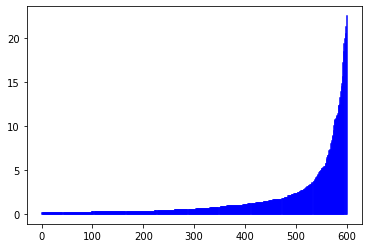

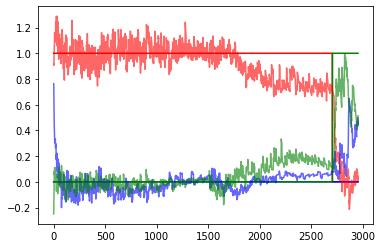

 11%|████████████████▉                                                                                                                                          | 329/3000 [2:07:10<15:35:54, 21.02s/it]

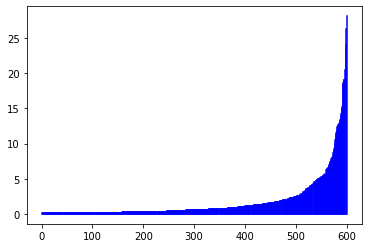

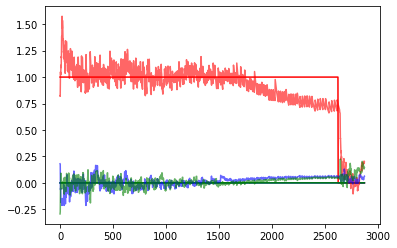

 11%|█████████████████▎                                                                                                                                         | 334/3000 [2:09:02<16:02:10, 21.65s/it]

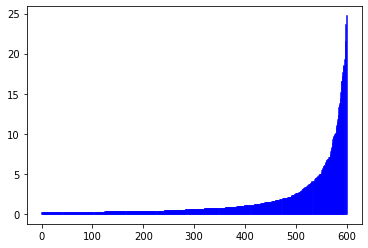

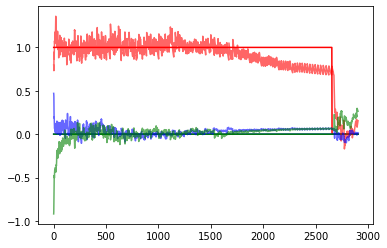

 11%|█████████████████▌                                                                                                                                         | 339/3000 [2:10:57<16:16:46, 22.02s/it]

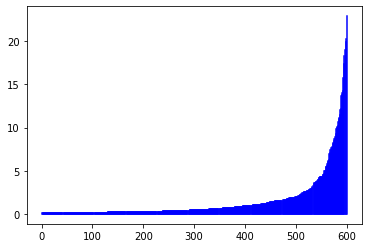

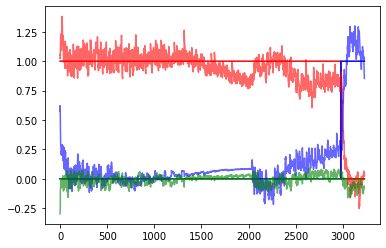

 11%|█████████████████▊                                                                                                                                         | 344/3000 [2:12:53<16:28:43, 22.34s/it]

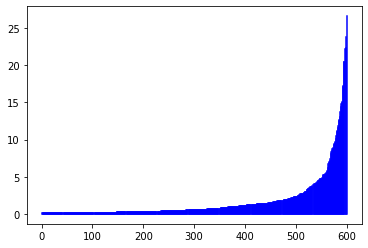

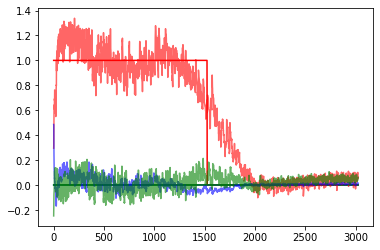

 12%|██████████████████                                                                                                                                         | 349/3000 [2:14:45<15:58:30, 21.69s/it]

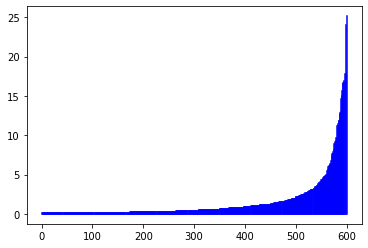

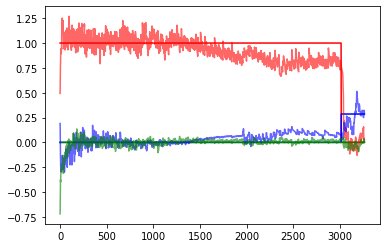

 12%|██████████████████▎                                                                                                                                        | 354/3000 [2:17:35<19:23:59, 26.39s/it]

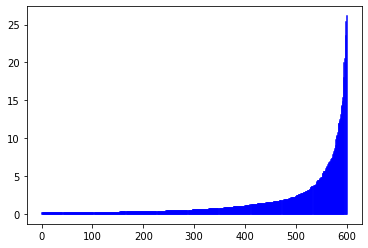

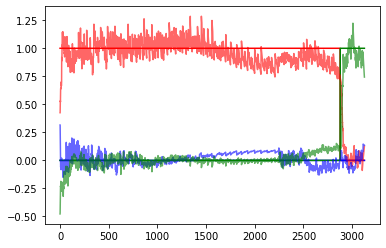

 12%|██████████████████▌                                                                                                                                        | 359/3000 [2:19:25<15:57:16, 21.75s/it]

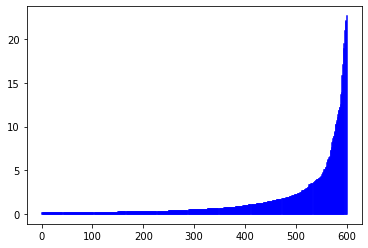

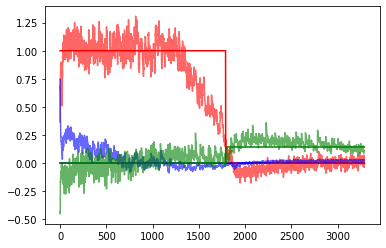

 12%|██████████████████▊                                                                                                                                        | 364/3000 [2:21:19<16:08:38, 22.05s/it]

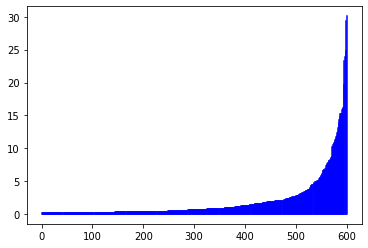

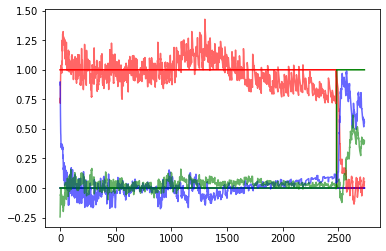

 12%|███████████████████                                                                                                                                        | 369/3000 [2:23:12<16:05:20, 22.01s/it]

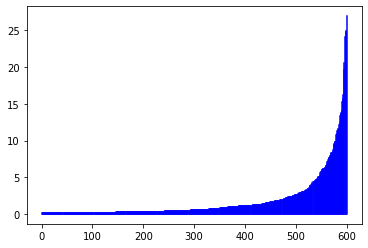

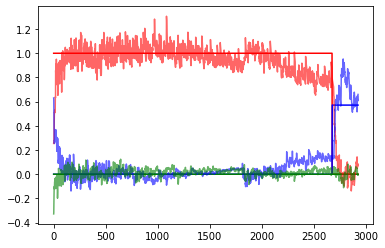

 12%|███████████████████▎                                                                                                                                       | 374/3000 [2:25:02<15:34:49, 21.36s/it]

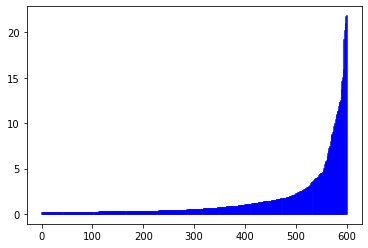

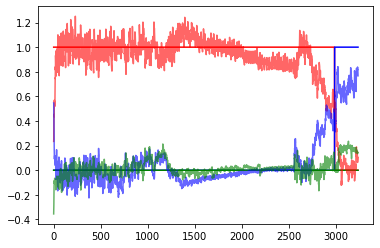

 13%|███████████████████▌                                                                                                                                       | 379/3000 [2:26:56<15:56:55, 21.91s/it]

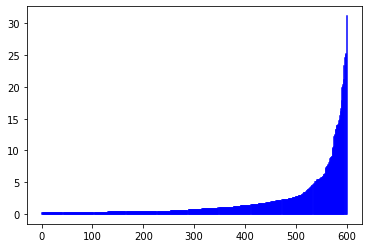

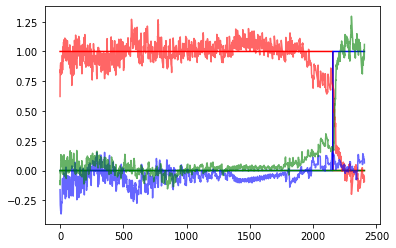

 13%|███████████████████▊                                                                                                                                       | 384/3000 [2:28:48<15:47:01, 21.72s/it]

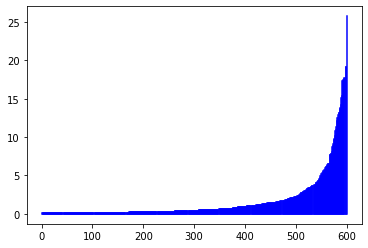

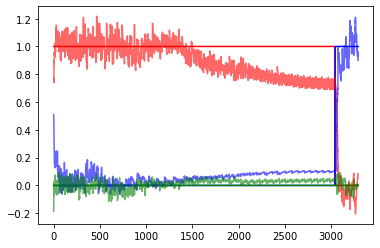

 13%|████████████████████                                                                                                                                       | 389/3000 [2:30:38<15:35:57, 21.51s/it]

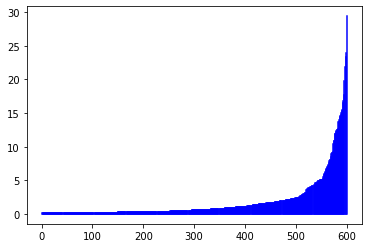

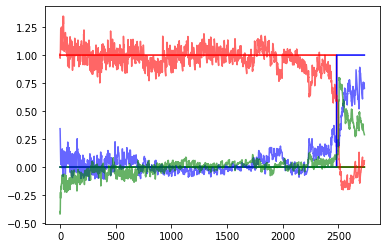

 13%|████████████████████▎                                                                                                                                      | 394/3000 [2:32:25<15:13:25, 21.03s/it]

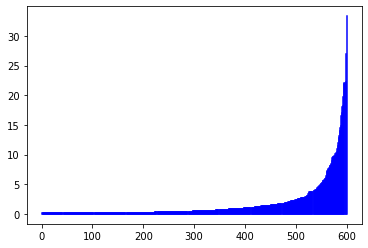

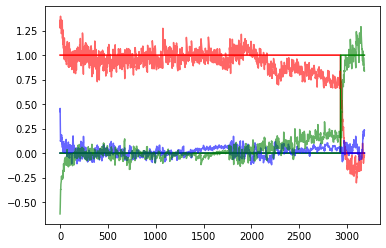

 13%|████████████████████▌                                                                                                                                      | 399/3000 [2:34:16<15:30:03, 21.45s/it]

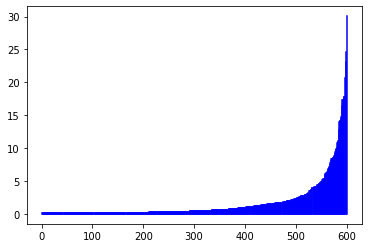

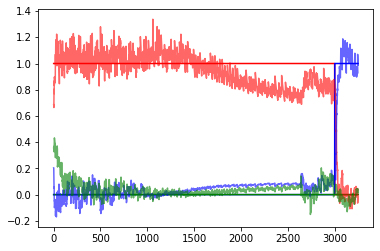

 13%|████████████████████▊                                                                                                                                      | 404/3000 [2:36:53<17:22:40, 24.10s/it]

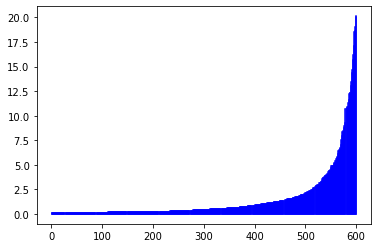

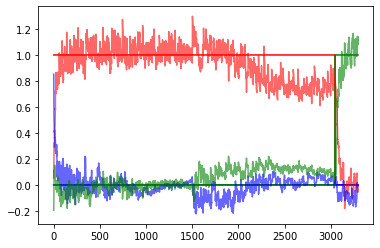

 14%|█████████████████████▏                                                                                                                                     | 409/3000 [2:38:44<15:41:49, 21.81s/it]

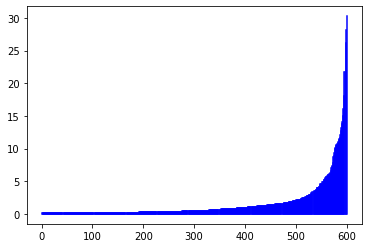

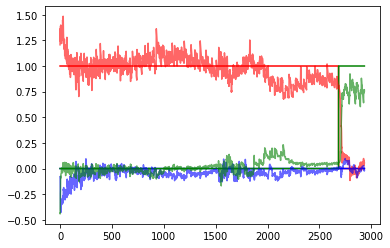

 14%|█████████████████████▍                                                                                                                                     | 414/3000 [2:40:39<15:56:36, 22.20s/it]

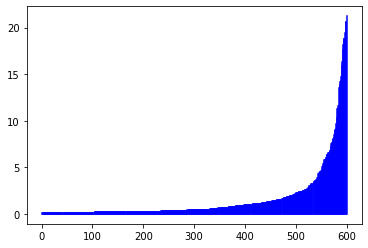

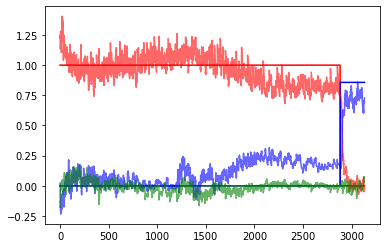

 14%|█████████████████████▋                                                                                                                                     | 419/3000 [2:42:34<15:45:30, 21.98s/it]

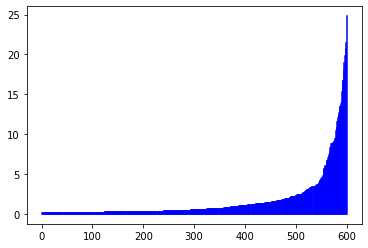

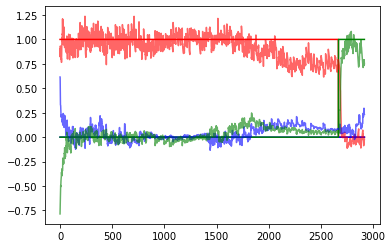

 14%|█████████████████████▉                                                                                                                                     | 424/3000 [2:44:23<15:20:39, 21.44s/it]

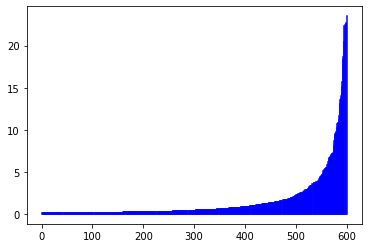

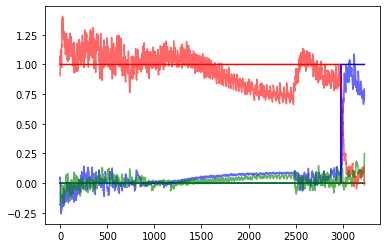

 14%|██████████████████████▏                                                                                                                                    | 429/3000 [2:46:17<15:42:15, 21.99s/it]

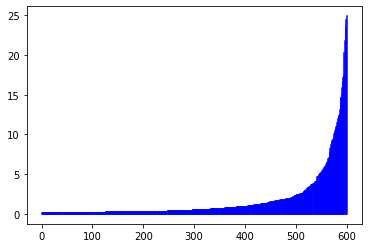

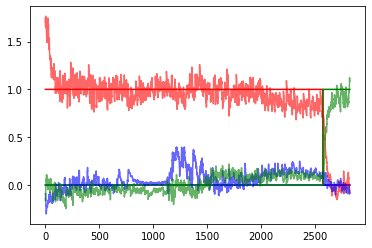

 14%|██████████████████████▍                                                                                                                                    | 434/3000 [2:48:07<15:14:56, 21.39s/it]

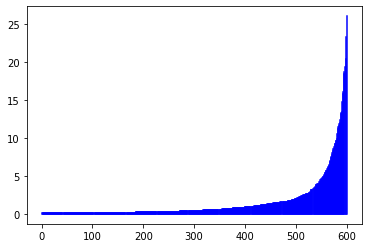

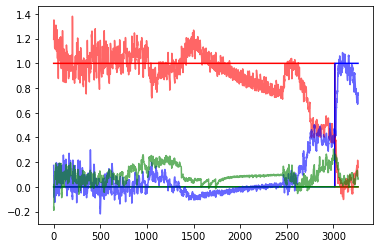

 15%|██████████████████████▋                                                                                                                                    | 439/3000 [2:50:05<16:02:50, 22.56s/it]

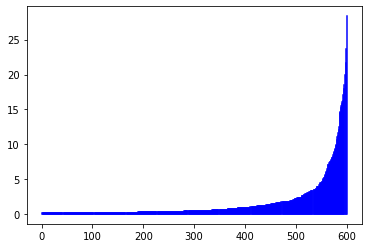

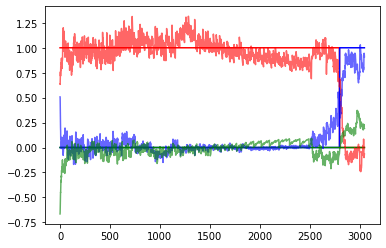

 15%|██████████████████████▉                                                                                                                                    | 444/3000 [2:51:54<14:59:04, 21.10s/it]

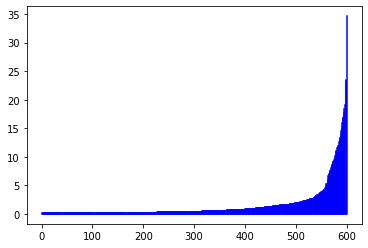

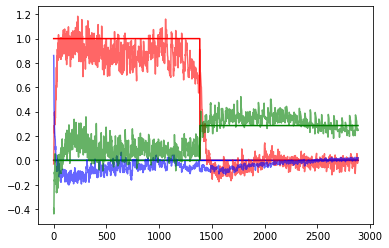

 15%|███████████████████████▏                                                                                                                                   | 449/3000 [2:53:45<14:44:06, 20.79s/it]

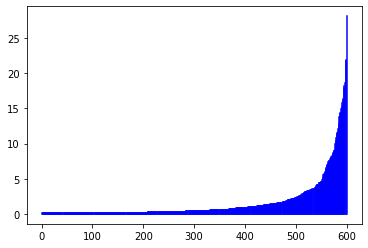

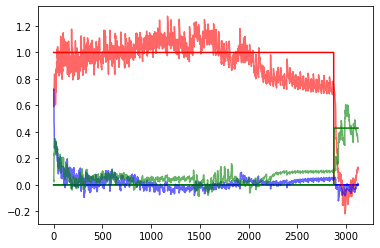

 15%|███████████████████████▍                                                                                                                                   | 454/3000 [2:56:28<17:31:01, 24.77s/it]

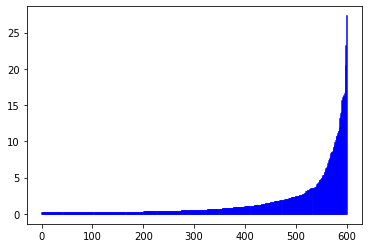

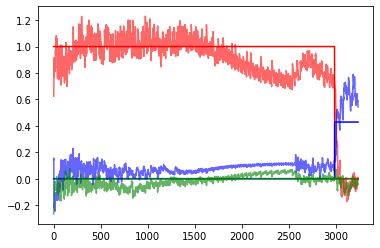

 15%|███████████████████████▋                                                                                                                                   | 459/3000 [2:58:13<14:51:50, 21.06s/it]

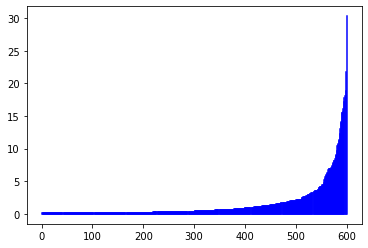

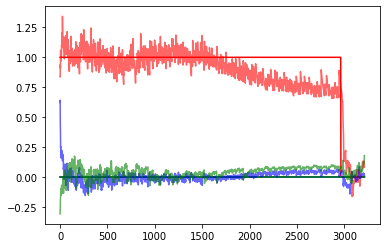

 15%|███████████████████████▉                                                                                                                                   | 464/3000 [3:00:04<15:02:27, 21.35s/it]

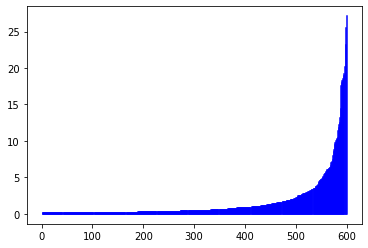

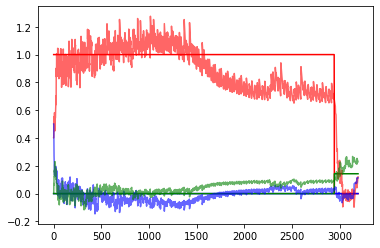

 16%|████████████████████████▏                                                                                                                                  | 469/3000 [3:01:49<14:24:43, 20.50s/it]

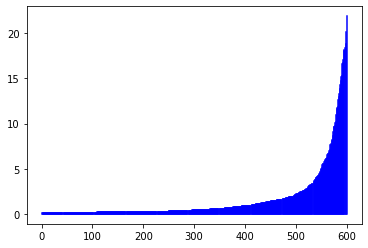

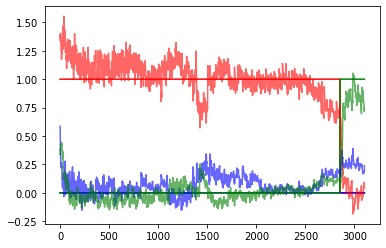

 16%|████████████████████████▍                                                                                                                                  | 474/3000 [3:03:37<14:47:48, 21.09s/it]

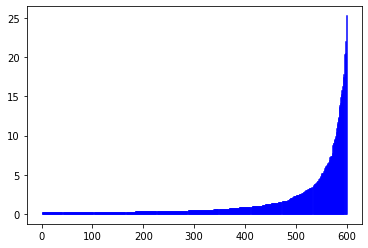

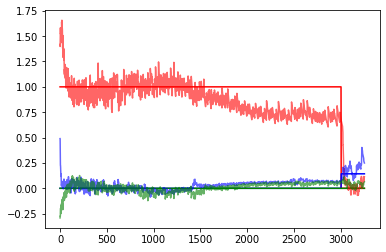

 16%|████████████████████████▋                                                                                                                                  | 479/3000 [3:05:28<14:55:29, 21.31s/it]

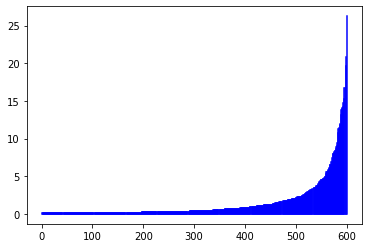

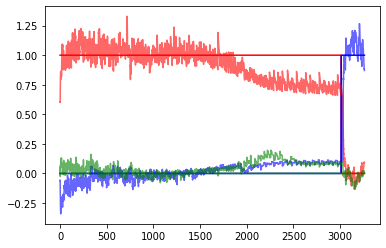

 16%|█████████████████████████                                                                                                                                  | 484/3000 [3:07:24<15:29:44, 22.17s/it]

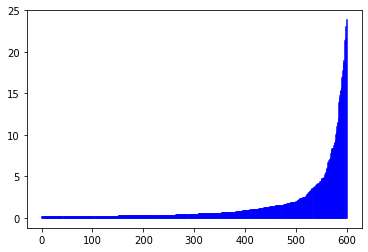

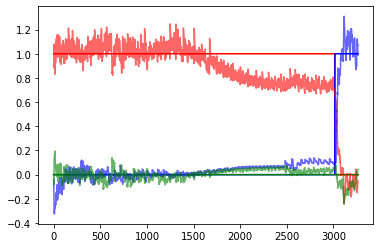

 16%|█████████████████████████▎                                                                                                                                 | 489/3000 [3:09:08<14:20:23, 20.56s/it]

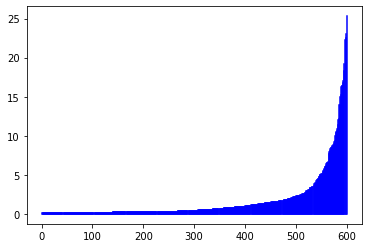

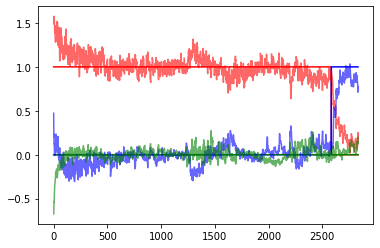

 16%|█████████████████████████▌                                                                                                                                 | 494/3000 [3:10:59<14:55:27, 21.44s/it]

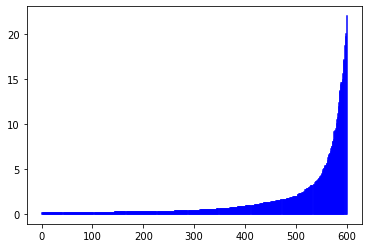

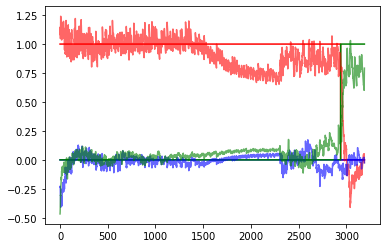

 17%|█████████████████████████▊                                                                                                                                 | 499/3000 [3:12:48<14:22:30, 20.69s/it]

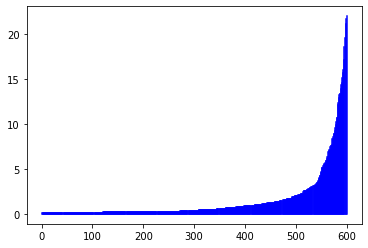

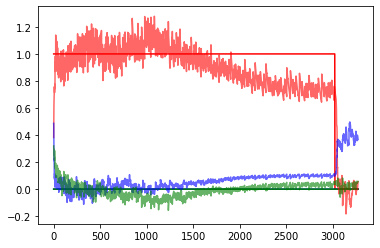

 17%|██████████████████████████                                                                                                                                 | 504/3000 [3:15:33<17:28:34, 25.21s/it]

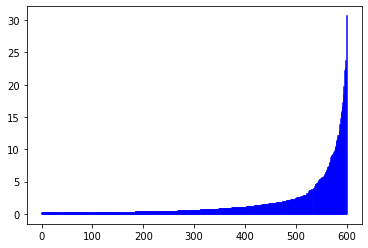

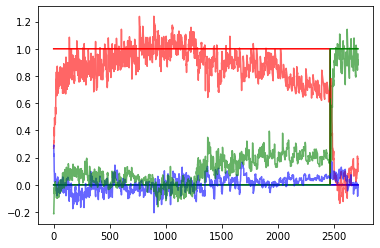

 17%|██████████████████████████▎                                                                                                                                | 509/3000 [3:17:25<15:21:37, 22.20s/it]

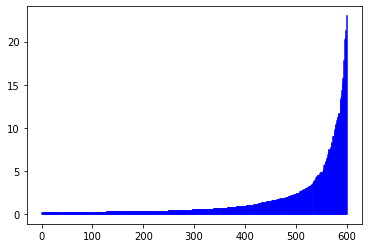

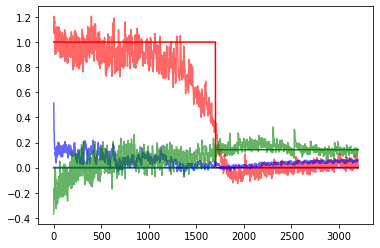

 17%|██████████████████████████▌                                                                                                                                | 514/3000 [3:19:12<14:25:50, 20.90s/it]

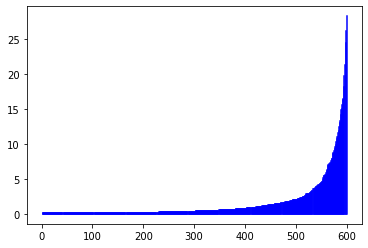

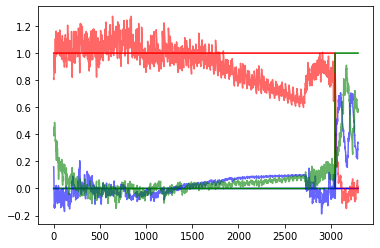

 17%|██████████████████████████▊                                                                                                                                | 519/3000 [3:21:02<14:28:28, 21.00s/it]

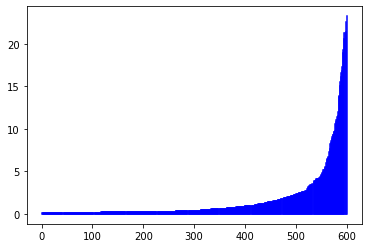

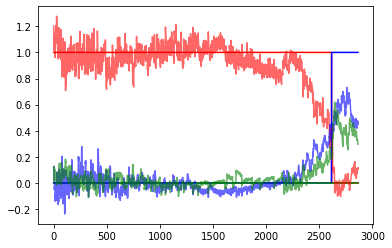

 17%|███████████████████████████                                                                                                                                | 524/3000 [3:22:50<14:22:21, 20.90s/it]

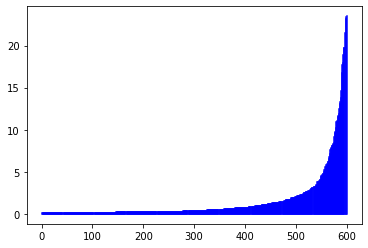

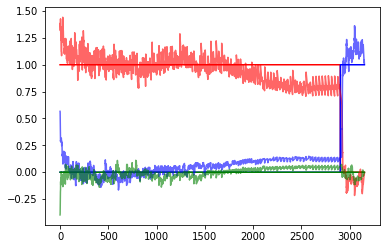

 18%|███████████████████████████▎                                                                                                                               | 529/3000 [3:24:41<14:39:38, 21.36s/it]

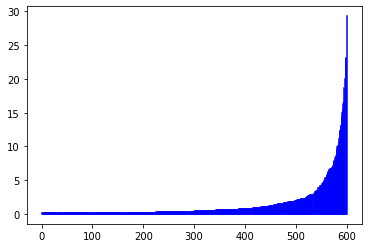

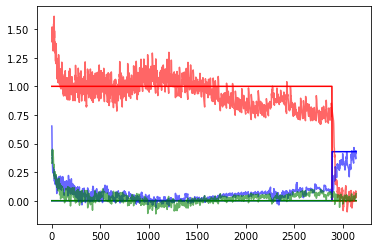

 18%|███████████████████████████▌                                                                                                                               | 534/3000 [3:26:32<14:41:36, 21.45s/it]

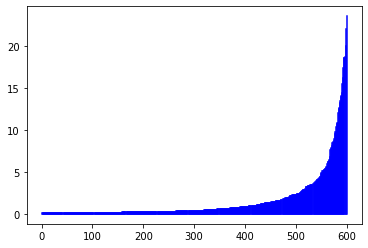

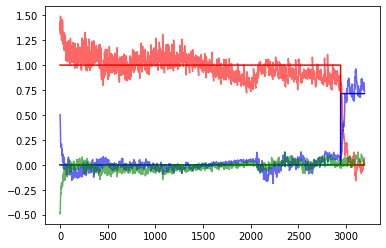

 18%|███████████████████████████▊                                                                                                                               | 539/3000 [3:28:20<14:25:59, 21.11s/it]

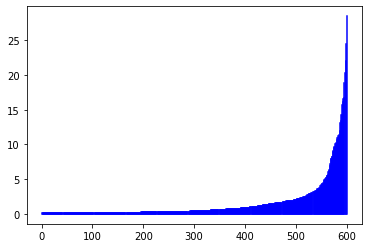

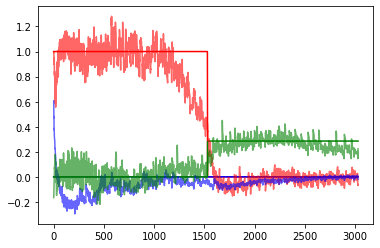

 18%|████████████████████████████                                                                                                                               | 544/3000 [3:30:10<14:30:57, 21.28s/it]

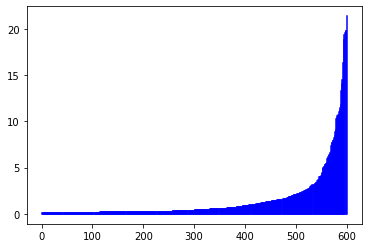

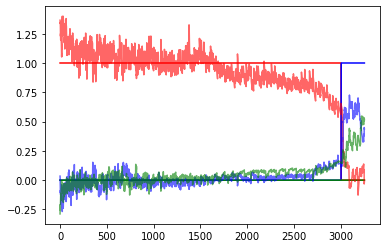

 18%|████████████████████████████▎                                                                                                                              | 549/3000 [3:32:02<14:42:13, 21.60s/it]

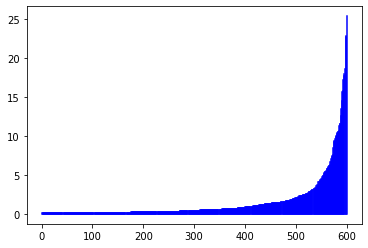

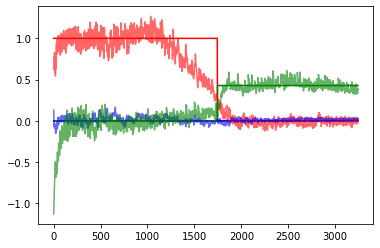

 18%|████████████████████████████▌                                                                                                                              | 554/3000 [3:34:46<17:10:47, 25.29s/it]

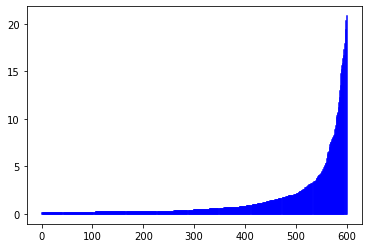

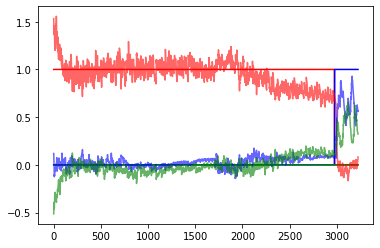

 19%|████████████████████████████▉                                                                                                                              | 559/3000 [3:36:38<14:57:24, 22.06s/it]

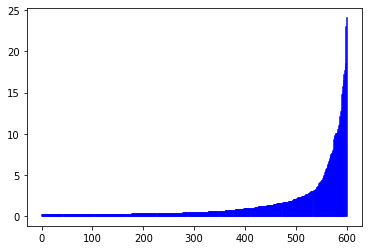

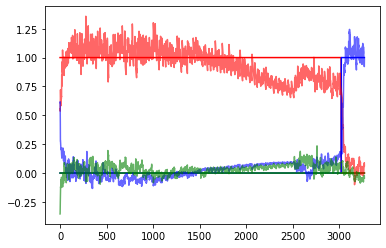

 19%|█████████████████████████████▏                                                                                                                             | 564/3000 [3:38:26<14:21:24, 21.22s/it]

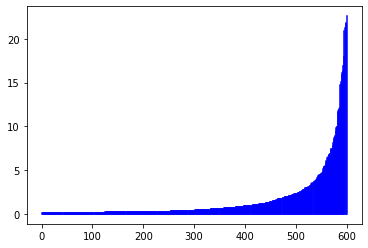

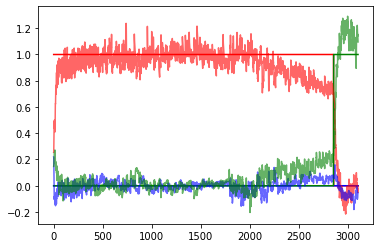

 19%|█████████████████████████████▍                                                                                                                             | 569/3000 [3:40:19<14:30:23, 21.48s/it]

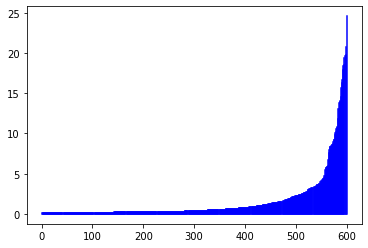

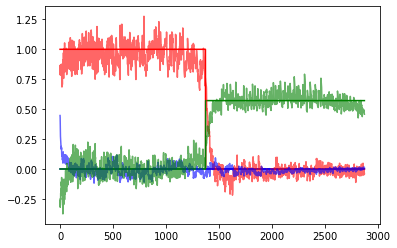

 19%|█████████████████████████████▋                                                                                                                             | 574/3000 [3:41:59<13:13:32, 19.63s/it]

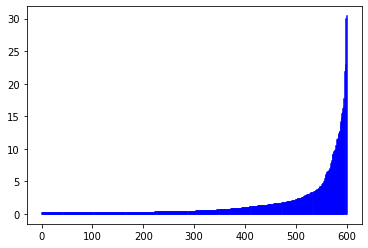

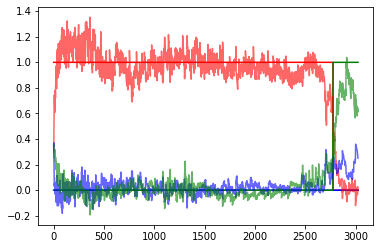

 19%|█████████████████████████████▉                                                                                                                             | 579/3000 [3:43:51<14:06:24, 20.98s/it]

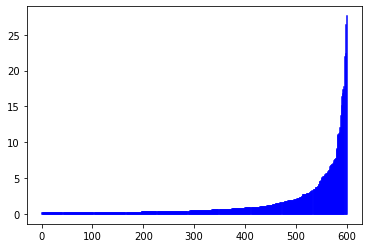

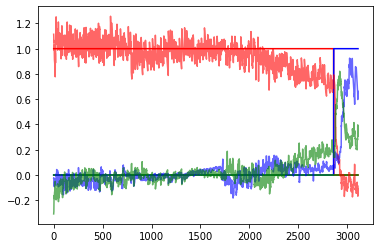

 19%|██████████████████████████████▏                                                                                                                            | 584/3000 [3:45:33<13:14:13, 19.72s/it]

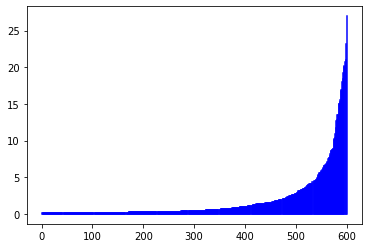

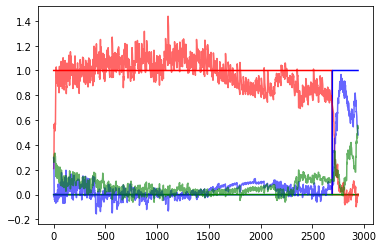

 20%|██████████████████████████████▍                                                                                                                            | 589/3000 [3:47:24<14:09:14, 21.13s/it]

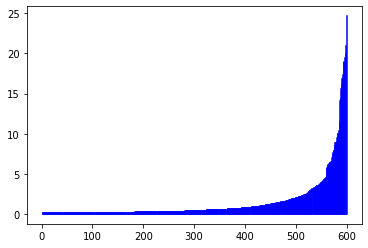

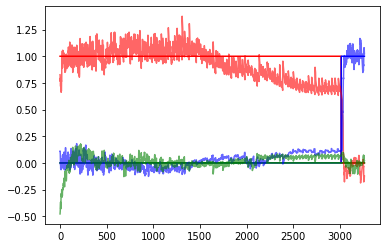

 20%|██████████████████████████████▋                                                                                                                            | 594/3000 [3:49:12<13:44:03, 20.55s/it]

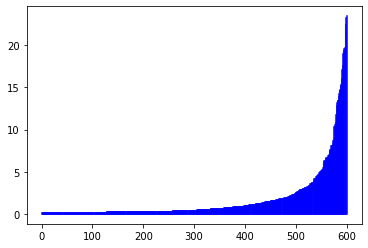

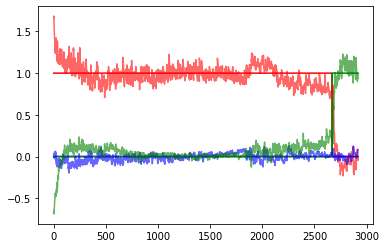

 20%|██████████████████████████████▉                                                                                                                            | 599/3000 [3:51:04<14:12:18, 21.30s/it]

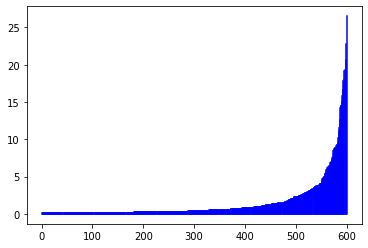

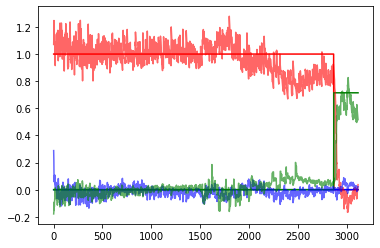

 20%|███████████████████████████████▏                                                                                                                           | 604/3000 [3:53:48<16:42:23, 25.10s/it]

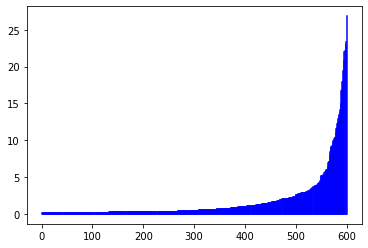

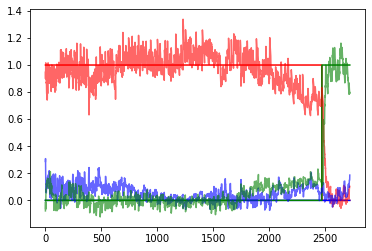

 20%|███████████████████████████████▍                                                                                                                           | 609/3000 [3:55:40<14:45:08, 22.21s/it]

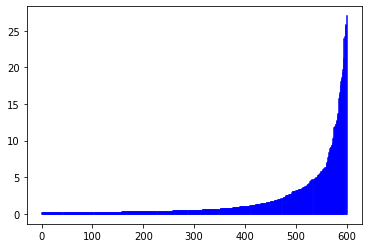

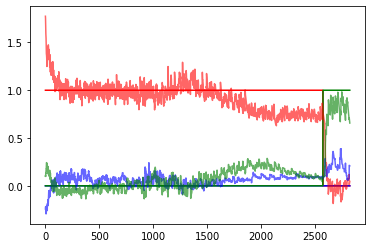

 20%|███████████████████████████████▋                                                                                                                           | 614/3000 [3:57:31<14:20:43, 21.64s/it]

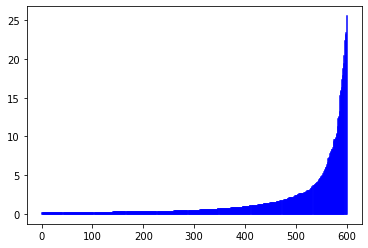

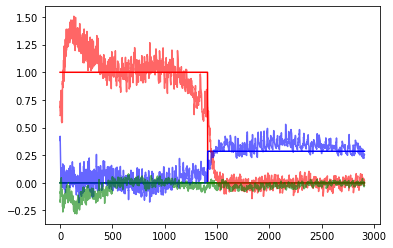

 21%|███████████████████████████████▉                                                                                                                           | 619/3000 [3:59:24<14:25:46, 21.82s/it]

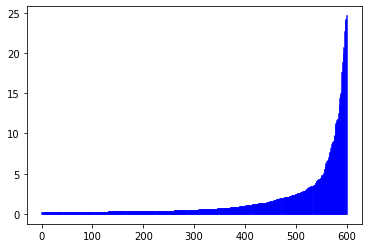

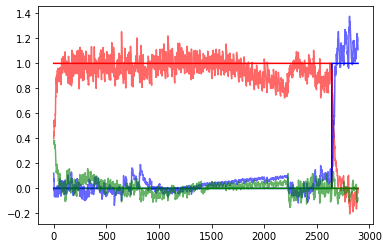

 21%|████████████████████████████████▏                                                                                                                          | 624/3000 [4:01:12<13:59:58, 21.21s/it]

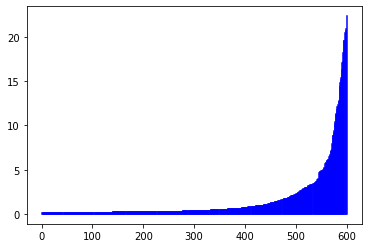

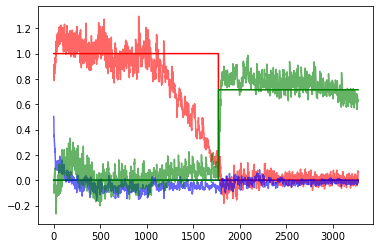

 21%|████████████████████████████████▍                                                                                                                          | 629/3000 [4:03:03<13:52:30, 21.07s/it]

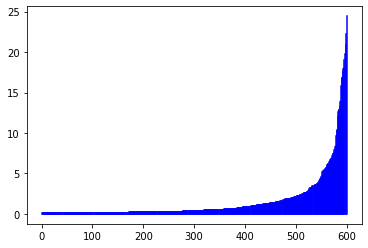

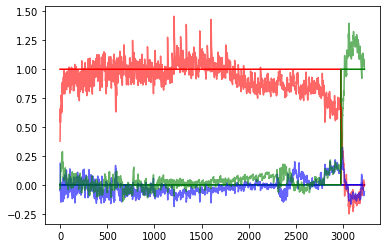

 21%|████████████████████████████████▊                                                                                                                          | 634/3000 [4:04:49<13:19:32, 20.28s/it]

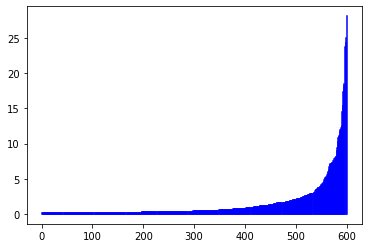

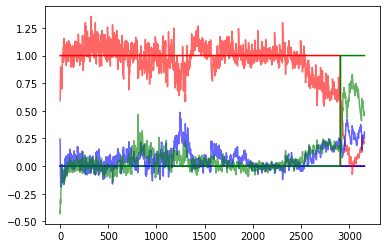

 21%|█████████████████████████████████                                                                                                                          | 639/3000 [4:06:38<13:32:24, 20.65s/it]

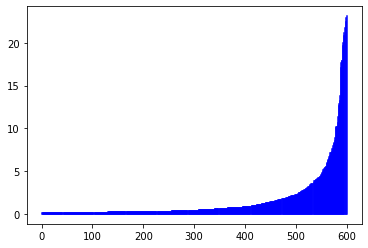

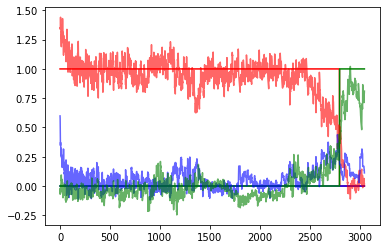

 21%|█████████████████████████████████▎                                                                                                                         | 644/3000 [4:08:27<13:29:03, 20.60s/it]

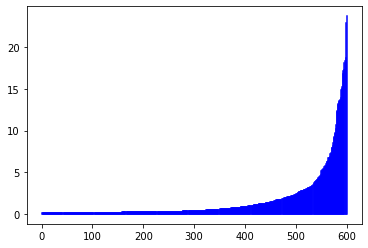

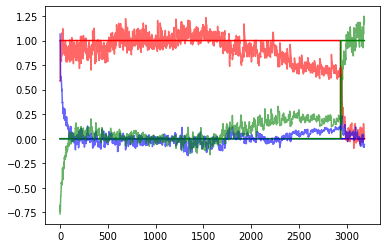

 22%|█████████████████████████████████▌                                                                                                                         | 649/3000 [4:10:19<13:58:39, 21.40s/it]

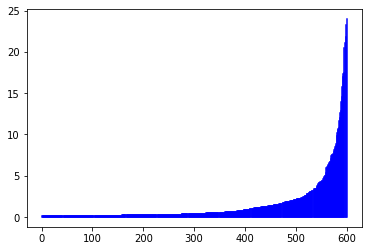

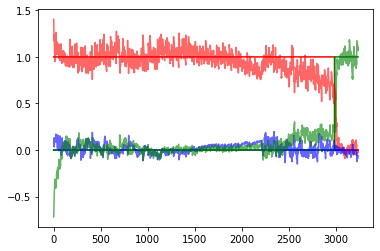

 22%|█████████████████████████████████▊                                                                                                                         | 654/3000 [4:13:03<16:28:56, 25.29s/it]

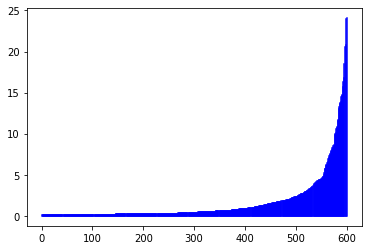

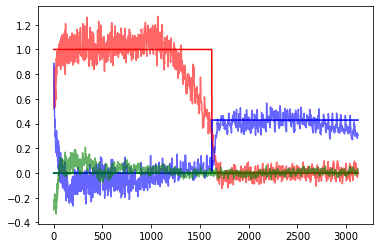

 22%|██████████████████████████████████                                                                                                                         | 659/3000 [4:14:56<14:24:03, 22.15s/it]

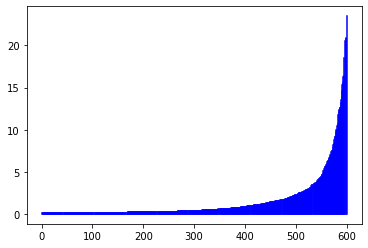

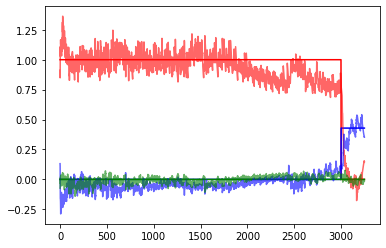

 22%|██████████████████████████████████▎                                                                                                                        | 664/3000 [4:16:45<13:56:20, 21.48s/it]

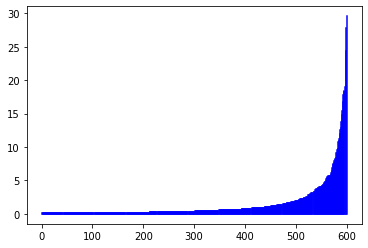

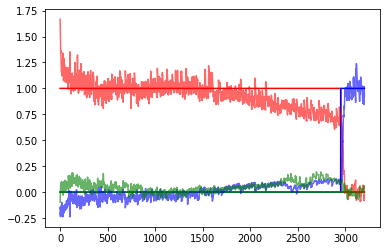

 22%|██████████████████████████████████▌                                                                                                                        | 669/3000 [4:18:37<14:13:52, 21.98s/it]

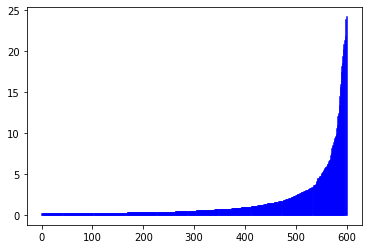

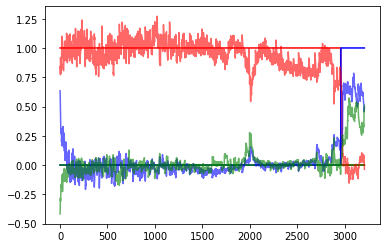

 22%|██████████████████████████████████▊                                                                                                                        | 674/3000 [4:20:29<14:01:35, 21.71s/it]

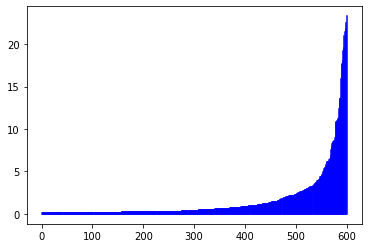

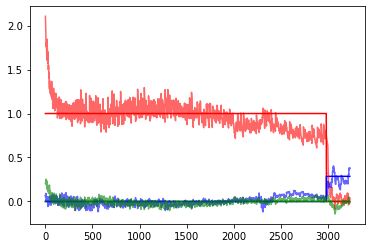

 23%|███████████████████████████████████                                                                                                                        | 679/3000 [4:22:22<14:04:23, 21.83s/it]

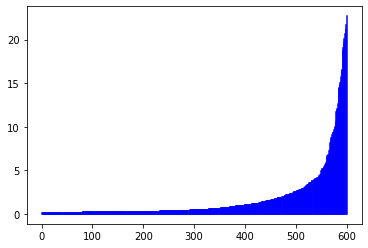

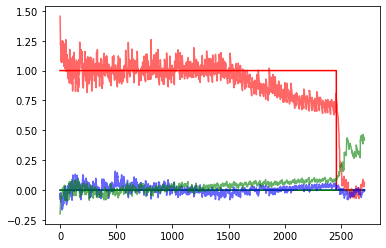

 23%|███████████████████████████████████▎                                                                                                                       | 684/3000 [4:24:13<13:48:06, 21.45s/it]

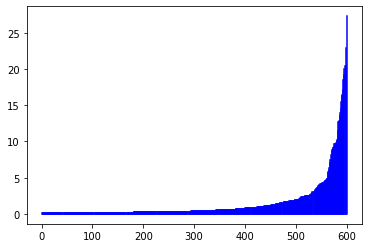

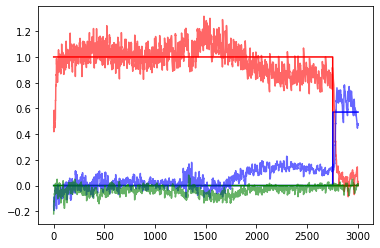

 23%|███████████████████████████████████▌                                                                                                                       | 689/3000 [4:26:03<13:32:19, 21.09s/it]

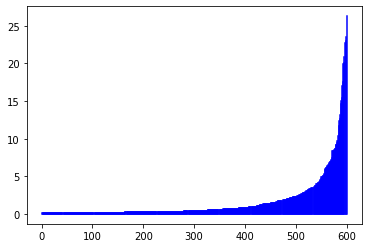

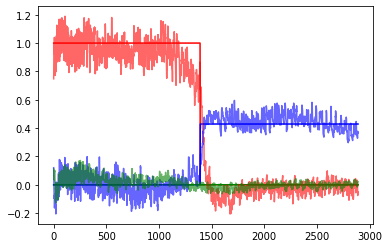

 23%|███████████████████████████████████▊                                                                                                                       | 694/3000 [4:27:49<13:08:57, 20.53s/it]

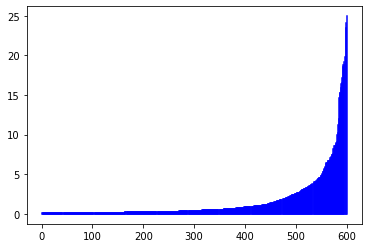

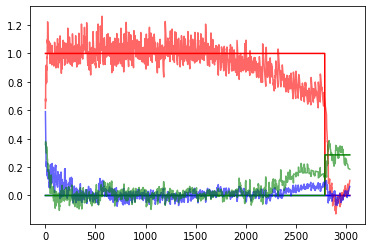

 23%|████████████████████████████████████                                                                                                                       | 699/3000 [4:29:43<13:44:18, 21.49s/it]

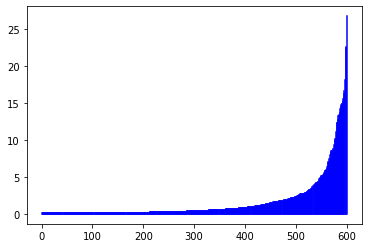

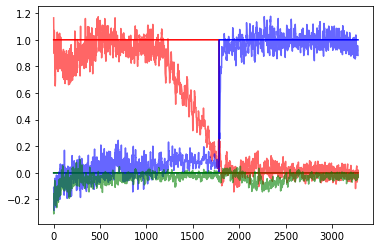

 23%|████████████████████████████████████▎                                                                                                                      | 704/3000 [4:32:25<15:59:04, 25.06s/it]

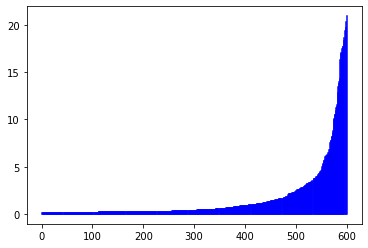

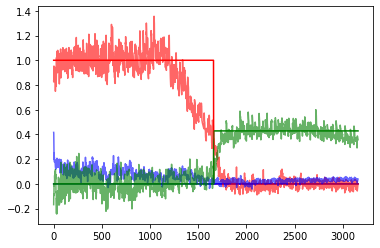

 24%|████████████████████████████████████▋                                                                                                                      | 709/3000 [4:34:15<13:58:53, 21.97s/it]

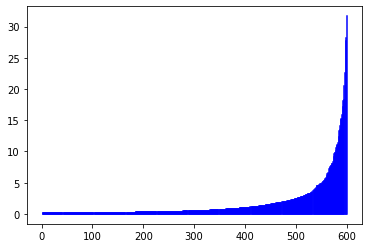

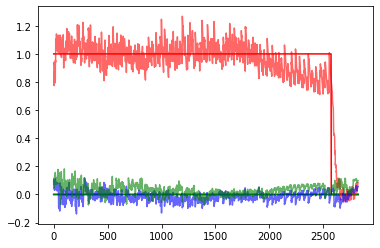

 24%|████████████████████████████████████▉                                                                                                                      | 714/3000 [4:36:05<13:30:32, 21.27s/it]

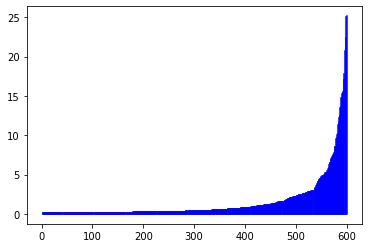

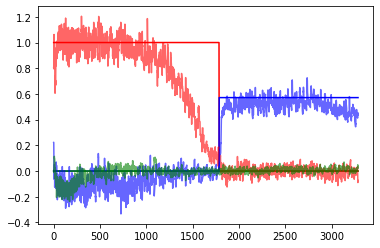

 24%|█████████████████████████████████████▏                                                                                                                     | 719/3000 [4:37:54<13:18:13, 21.00s/it]

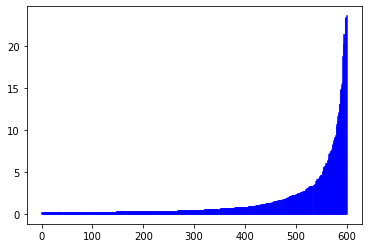

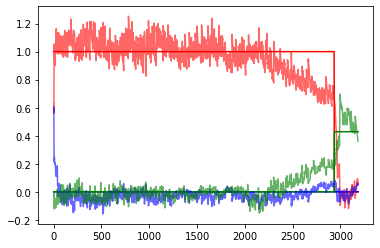

 24%|█████████████████████████████████████▍                                                                                                                     | 724/3000 [4:39:44<13:30:16, 21.36s/it]

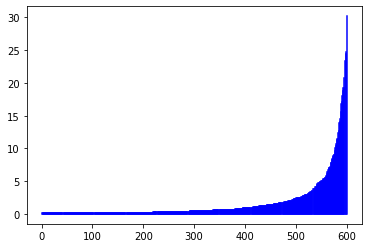

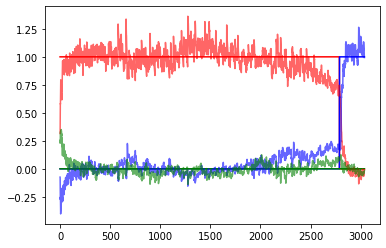

 24%|█████████████████████████████████████▋                                                                                                                     | 729/3000 [4:41:35<13:29:10, 21.38s/it]

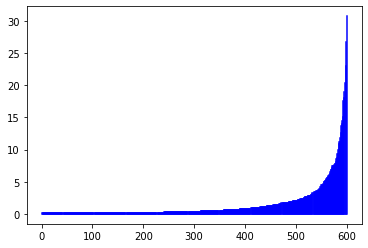

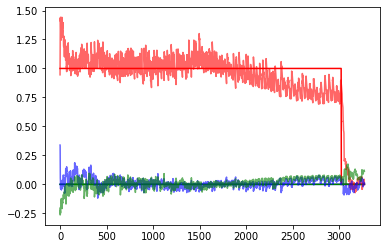

 24%|█████████████████████████████████████▉                                                                                                                     | 734/3000 [4:43:28<13:36:37, 21.62s/it]

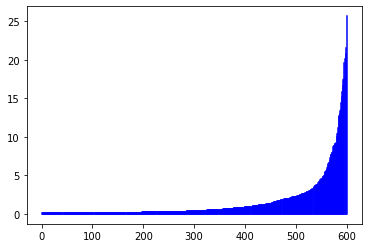

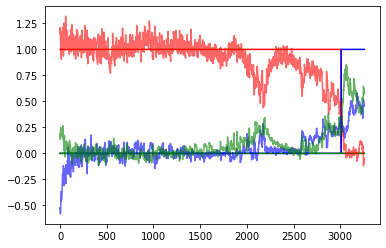

 25%|██████████████████████████████████████▏                                                                                                                    | 739/3000 [4:45:21<13:29:31, 21.48s/it]

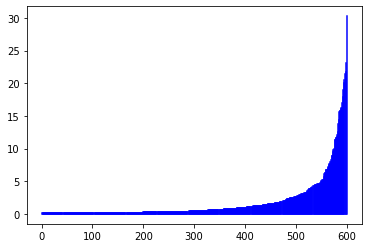

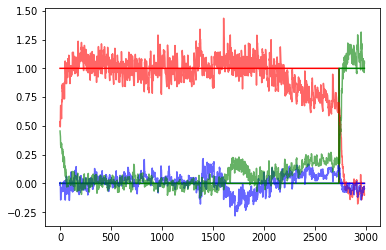

 25%|██████████████████████████████████████▍                                                                                                                    | 744/3000 [4:47:13<13:37:20, 21.74s/it]

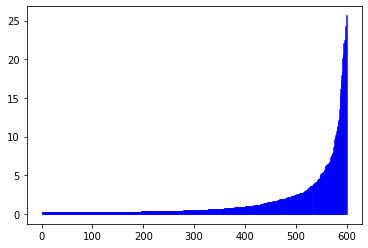

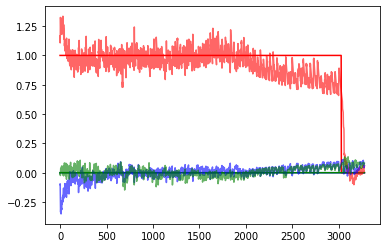

 25%|██████████████████████████████████████▋                                                                                                                    | 749/3000 [4:49:04<13:24:07, 21.43s/it]

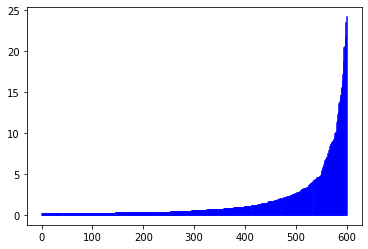

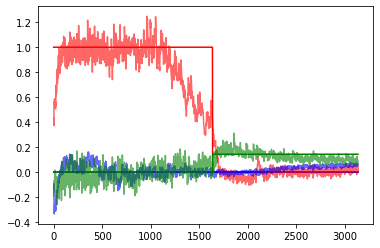

 25%|██████████████████████████████████████▉                                                                                                                    | 754/3000 [4:51:47<15:47:33, 25.31s/it]

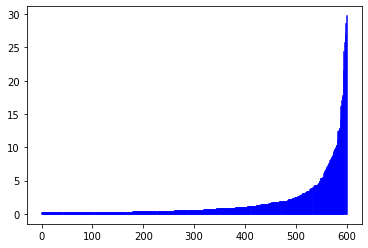

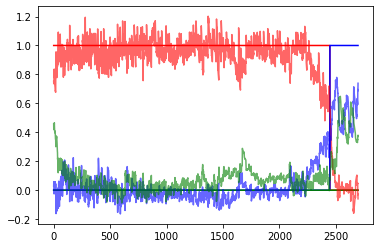

 25%|███████████████████████████████████████▏                                                                                                                   | 759/3000 [4:53:36<13:36:22, 21.86s/it]

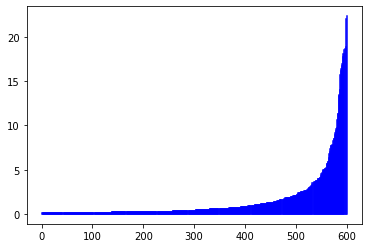

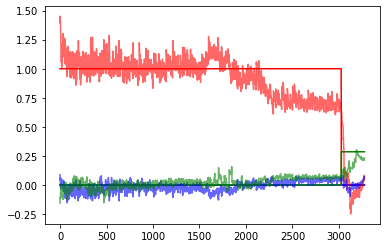

 25%|███████████████████████████████████████▍                                                                                                                   | 764/3000 [4:55:25<13:03:09, 21.01s/it]

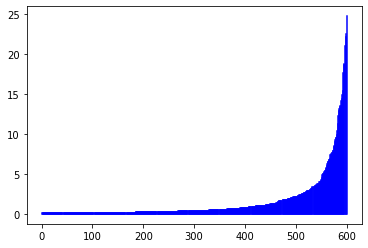

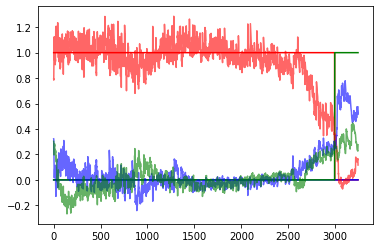

 26%|███████████████████████████████████████▋                                                                                                                   | 769/3000 [4:57:14<13:04:32, 21.10s/it]

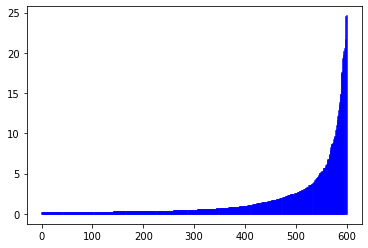

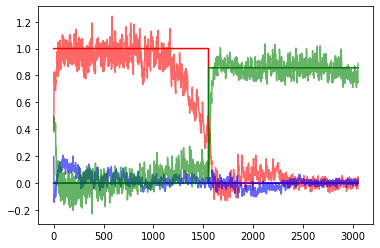

 26%|███████████████████████████████████████▉                                                                                                                   | 774/3000 [4:59:05<13:03:04, 21.11s/it]

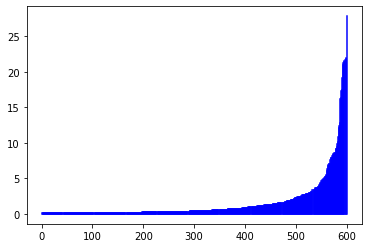

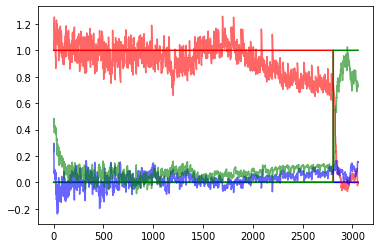

 26%|████████████████████████████████████████▏                                                                                                                  | 779/3000 [5:00:58<13:20:10, 21.62s/it]

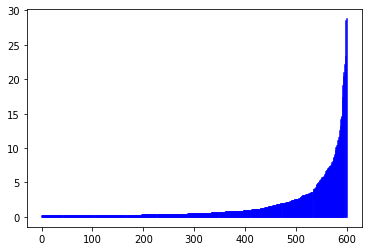

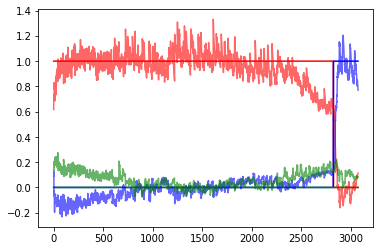

 26%|████████████████████████████████████████▌                                                                                                                  | 784/3000 [5:02:49<12:59:21, 21.10s/it]

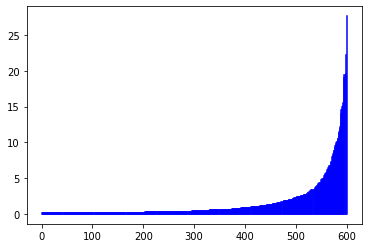

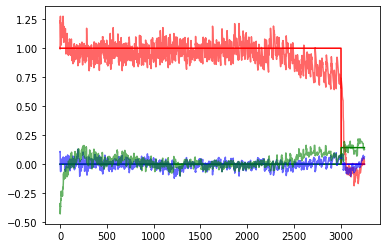

 26%|████████████████████████████████████████▊                                                                                                                  | 789/3000 [5:04:40<13:02:26, 21.23s/it]

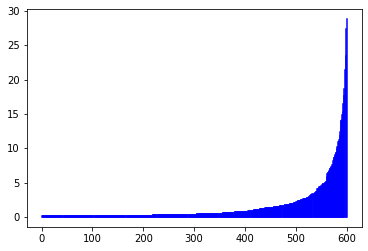

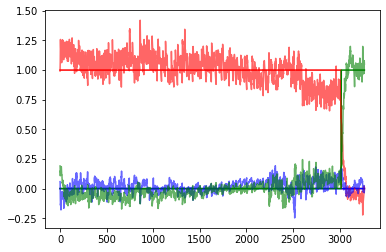

 26%|█████████████████████████████████████████                                                                                                                  | 794/3000 [5:06:30<13:02:41, 21.29s/it]

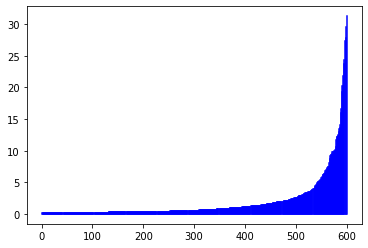

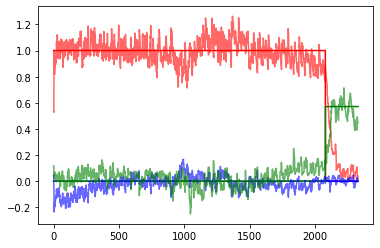

 27%|█████████████████████████████████████████▎                                                                                                                 | 799/3000 [5:08:20<13:20:15, 21.82s/it]

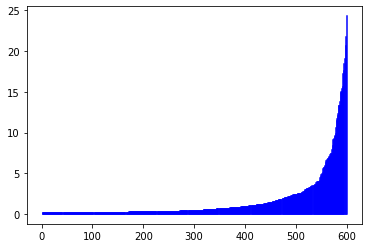

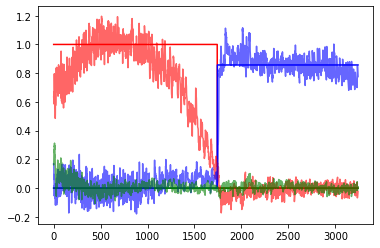

 27%|█████████████████████████████████████████▌                                                                                                                 | 804/3000 [5:10:59<14:51:50, 24.37s/it]

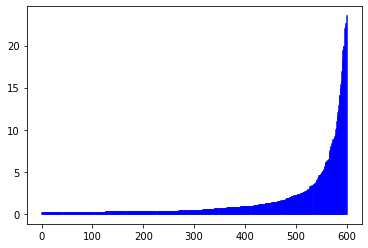

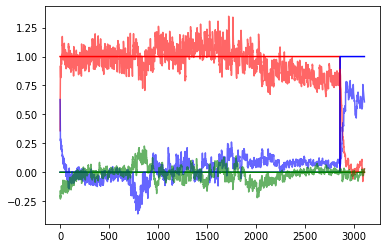

 27%|█████████████████████████████████████████▊                                                                                                                 | 809/3000 [5:12:53<13:35:04, 22.32s/it]

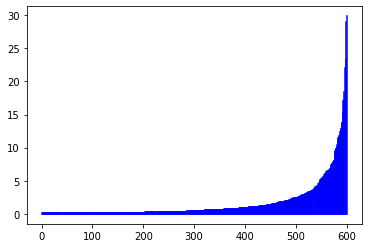

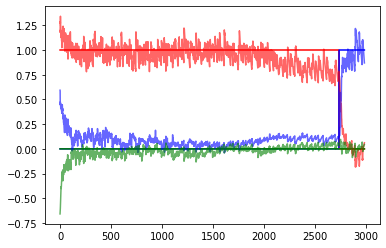

 27%|██████████████████████████████████████████                                                                                                                 | 814/3000 [5:14:40<12:50:01, 21.14s/it]

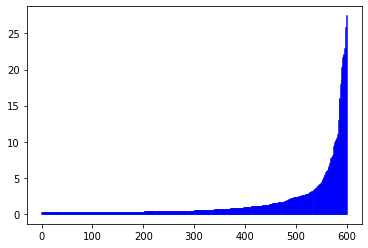

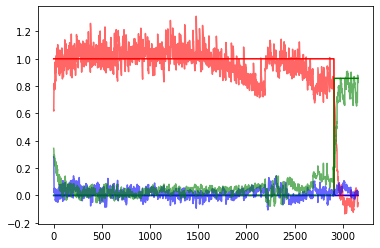

 27%|██████████████████████████████████████████▎                                                                                                                | 819/3000 [5:16:30<12:44:47, 21.04s/it]

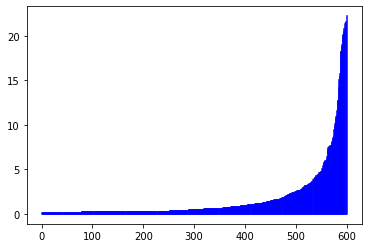

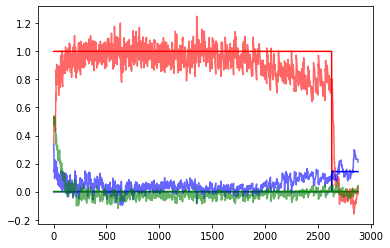

 27%|██████████████████████████████████████████▌                                                                                                                | 824/3000 [5:18:19<12:45:33, 21.11s/it]

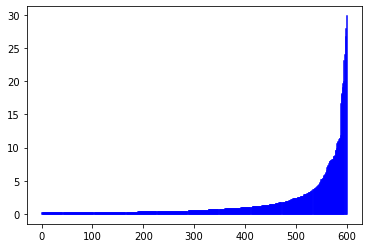

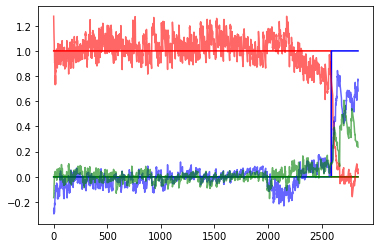

 28%|██████████████████████████████████████████▊                                                                                                                | 829/3000 [5:20:12<12:56:48, 21.47s/it]

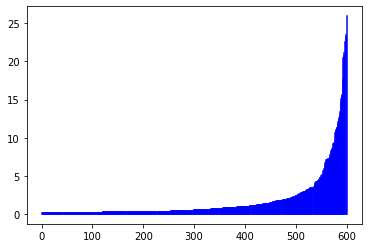

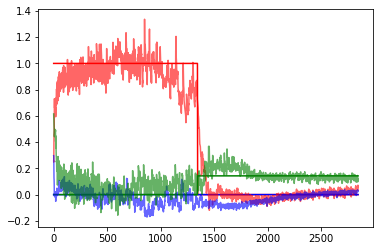

 28%|███████████████████████████████████████████                                                                                                                | 834/3000 [5:22:02<12:44:43, 21.18s/it]

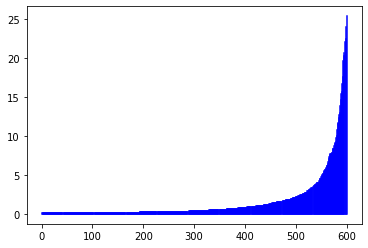

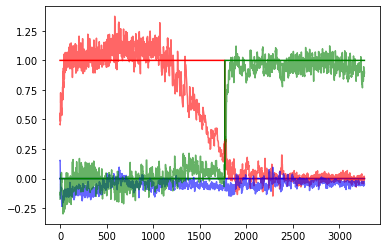

 28%|███████████████████████████████████████████▎                                                                                                               | 839/3000 [5:23:54<12:52:55, 21.46s/it]

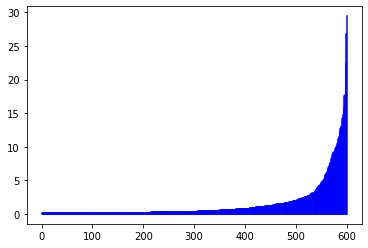

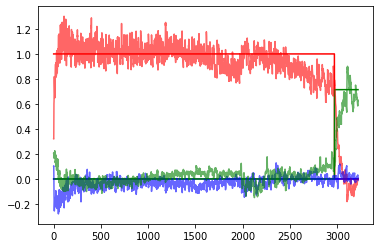

 28%|███████████████████████████████████████████▌                                                                                                               | 844/3000 [5:25:47<13:04:15, 21.83s/it]

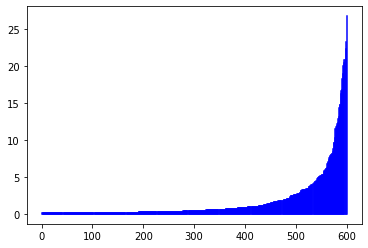

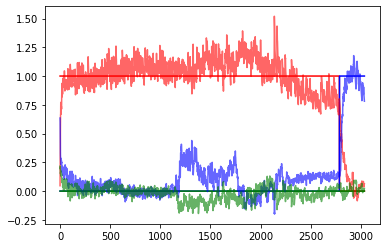

 28%|███████████████████████████████████████████▊                                                                                                               | 849/3000 [5:27:35<12:28:45, 20.89s/it]

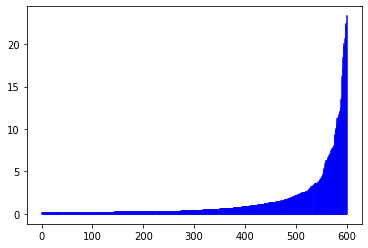

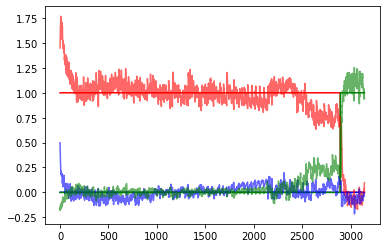

 28%|████████████████████████████████████████████                                                                                                               | 854/3000 [5:30:18<15:01:26, 25.20s/it]

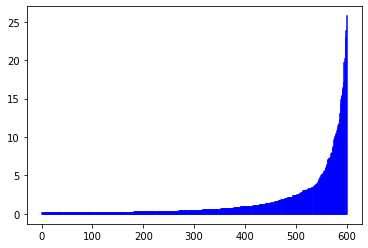

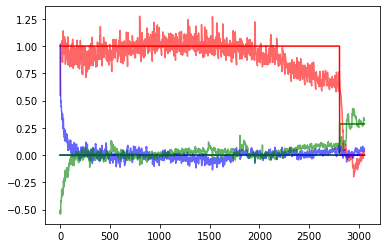

 29%|████████████████████████████████████████████▍                                                                                                              | 859/3000 [5:32:14<13:37:32, 22.91s/it]

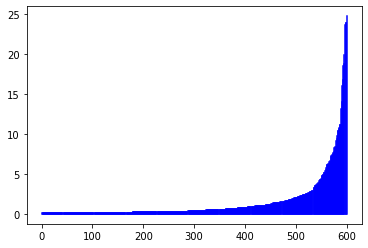

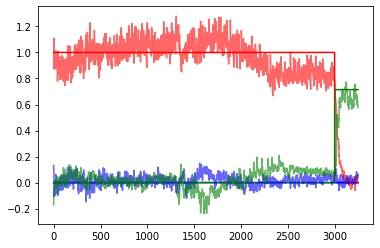

 29%|████████████████████████████████████████████▋                                                                                                              | 864/3000 [5:34:05<12:49:46, 21.62s/it]

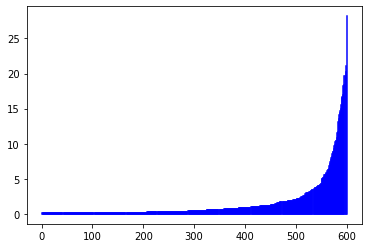

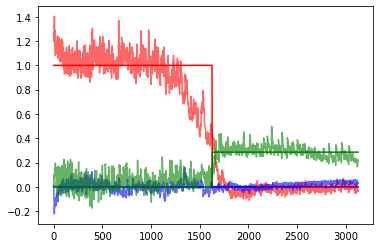

 29%|████████████████████████████████████████████▉                                                                                                              | 869/3000 [5:35:58<12:54:51, 21.82s/it]

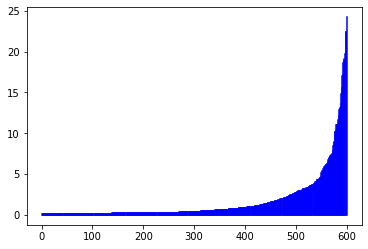

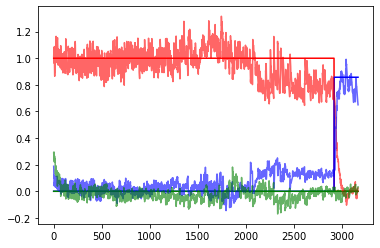

 29%|█████████████████████████████████████████████▏                                                                                                             | 874/3000 [5:37:49<12:33:15, 21.26s/it]

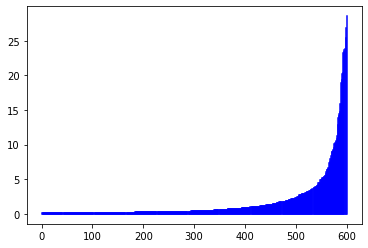

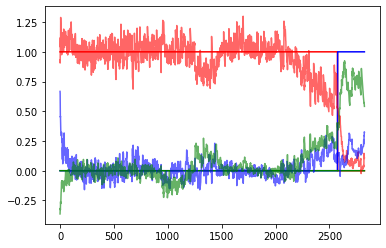

 29%|█████████████████████████████████████████████▍                                                                                                             | 879/3000 [5:39:42<12:49:36, 21.77s/it]

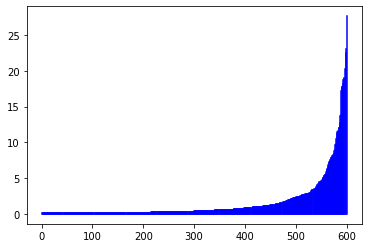

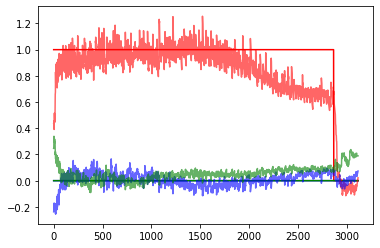

 29%|█████████████████████████████████████████████▋                                                                                                             | 884/3000 [5:41:32<12:35:49, 21.43s/it]

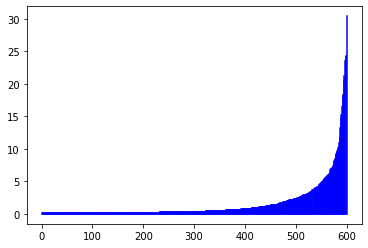

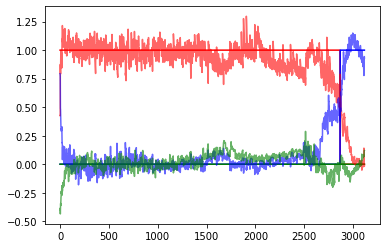

 30%|█████████████████████████████████████████████▉                                                                                                             | 889/3000 [5:43:27<12:50:36, 21.90s/it]

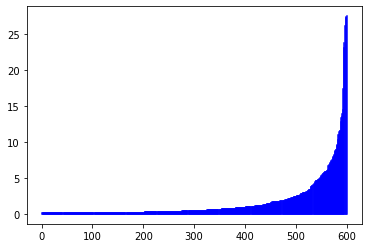

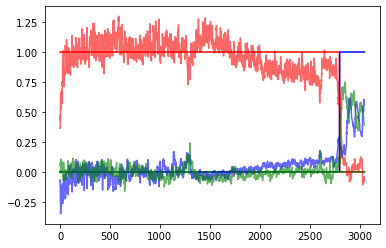

 30%|██████████████████████████████████████████████▏                                                                                                            | 894/3000 [5:45:16<12:09:25, 20.78s/it]

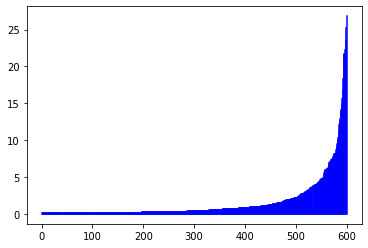

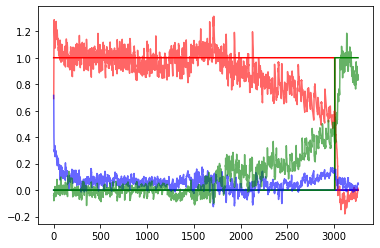

 30%|██████████████████████████████████████████████▍                                                                                                            | 899/3000 [5:47:05<12:16:58, 21.05s/it]

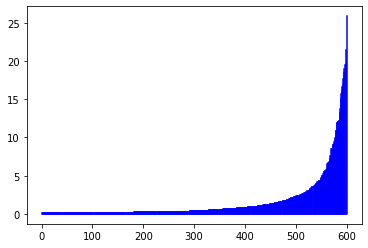

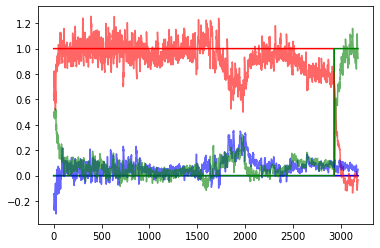

 30%|██████████████████████████████████████████████▋                                                                                                            | 904/3000 [5:49:48<14:51:13, 25.51s/it]

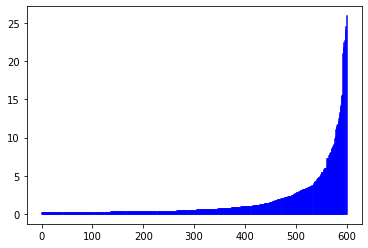

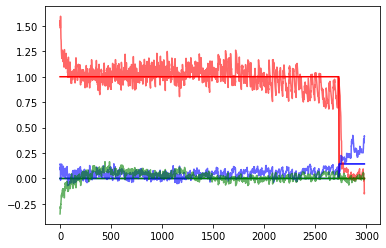

 30%|██████████████████████████████████████████████▉                                                                                                            | 909/3000 [5:51:43<13:09:44, 22.66s/it]

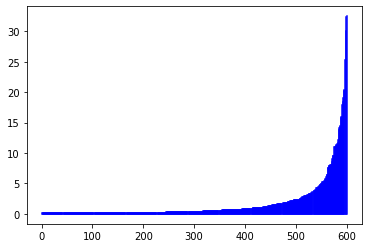

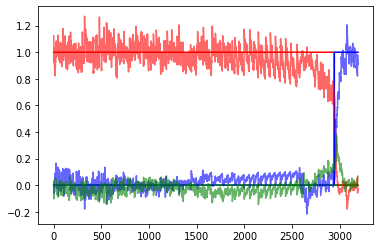

 30%|███████████████████████████████████████████████▏                                                                                                           | 914/3000 [5:53:34<12:35:36, 21.73s/it]

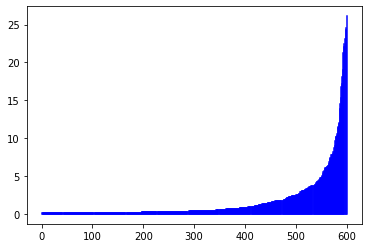

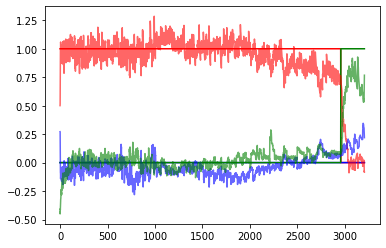

 31%|███████████████████████████████████████████████▍                                                                                                           | 919/3000 [5:55:24<12:20:49, 21.36s/it]

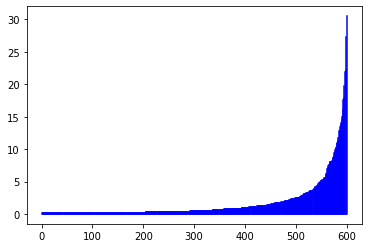

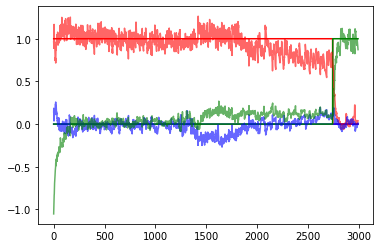

 31%|███████████████████████████████████████████████▋                                                                                                           | 924/3000 [5:57:12<12:08:57, 21.07s/it]

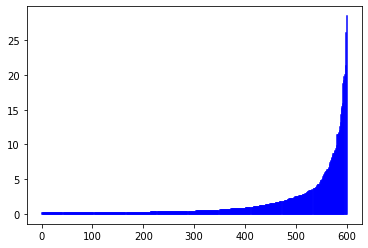

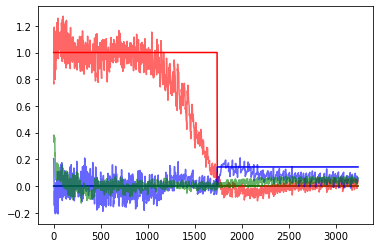

 31%|███████████████████████████████████████████████▉                                                                                                           | 929/3000 [5:59:03<12:08:29, 21.11s/it]

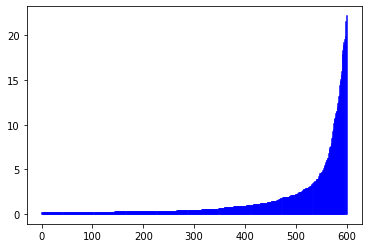

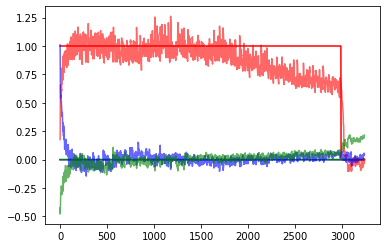

 31%|████████████████████████████████████████████████▎                                                                                                          | 934/3000 [6:00:57<12:35:19, 21.94s/it]

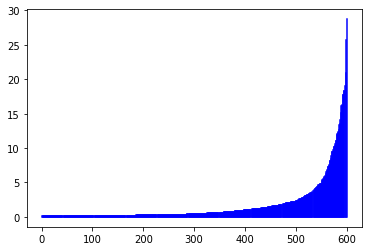

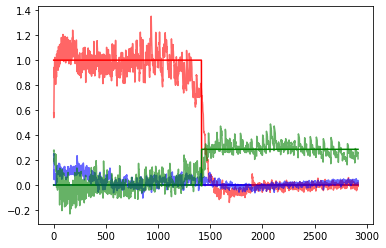

 31%|████████████████████████████████████████████████▌                                                                                                          | 939/3000 [6:02:49<12:28:01, 21.78s/it]

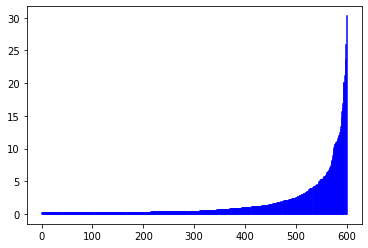

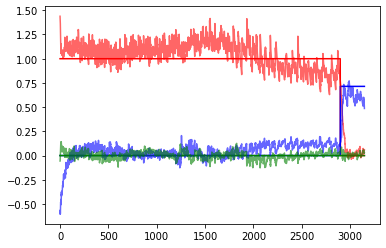

 31%|████████████████████████████████████████████████▊                                                                                                          | 944/3000 [6:04:43<12:32:22, 21.96s/it]

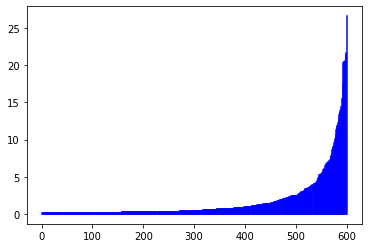

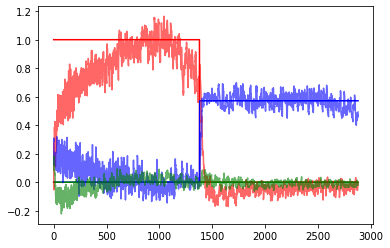

 32%|█████████████████████████████████████████████████                                                                                                          | 949/3000 [6:06:32<12:07:08, 21.27s/it]

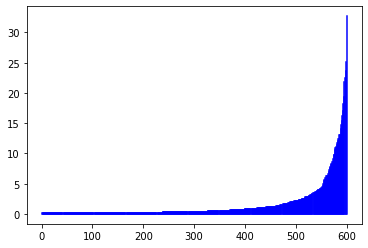

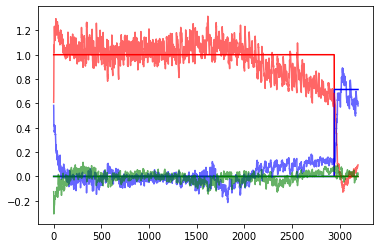

 32%|█████████████████████████████████████████████████▎                                                                                                         | 954/3000 [6:09:16<14:30:49, 25.54s/it]

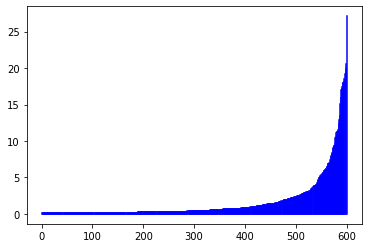

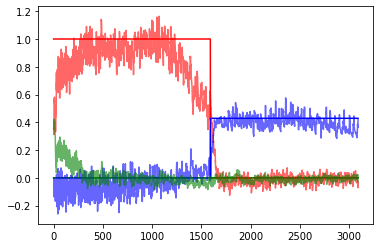

 32%|█████████████████████████████████████████████████▌                                                                                                         | 959/3000 [6:11:02<12:16:14, 21.64s/it]

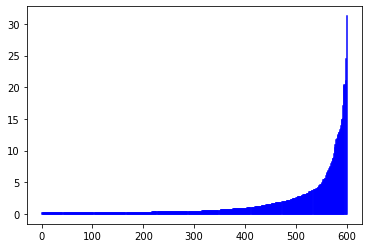

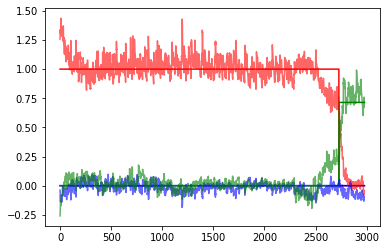

 32%|█████████████████████████████████████████████████▊                                                                                                         | 964/3000 [6:12:54<12:13:45, 21.62s/it]

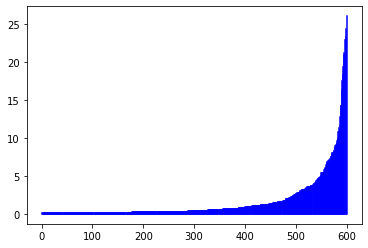

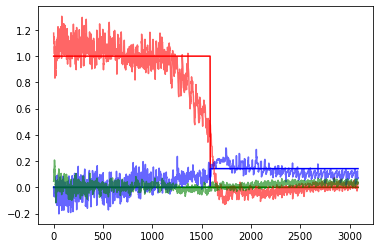

 32%|██████████████████████████████████████████████████                                                                                                         | 969/3000 [6:14:42<11:35:16, 20.54s/it]

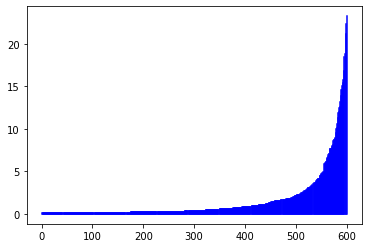

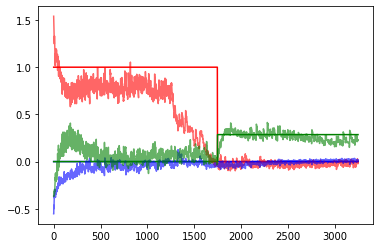

 32%|██████████████████████████████████████████████████▎                                                                                                        | 974/3000 [6:16:31<11:48:56, 21.00s/it]

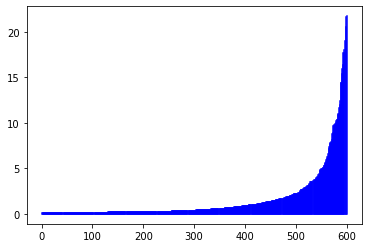

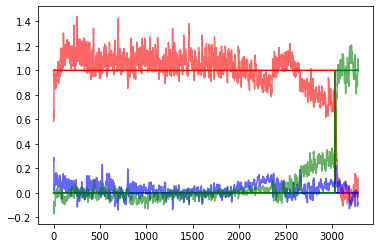

 33%|██████████████████████████████████████████████████▌                                                                                                        | 979/3000 [6:18:22<11:56:56, 21.28s/it]

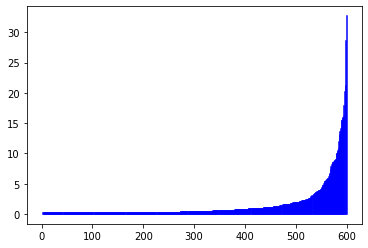

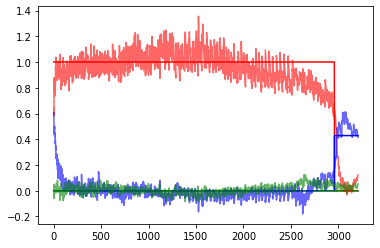

 33%|██████████████████████████████████████████████████▊                                                                                                        | 984/3000 [6:20:15<12:23:03, 22.11s/it]

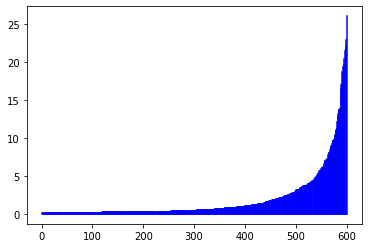

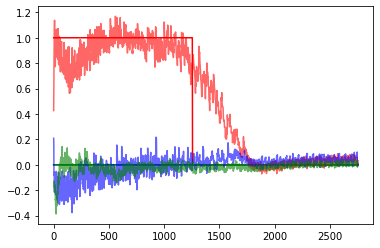

 33%|███████████████████████████████████████████████████                                                                                                        | 989/3000 [6:22:06<12:01:55, 21.54s/it]

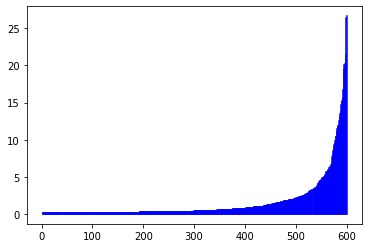

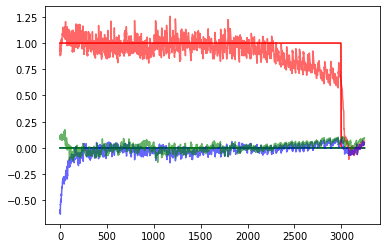

 33%|███████████████████████████████████████████████████▎                                                                                                       | 994/3000 [6:23:56<11:52:46, 21.32s/it]

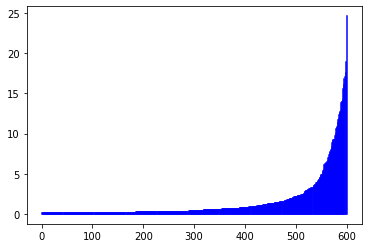

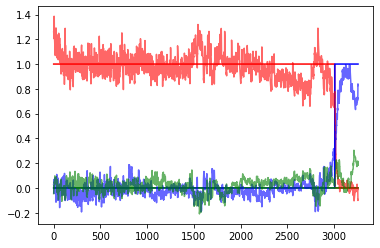

 33%|███████████████████████████████████████████████████▌                                                                                                       | 999/3000 [6:25:49<11:58:07, 21.53s/it]

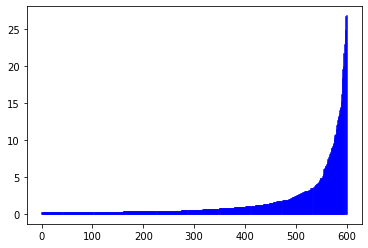

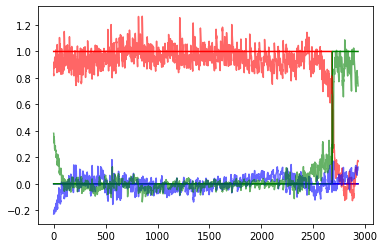

 33%|███████████████████████████████████████████████████▌                                                                                                      | 1004/3000 [6:28:29<13:55:27, 25.11s/it]

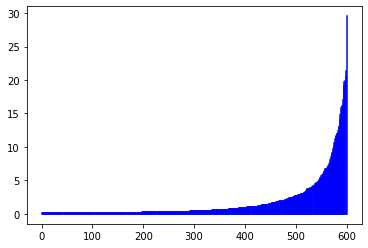

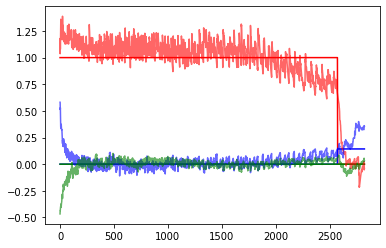

 34%|███████████████████████████████████████████████████▊                                                                                                      | 1009/3000 [6:30:25<12:35:25, 22.77s/it]

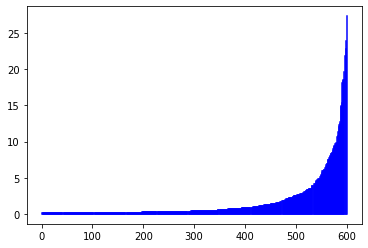

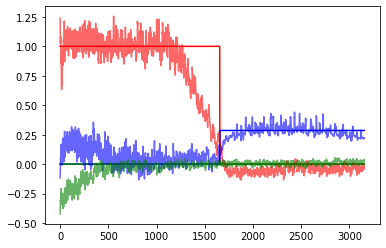

 34%|████████████████████████████████████████████████████                                                                                                      | 1014/3000 [6:32:15<11:59:23, 21.73s/it]

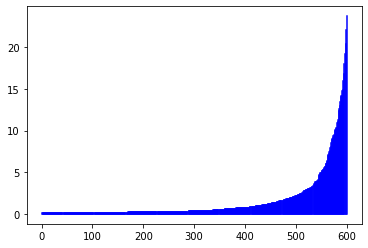

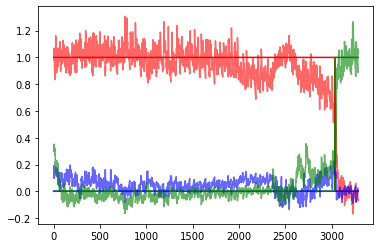

 34%|████████████████████████████████████████████████████▎                                                                                                     | 1019/3000 [6:34:00<11:12:28, 20.37s/it]

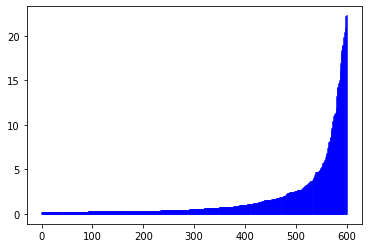

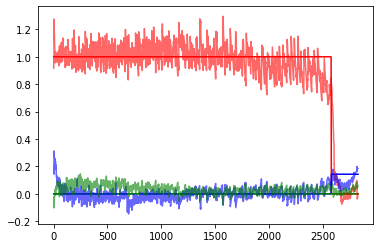

 34%|████████████████████████████████████████████████████▌                                                                                                     | 1024/3000 [6:35:55<11:57:41, 21.79s/it]

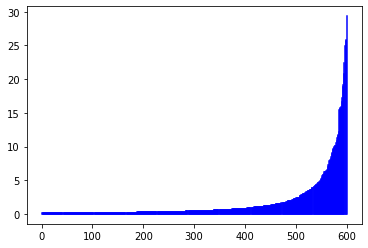

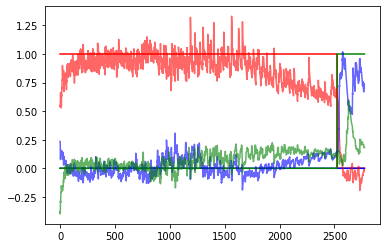

 34%|████████████████████████████████████████████████████▊                                                                                                     | 1029/3000 [6:37:41<11:20:27, 20.71s/it]

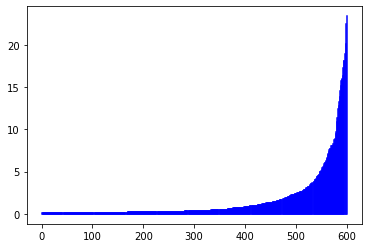

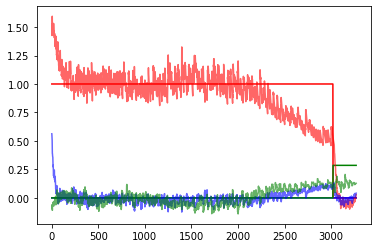

 34%|█████████████████████████████████████████████████████                                                                                                     | 1034/3000 [6:39:35<11:59:54, 21.97s/it]

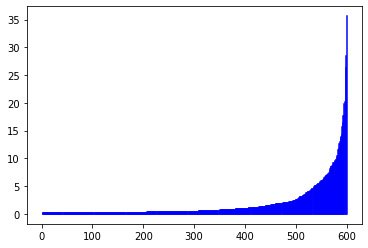

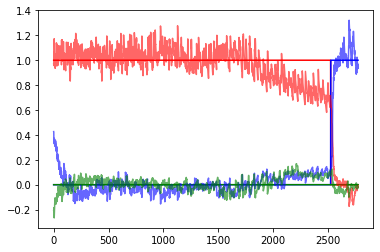

 35%|█████████████████████████████████████████████████████▎                                                                                                    | 1039/3000 [6:41:25<11:43:03, 21.51s/it]

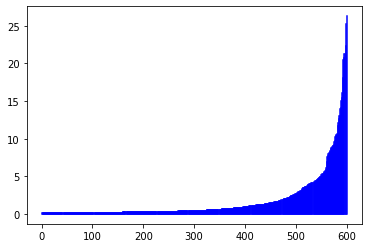

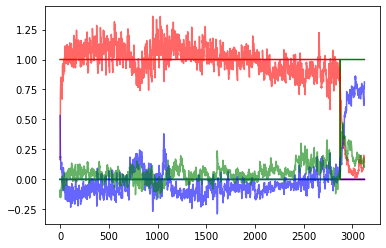

 35%|█████████████████████████████████████████████████████▌                                                                                                    | 1044/3000 [6:43:14<11:32:27, 21.24s/it]

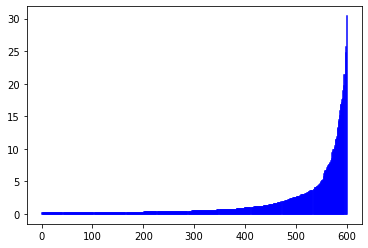

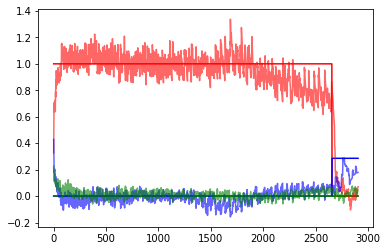

 35%|█████████████████████████████████████████████████████▊                                                                                                    | 1049/3000 [6:45:06<11:44:11, 21.66s/it]

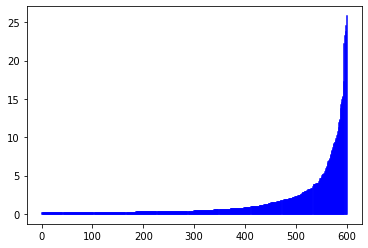

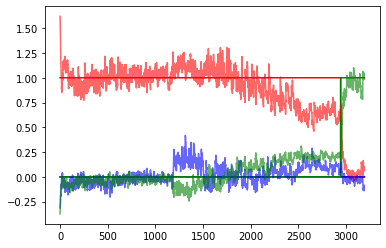

 35%|██████████████████████████████████████████████████████                                                                                                    | 1054/3000 [6:47:45<13:19:40, 24.66s/it]

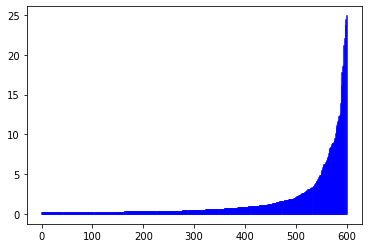

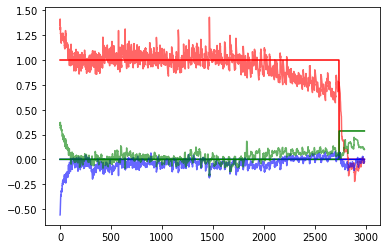

 35%|██████████████████████████████████████████████████████▎                                                                                                   | 1059/3000 [6:49:38<12:01:31, 22.30s/it]

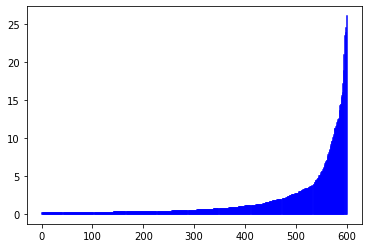

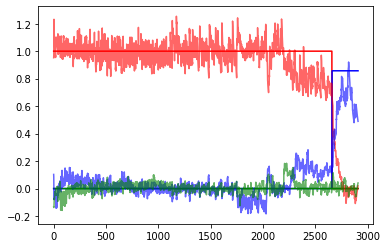

 35%|██████████████████████████████████████████████████████▌                                                                                                   | 1064/3000 [6:51:32<11:55:20, 22.17s/it]

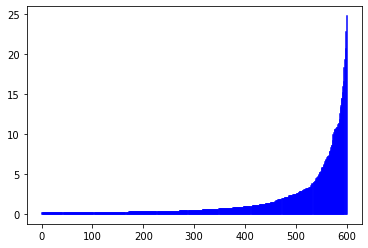

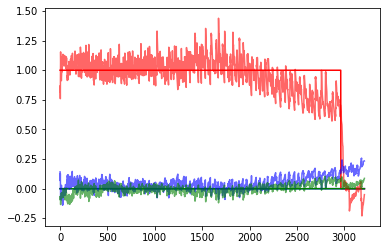

 36%|██████████████████████████████████████████████████████▉                                                                                                   | 1069/3000 [6:53:26<11:40:36, 21.77s/it]

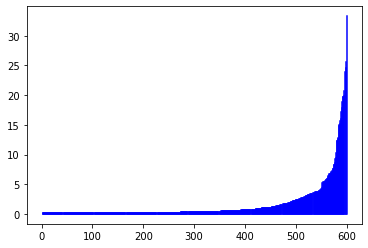

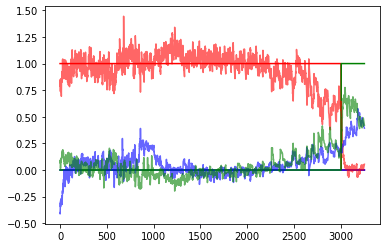

 36%|███████████████████████████████████████████████████████▏                                                                                                  | 1074/3000 [6:55:12<10:51:19, 20.29s/it]

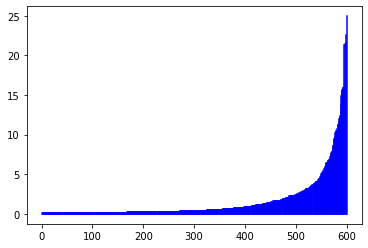

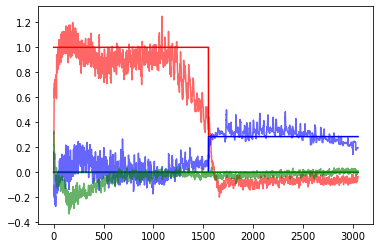

 36%|███████████████████████████████████████████████████████▍                                                                                                  | 1079/3000 [6:57:00<11:09:52, 20.92s/it]

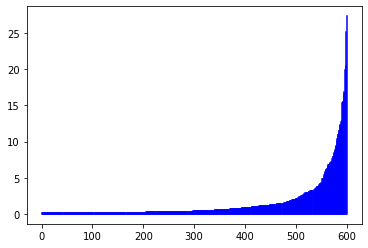

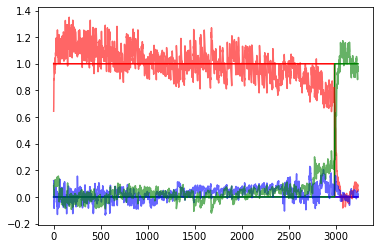

 36%|███████████████████████████████████████████████████████▋                                                                                                  | 1084/3000 [6:58:53<11:30:20, 21.62s/it]

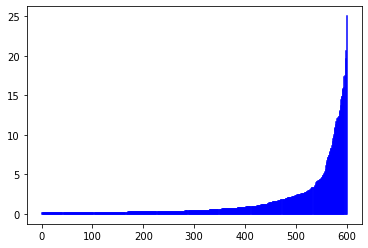

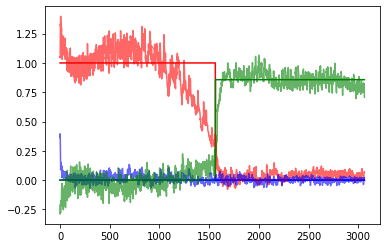

 36%|███████████████████████████████████████████████████████▉                                                                                                  | 1089/3000 [7:00:38<10:40:55, 20.12s/it]

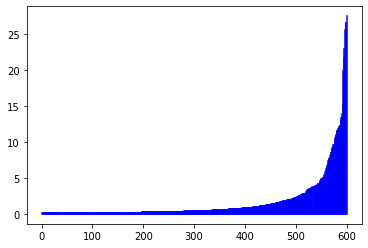

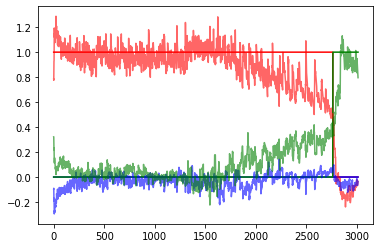

 36%|████████████████████████████████████████████████████████▏                                                                                                 | 1094/3000 [7:02:29<10:57:18, 20.69s/it]

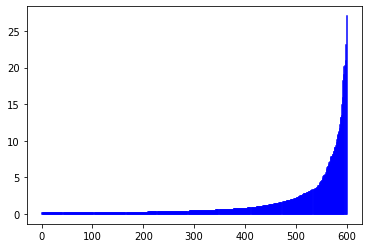

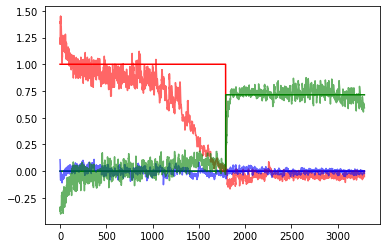

 37%|████████████████████████████████████████████████████████▍                                                                                                 | 1099/3000 [7:04:21<11:15:57, 21.34s/it]

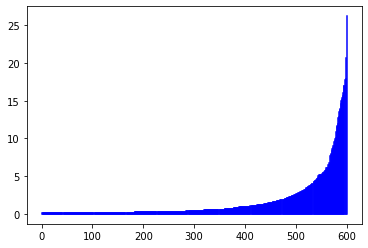

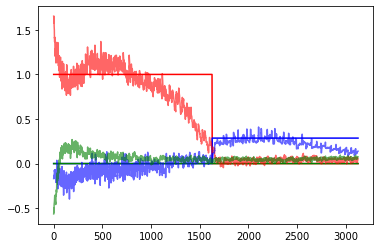

 37%|████████████████████████████████████████████████████████▋                                                                                                 | 1104/3000 [7:07:05<13:25:31, 25.49s/it]

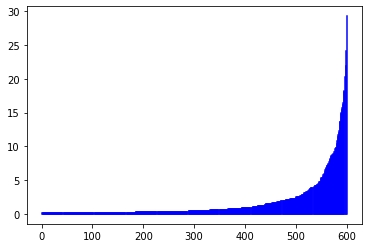

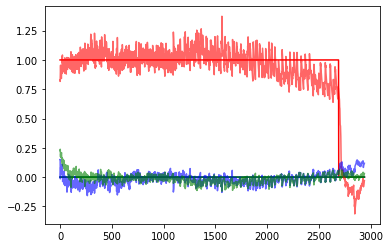

 37%|████████████████████████████████████████████████████████▉                                                                                                 | 1109/3000 [7:08:53<11:21:29, 21.62s/it]

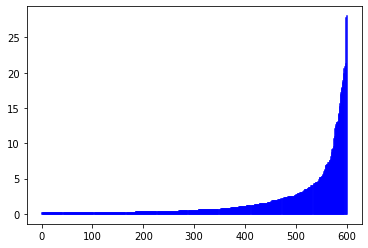

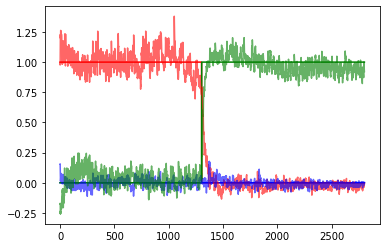

 37%|█████████████████████████████████████████████████████████▏                                                                                                | 1114/3000 [7:10:42<11:12:14, 21.39s/it]

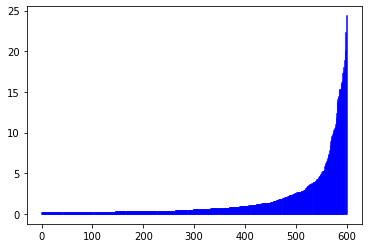

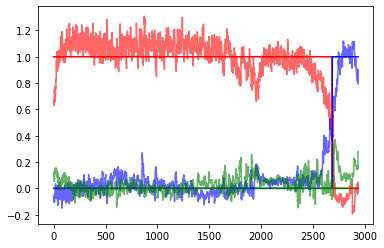

 37%|█████████████████████████████████████████████████████████▍                                                                                                | 1119/3000 [7:12:30<10:55:08, 20.90s/it]

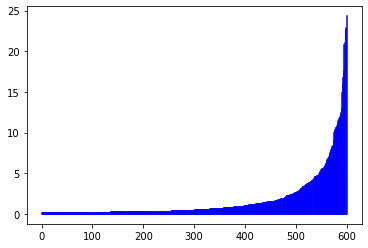

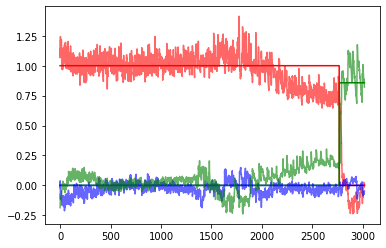

 37%|█████████████████████████████████████████████████████████▋                                                                                                | 1124/3000 [7:14:23<11:18:17, 21.69s/it]

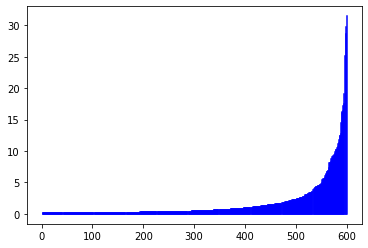

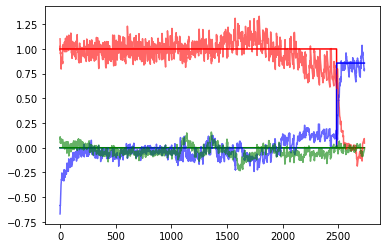

 38%|█████████████████████████████████████████████████████████▉                                                                                                | 1129/3000 [7:16:11<10:58:05, 21.10s/it]

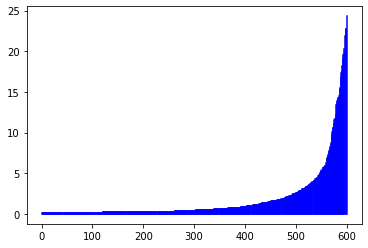

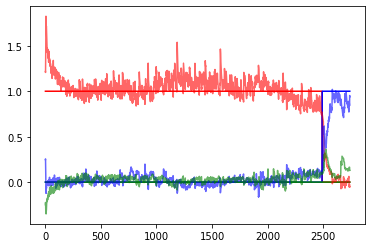

 38%|██████████████████████████████████████████████████████████▏                                                                                               | 1134/3000 [7:18:00<10:43:40, 20.70s/it]

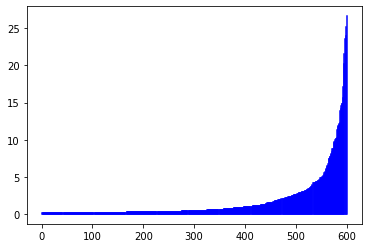

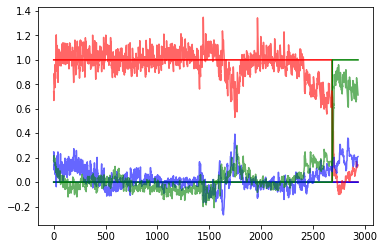

 38%|██████████████████████████████████████████████████████████▍                                                                                               | 1139/3000 [7:19:51<10:47:29, 20.88s/it]

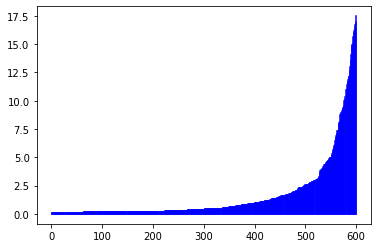

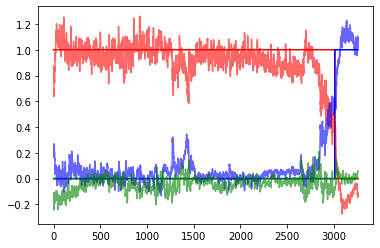

 38%|██████████████████████████████████████████████████████████▋                                                                                               | 1144/3000 [7:21:37<10:36:47, 20.59s/it]

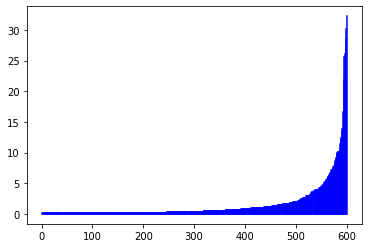

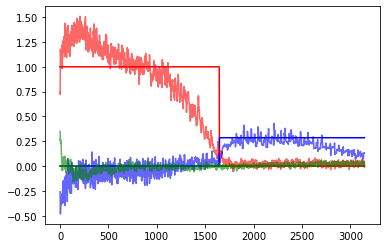

 38%|██████████████████████████████████████████████████████████▉                                                                                               | 1149/3000 [7:23:27<10:49:35, 21.06s/it]

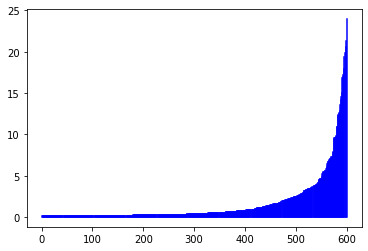

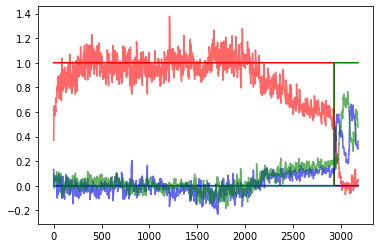

 38%|███████████████████████████████████████████████████████████▏                                                                                              | 1154/3000 [7:26:04<12:25:43, 24.24s/it]

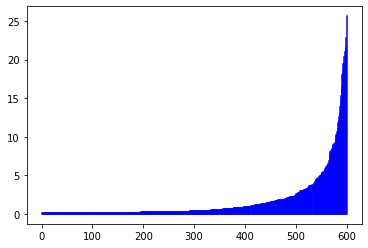

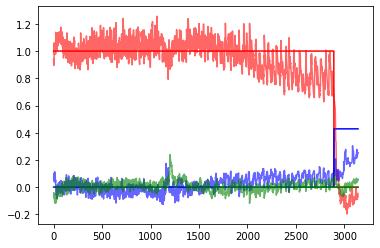

 39%|███████████████████████████████████████████████████████████▍                                                                                              | 1159/3000 [7:27:55<11:04:22, 21.65s/it]

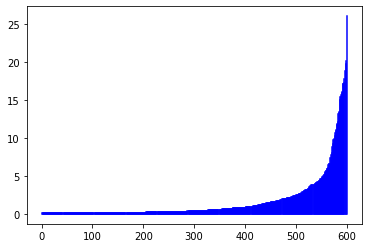

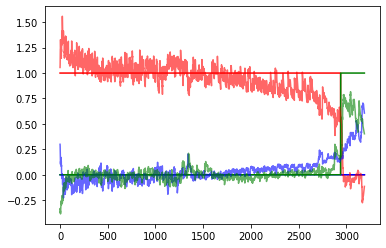

 39%|███████████████████████████████████████████████████████████▊                                                                                              | 1164/3000 [7:29:43<10:31:18, 20.63s/it]

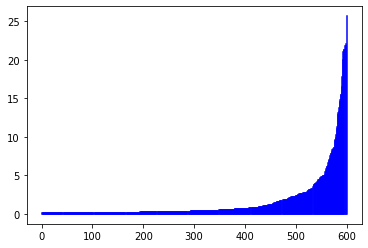

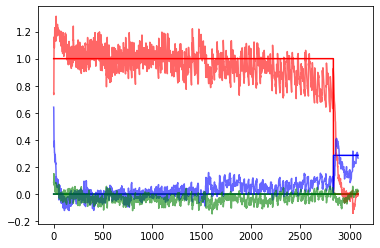

 39%|████████████████████████████████████████████████████████████                                                                                              | 1169/3000 [7:31:34<10:47:01, 21.20s/it]

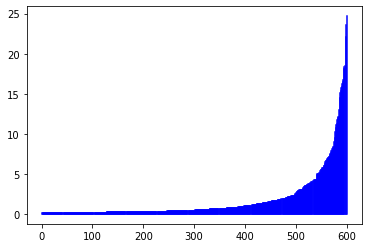

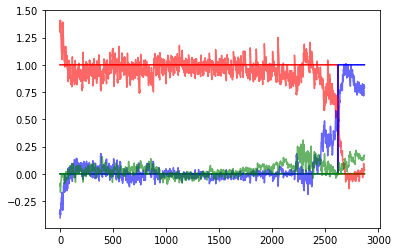

 39%|████████████████████████████████████████████████████████████▎                                                                                             | 1174/3000 [7:33:26<10:56:42, 21.58s/it]

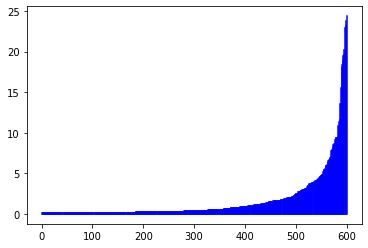

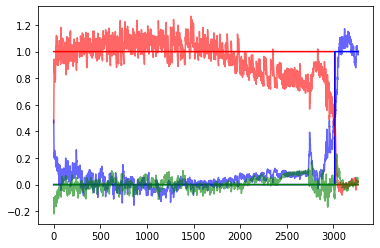

 39%|████████████████████████████████████████████████████████████▌                                                                                             | 1179/3000 [7:35:19<11:01:41, 21.80s/it]

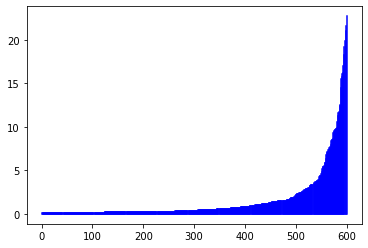

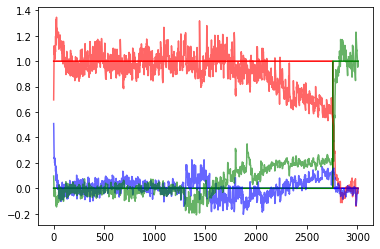

 39%|████████████████████████████████████████████████████████████▊                                                                                             | 1184/3000 [7:37:10<10:50:28, 21.49s/it]

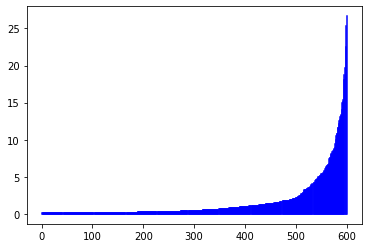

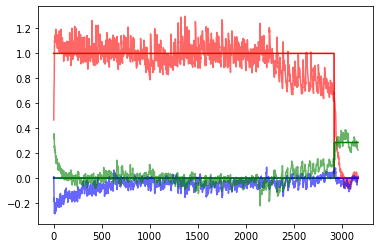

 40%|█████████████████████████████████████████████████████████████                                                                                             | 1189/3000 [7:39:02<10:50:51, 21.56s/it]

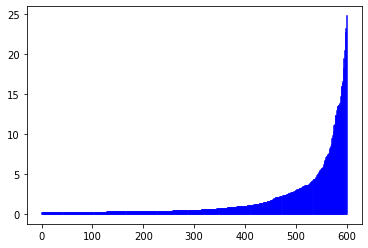

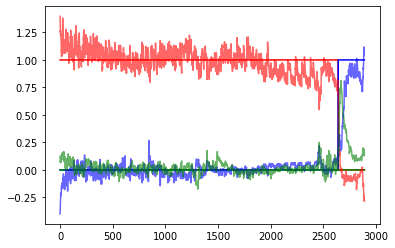

 40%|█████████████████████████████████████████████████████████████▎                                                                                            | 1194/3000 [7:40:52<10:41:47, 21.32s/it]

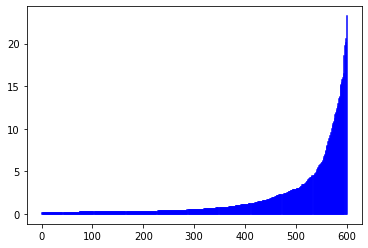

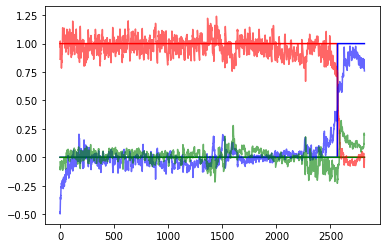

 40%|█████████████████████████████████████████████████████████████▌                                                                                            | 1199/3000 [7:42:41<10:29:16, 20.96s/it]

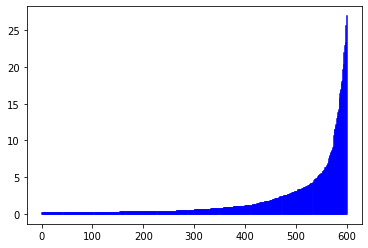

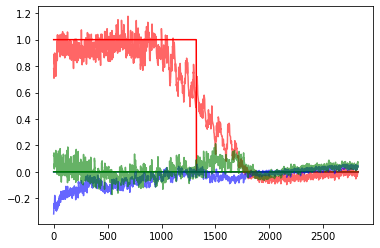

 40%|█████████████████████████████████████████████████████████████▊                                                                                            | 1204/3000 [7:45:16<11:50:39, 23.74s/it]

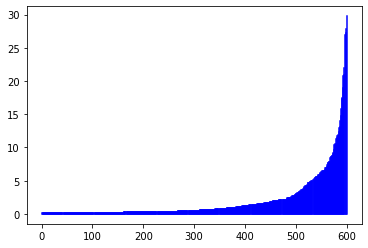

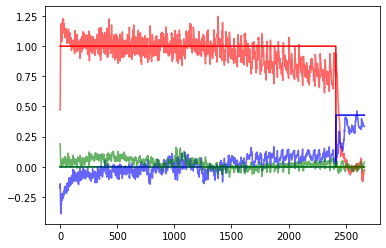

 40%|██████████████████████████████████████████████████████████████                                                                                            | 1209/3000 [7:47:09<11:12:06, 22.52s/it]

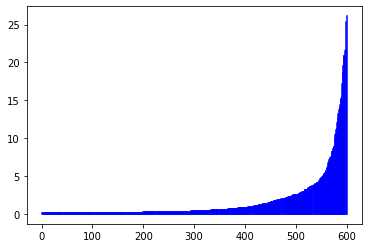

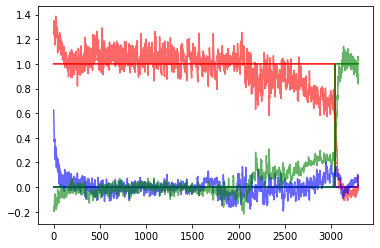

 40%|██████████████████████████████████████████████████████████████▎                                                                                           | 1214/3000 [7:49:00<10:40:15, 21.51s/it]

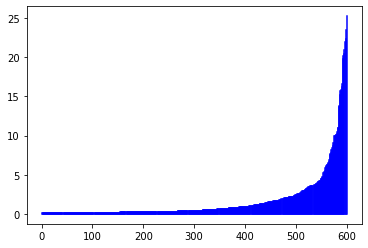

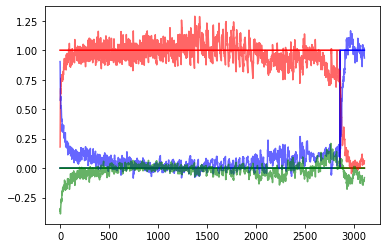

 41%|██████████████████████████████████████████████████████████████▌                                                                                           | 1219/3000 [7:50:52<10:44:23, 21.71s/it]

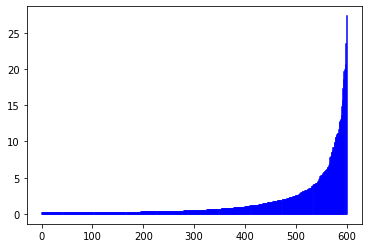

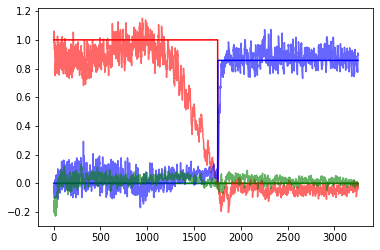

 41%|██████████████████████████████████████████████████████████████▊                                                                                           | 1224/3000 [7:52:43<10:44:58, 21.79s/it]

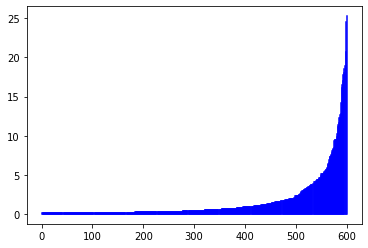

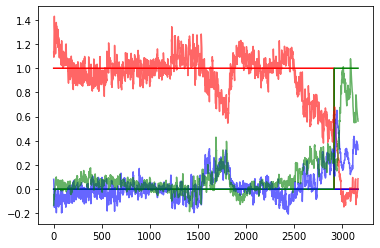

 41%|███████████████████████████████████████████████████████████████                                                                                           | 1229/3000 [7:54:34<10:30:53, 21.37s/it]

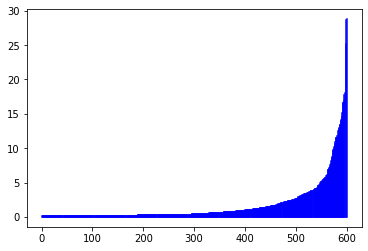

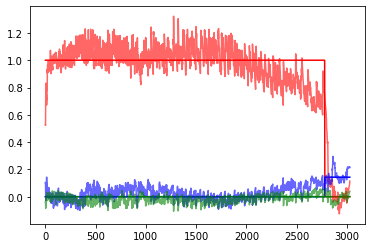

 41%|███████████████████████████████████████████████████████████████▎                                                                                          | 1234/3000 [7:56:26<10:37:35, 21.66s/it]

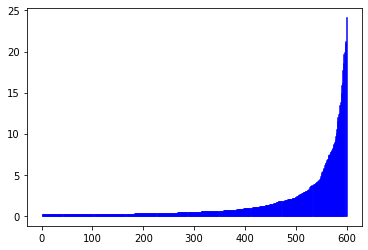

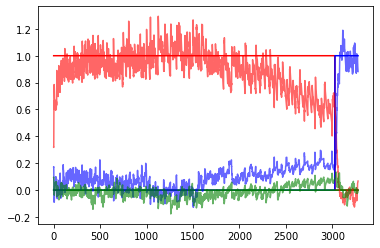

 41%|███████████████████████████████████████████████████████████████▌                                                                                          | 1239/3000 [7:58:14<10:11:31, 20.84s/it]

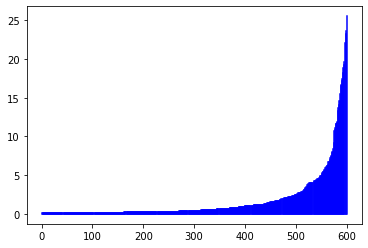

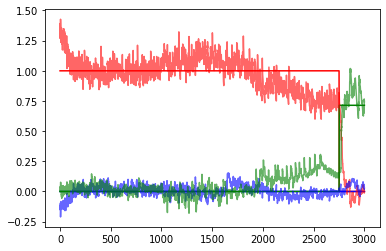

 41%|████████████████████████████████████████████████████████████████▎                                                                                          | 1244/3000 [8:00:01<9:59:24, 20.48s/it]

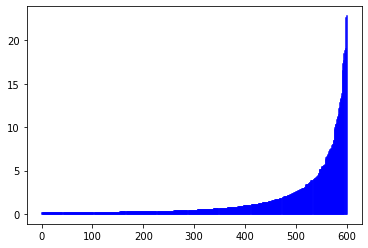

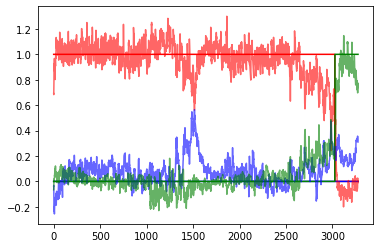

 42%|████████████████████████████████████████████████████████████████                                                                                          | 1249/3000 [8:01:55<10:33:53, 21.72s/it]

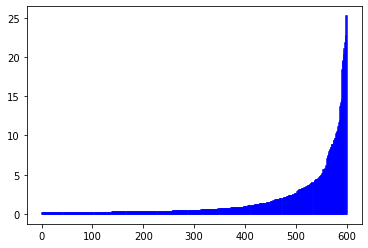

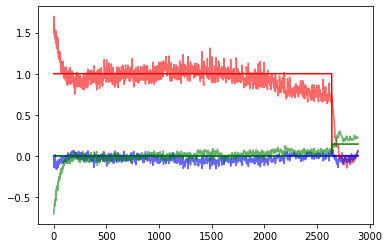

 42%|████████████████████████████████████████████████████████████████▎                                                                                         | 1254/3000 [8:04:36<12:11:27, 25.14s/it]

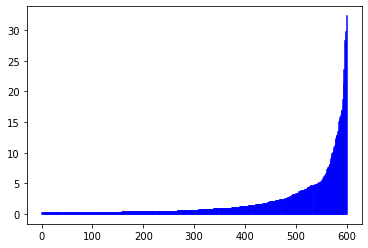

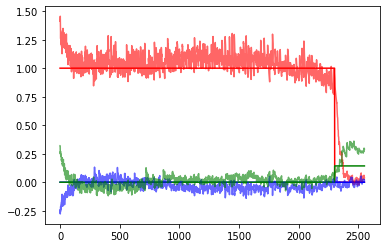

 42%|████████████████████████████████████████████████████████████████▋                                                                                         | 1259/3000 [8:06:23<10:20:02, 21.37s/it]

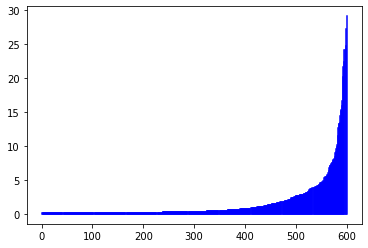

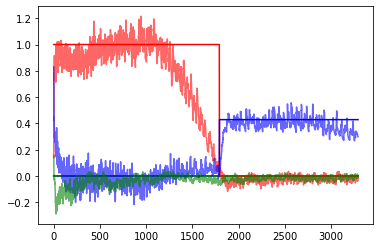

 42%|████████████████████████████████████████████████████████████████▉                                                                                         | 1264/3000 [8:08:14<10:22:28, 21.51s/it]

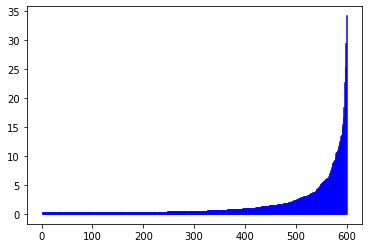

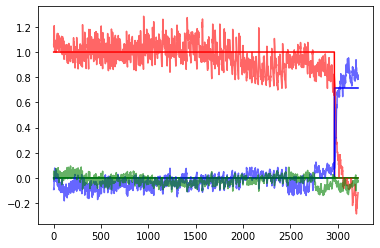

 42%|█████████████████████████████████████████████████████████████████▏                                                                                        | 1269/3000 [8:10:10<10:39:03, 22.15s/it]

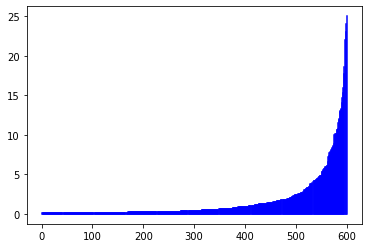

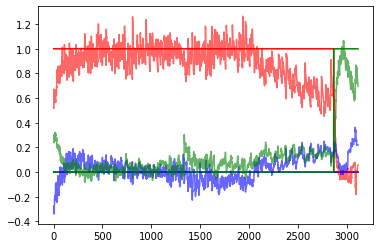

 42%|█████████████████████████████████████████████████████████████████▍                                                                                        | 1274/3000 [8:11:58<10:05:38, 21.05s/it]

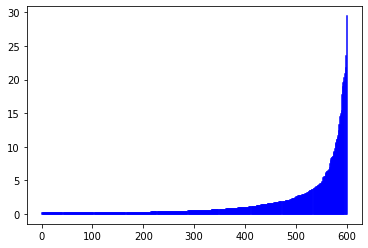

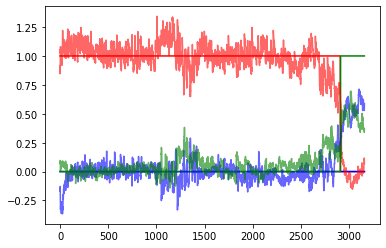

 43%|█████████████████████████████████████████████████████████████████▋                                                                                        | 1279/3000 [8:13:50<10:19:58, 21.61s/it]

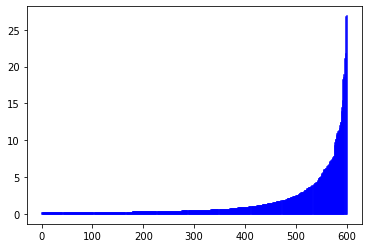

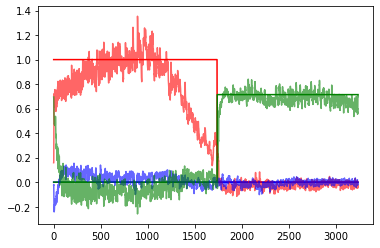

 43%|█████████████████████████████████████████████████████████████████▉                                                                                        | 1284/3000 [8:15:42<10:23:45, 21.81s/it]

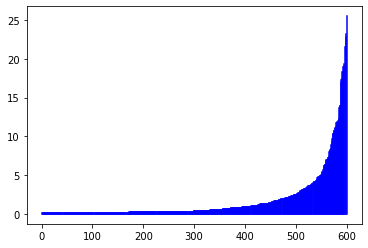

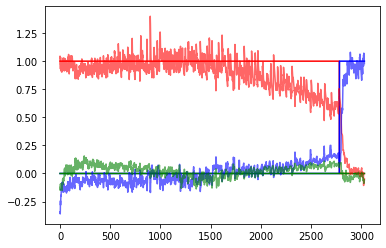

 43%|██████████████████████████████████████████████████████████████████▏                                                                                       | 1289/3000 [8:17:31<10:01:26, 21.09s/it]

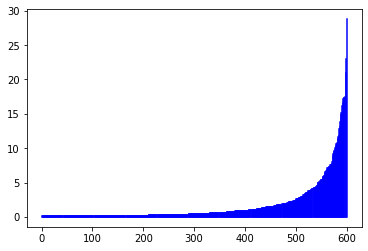

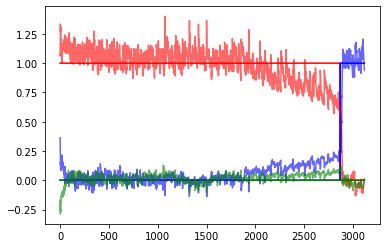

 43%|██████████████████████████████████████████████████████████████████▍                                                                                       | 1294/3000 [8:19:22<10:07:07, 21.35s/it]

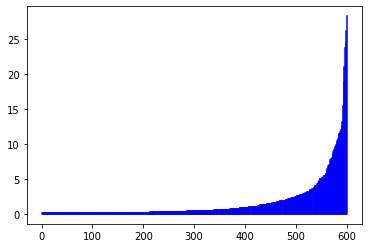

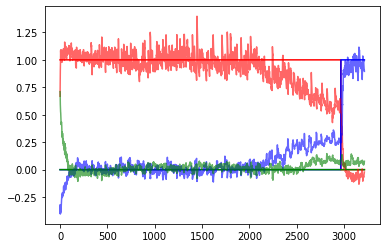

 43%|██████████████████████████████████████████████████████████████████▋                                                                                       | 1299/3000 [8:21:14<10:06:37, 21.40s/it]

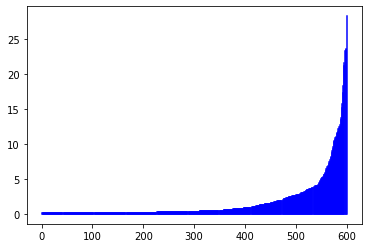

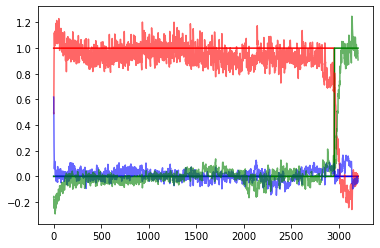

 43%|██████████████████████████████████████████████████████████████████▉                                                                                       | 1304/3000 [8:23:57<11:55:34, 25.32s/it]

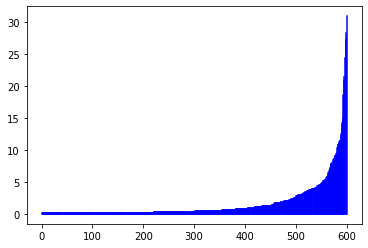

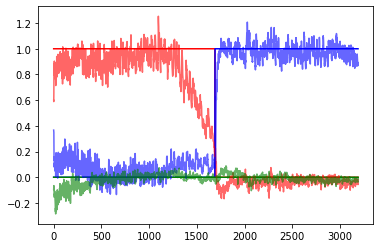

 44%|███████████████████████████████████████████████████████████████████▏                                                                                      | 1309/3000 [8:25:47<10:19:15, 21.97s/it]

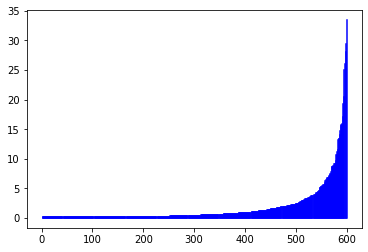

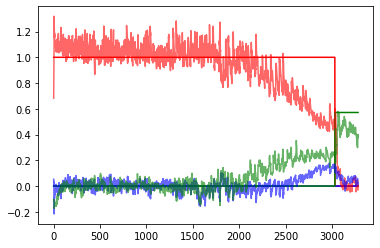

 44%|███████████████████████████████████████████████████████████████████▍                                                                                      | 1314/3000 [8:27:38<10:05:52, 21.56s/it]

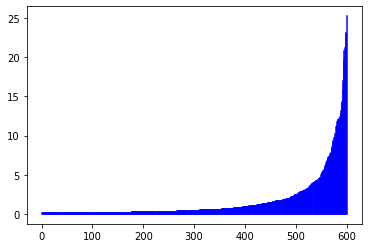

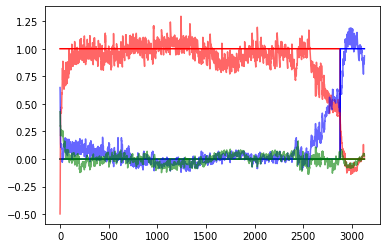

 44%|███████████████████████████████████████████████████████████████████▋                                                                                      | 1319/3000 [8:29:31<10:06:20, 21.64s/it]

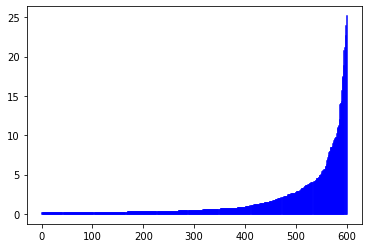

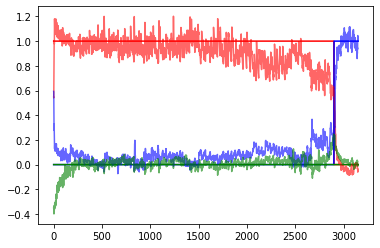

 44%|████████████████████████████████████████████████████████████████████▍                                                                                      | 1324/3000 [8:31:19<9:54:39, 21.29s/it]

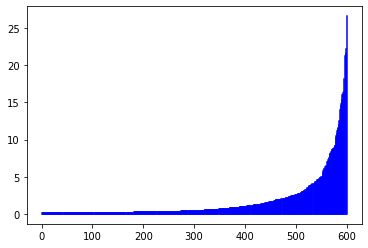

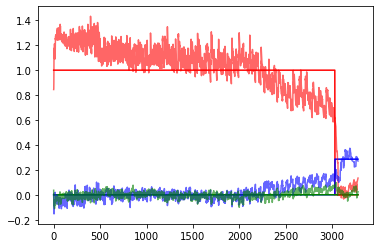

 44%|████████████████████████████████████████████████████████████████████▋                                                                                      | 1329/3000 [8:33:12<9:56:01, 21.40s/it]

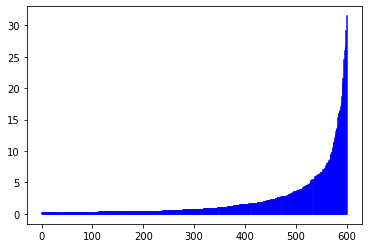

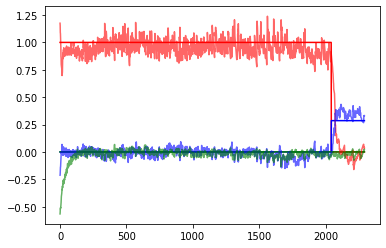

 44%|████████████████████████████████████████████████████████████████████▉                                                                                      | 1334/3000 [8:34:54<9:21:30, 20.22s/it]

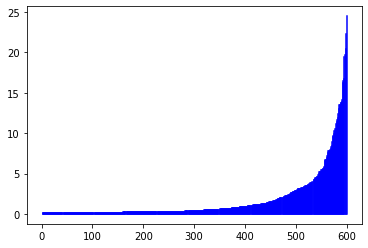

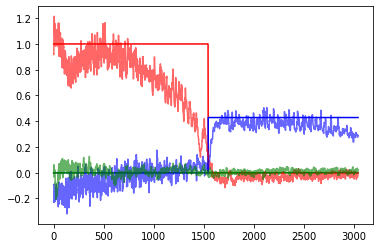

 45%|█████████████████████████████████████████████████████████████████████▏                                                                                     | 1339/3000 [8:36:42<9:28:38, 20.54s/it]

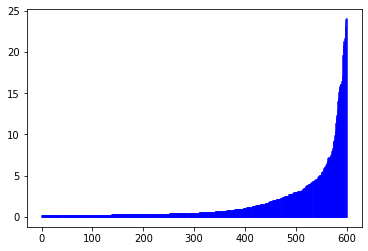

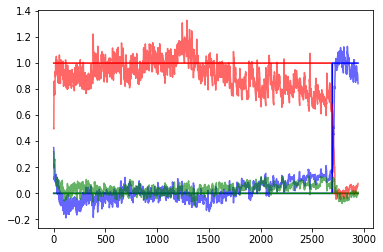

 45%|█████████████████████████████████████████████████████████████████████▍                                                                                     | 1344/3000 [8:38:32<9:35:23, 20.85s/it]

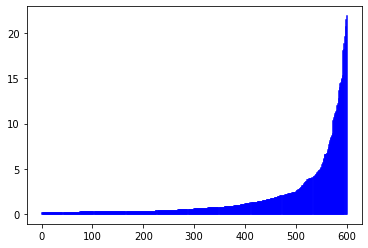

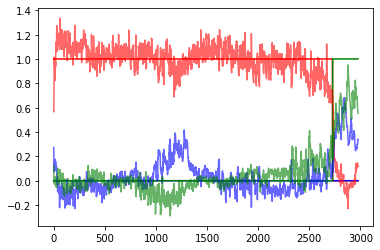

 45%|█████████████████████████████████████████████████████████████████████▋                                                                                     | 1349/3000 [8:40:25<9:43:17, 21.20s/it]

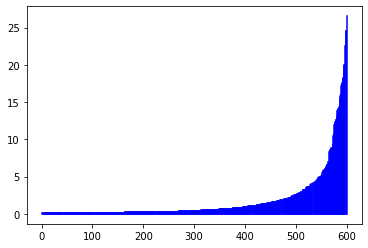

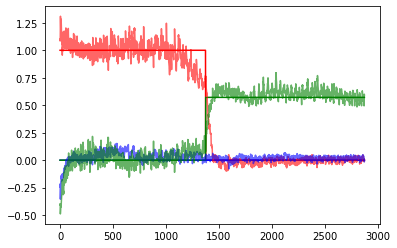

 45%|█████████████████████████████████████████████████████████████████████▌                                                                                    | 1354/3000 [8:43:03<11:16:00, 24.64s/it]

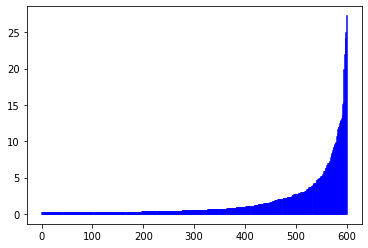

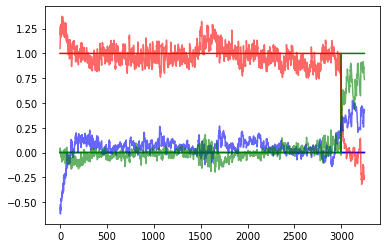

 45%|█████████████████████████████████████████████████████████████████████▊                                                                                    | 1359/3000 [8:44:56<10:10:28, 22.32s/it]

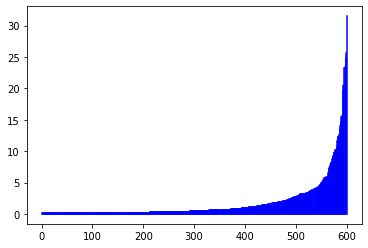

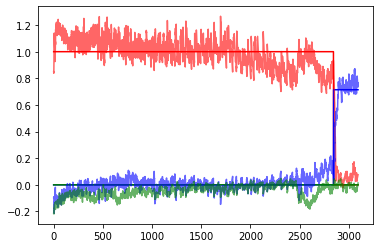

 45%|██████████████████████████████████████████████████████████████████████▍                                                                                    | 1364/3000 [8:46:44<9:27:39, 20.82s/it]

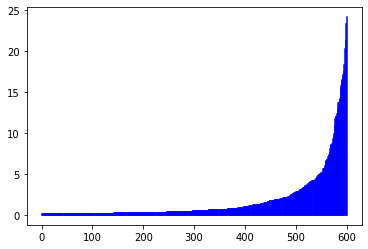

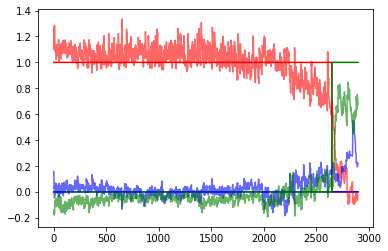

 46%|██████████████████████████████████████████████████████████████████████▋                                                                                    | 1369/3000 [8:48:34<9:29:21, 20.95s/it]

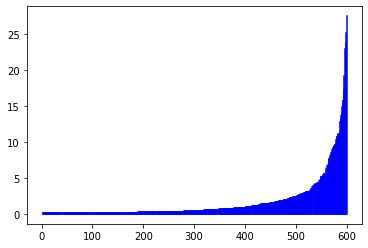

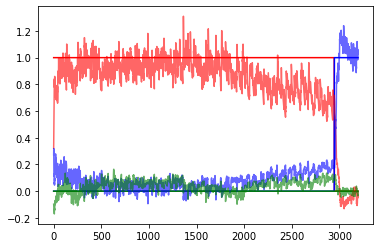

 46%|██████████████████████████████████████████████████████████████████████▉                                                                                    | 1374/3000 [8:50:23<9:43:14, 21.52s/it]

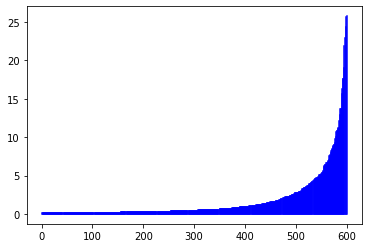

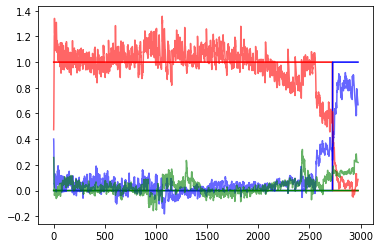

 46%|███████████████████████████████████████████████████████████████████████▏                                                                                   | 1379/3000 [8:52:09<9:12:18, 20.44s/it]

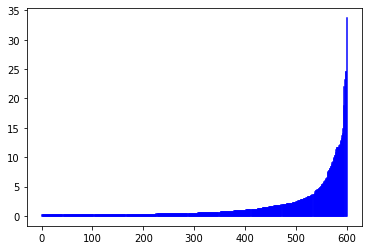

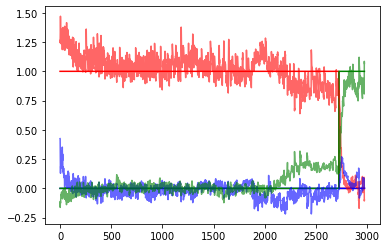

 46%|███████████████████████████████████████████████████████████████████████▌                                                                                   | 1384/3000 [8:53:56<9:24:01, 20.94s/it]

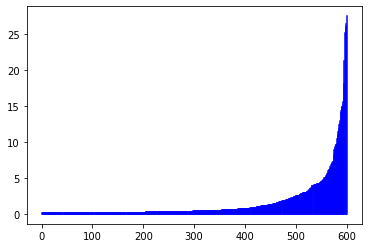

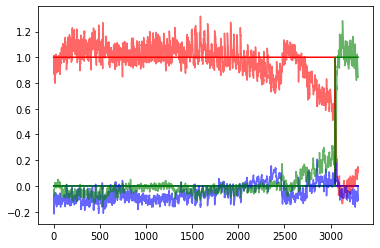

 46%|███████████████████████████████████████████████████████████████████████▊                                                                                   | 1389/3000 [8:55:43<9:15:54, 20.70s/it]

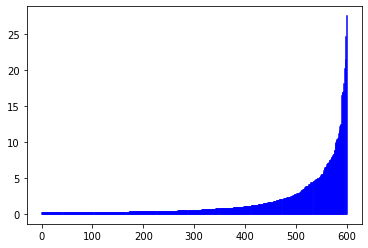

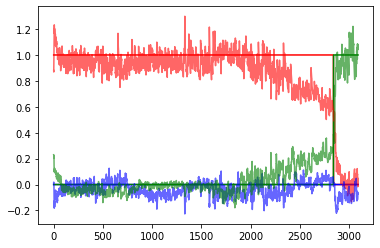

 46%|████████████████████████████████████████████████████████████████████████                                                                                   | 1394/3000 [8:57:26<8:53:44, 19.94s/it]

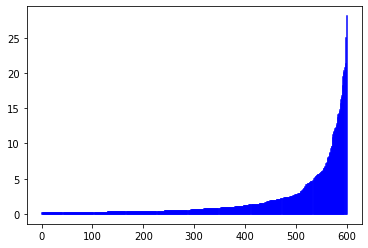

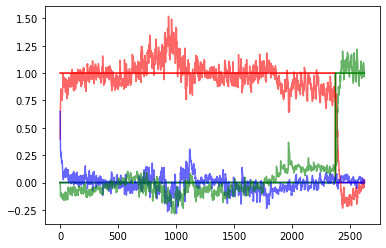

 47%|████████████████████████████████████████████████████████████████████████▎                                                                                  | 1399/3000 [8:59:13<9:12:17, 20.70s/it]

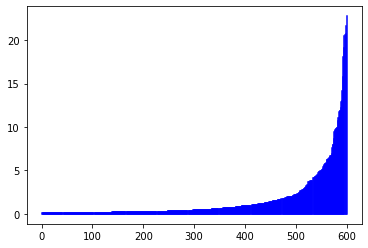

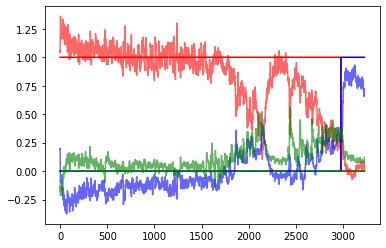

 47%|████████████████████████████████████████████████████████████████████████                                                                                  | 1404/3000 [9:01:56<11:05:40, 25.03s/it]

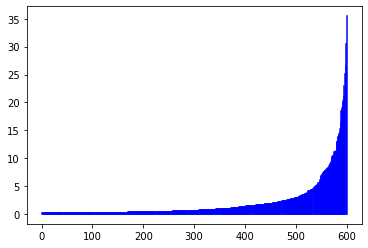

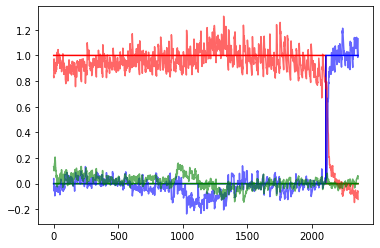

 47%|████████████████████████████████████████████████████████████████████████▊                                                                                  | 1409/3000 [9:03:43<9:27:41, 21.41s/it]

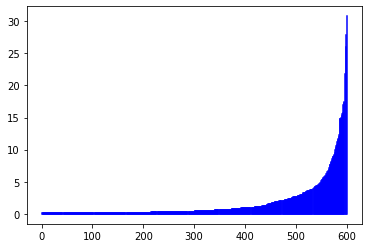

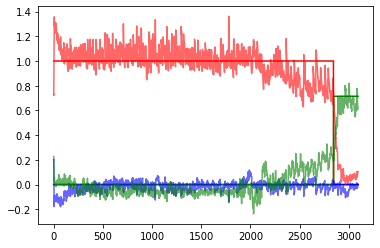

 47%|█████████████████████████████████████████████████████████████████████████                                                                                  | 1414/3000 [9:05:34<9:25:05, 21.38s/it]

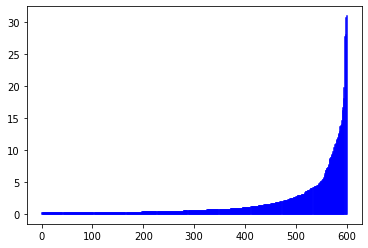

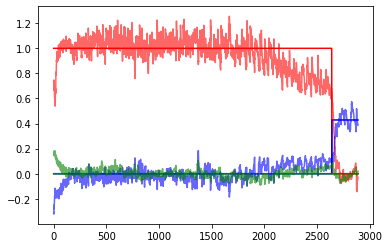

 47%|█████████████████████████████████████████████████████████████████████████▎                                                                                 | 1419/3000 [9:07:26<9:36:57, 21.90s/it]

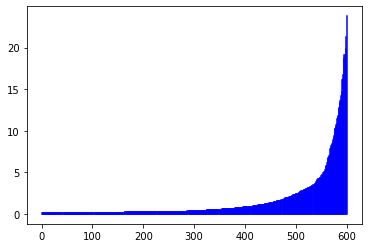

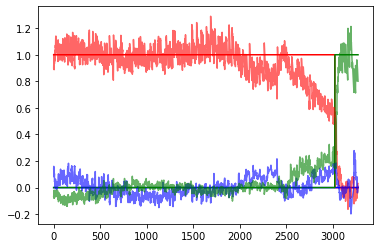

 47%|█████████████████████████████████████████████████████████████████████████▌                                                                                 | 1424/3000 [9:09:18<9:36:40, 21.95s/it]

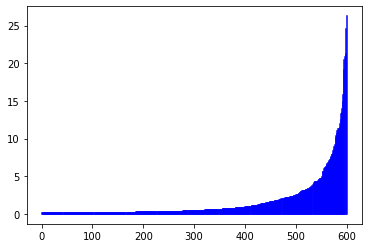

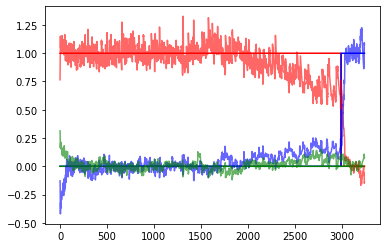

 48%|█████████████████████████████████████████████████████████████████████████▊                                                                                 | 1429/3000 [9:11:04<9:04:30, 20.80s/it]

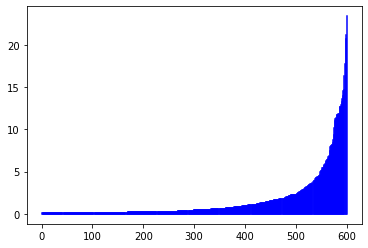

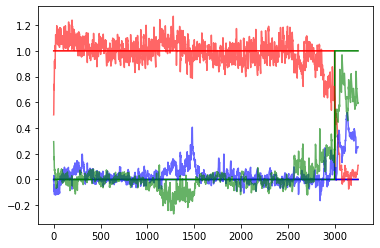

 48%|██████████████████████████████████████████████████████████████████████████                                                                                 | 1434/3000 [9:12:56<9:21:09, 21.50s/it]

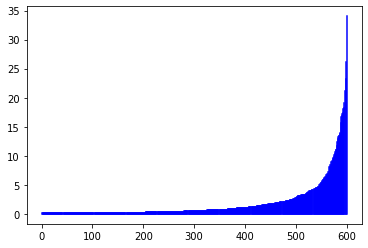

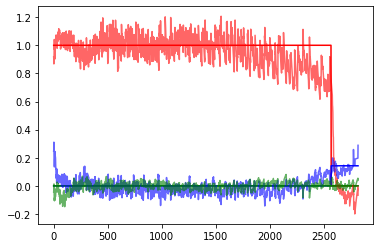

 48%|██████████████████████████████████████████████████████████████████████████▎                                                                                | 1439/3000 [9:14:45<9:10:26, 21.16s/it]

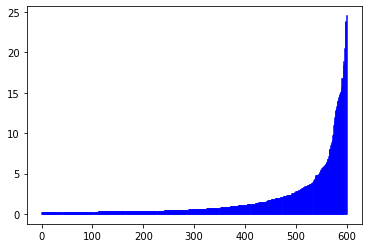

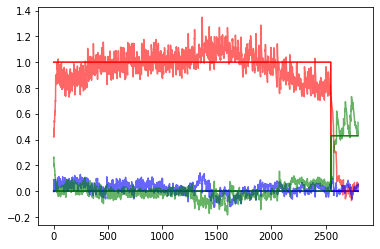

 48%|██████████████████████████████████████████████████████████████████████████▌                                                                                | 1444/3000 [9:16:37<9:20:25, 21.61s/it]

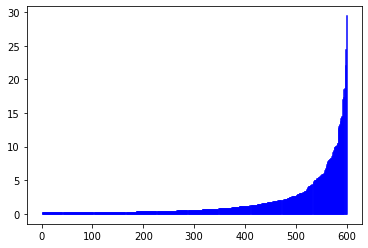

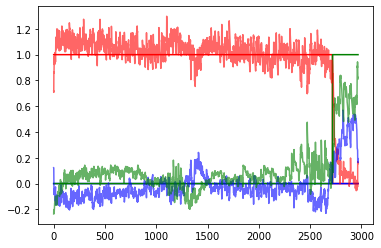

 48%|██████████████████████████████████████████████████████████████████████████▊                                                                                | 1449/3000 [9:18:29<9:16:44, 21.54s/it]

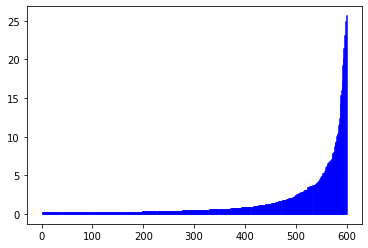

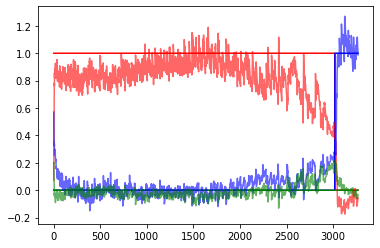

 48%|██████████████████████████████████████████████████████████████████████████▋                                                                               | 1454/3000 [9:21:03<10:14:03, 23.83s/it]

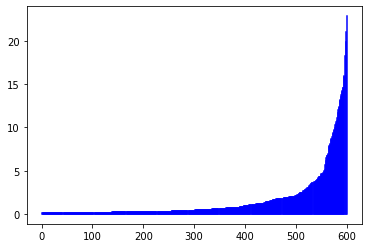

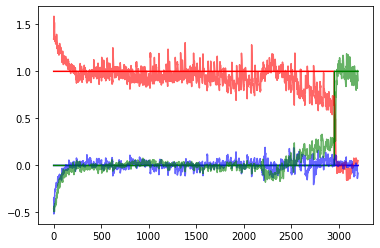

 49%|███████████████████████████████████████████████████████████████████████████▍                                                                               | 1459/3000 [9:22:55<9:28:50, 22.15s/it]

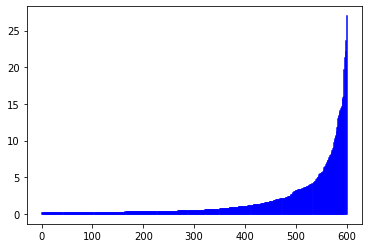

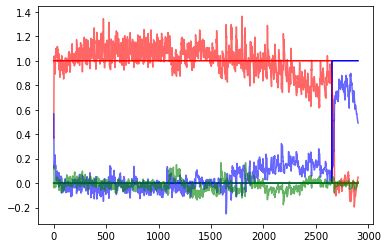

 49%|███████████████████████████████████████████████████████████████████████████▋                                                                               | 1464/3000 [9:24:46<9:11:16, 21.53s/it]

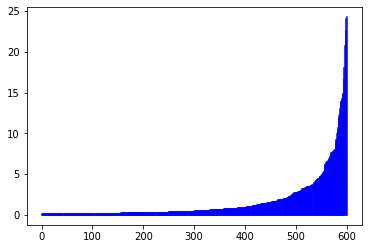

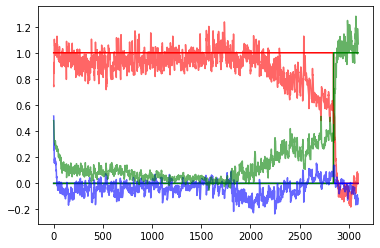

 49%|███████████████████████████████████████████████████████████████████████████▉                                                                               | 1469/3000 [9:26:36<9:07:48, 21.47s/it]

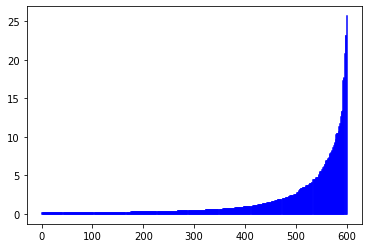

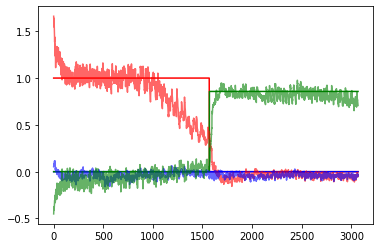

 49%|████████████████████████████████████████████████████████████████████████████▏                                                                              | 1474/3000 [9:28:26<8:58:14, 21.16s/it]

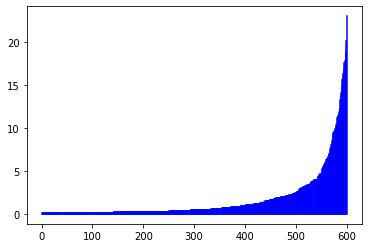

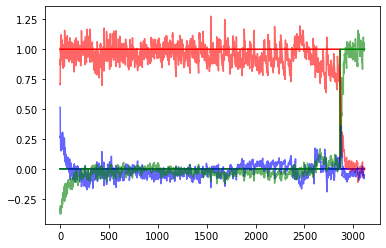

 49%|████████████████████████████████████████████████████████████████████████████▍                                                                              | 1479/3000 [9:30:18<9:07:32, 21.60s/it]

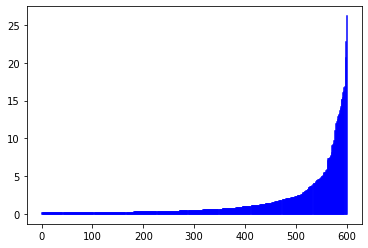

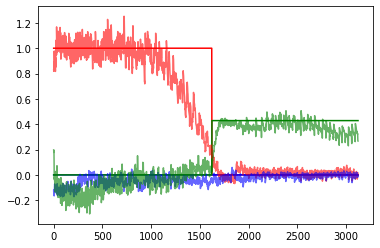

 49%|████████████████████████████████████████████████████████████████████████████▋                                                                              | 1484/3000 [9:32:11<9:06:08, 21.62s/it]

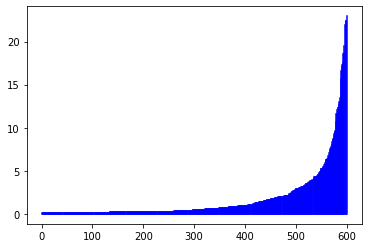

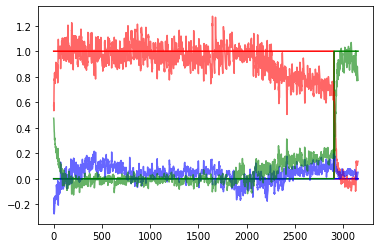

 50%|████████████████████████████████████████████████████████████████████████████▉                                                                              | 1489/3000 [9:34:00<8:52:33, 21.15s/it]

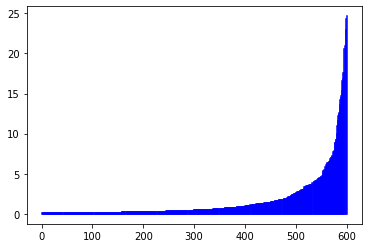

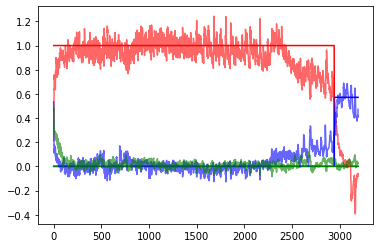

 50%|█████████████████████████████████████████████████████████████████████████████▏                                                                             | 1494/3000 [9:35:48<8:48:03, 21.04s/it]

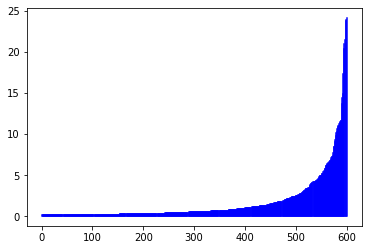

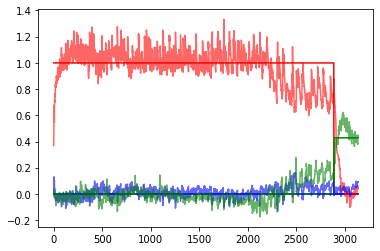

 50%|█████████████████████████████████████████████████████████████████████████████▍                                                                             | 1499/3000 [9:37:43<9:09:13, 21.95s/it]

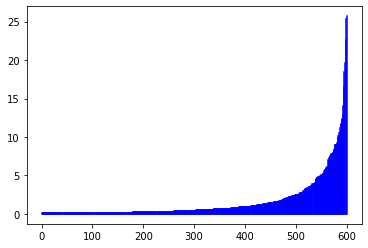

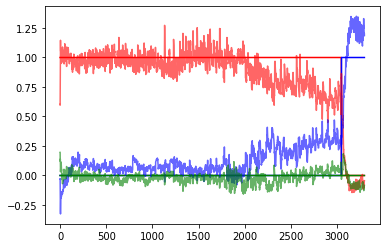

 50%|█████████████████████████████████████████████████████████████████████████████▏                                                                            | 1504/3000 [9:40:24<10:24:57, 25.07s/it]

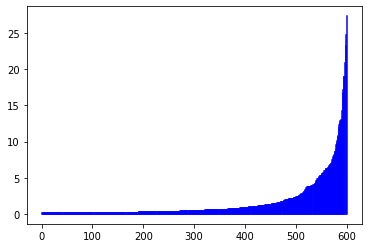

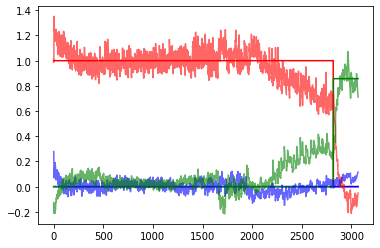

 50%|█████████████████████████████████████████████████████████████████████████████▉                                                                             | 1509/3000 [9:42:16<9:00:41, 21.76s/it]

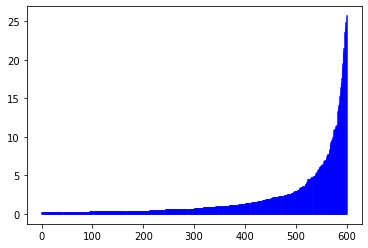

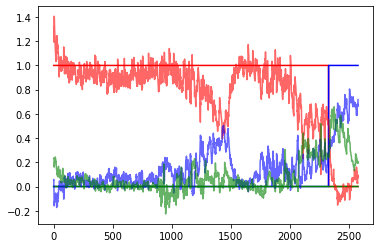

 50%|██████████████████████████████████████████████████████████████████████████████▏                                                                            | 1514/3000 [9:44:08<8:57:05, 21.69s/it]

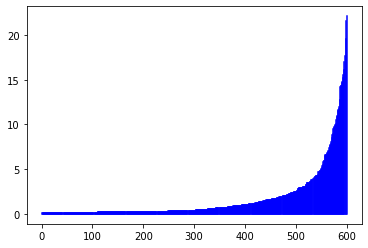

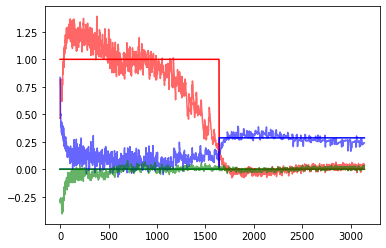

 51%|██████████████████████████████████████████████████████████████████████████████▍                                                                            | 1519/3000 [9:45:58<8:46:32, 21.33s/it]

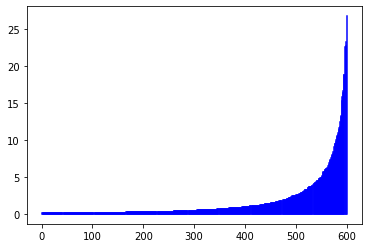

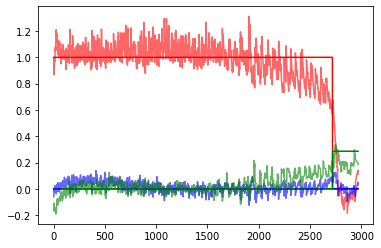

 51%|██████████████████████████████████████████████████████████████████████████████▋                                                                            | 1524/3000 [9:47:48<8:46:40, 21.41s/it]

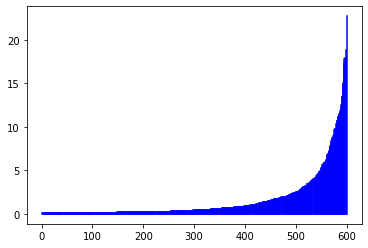

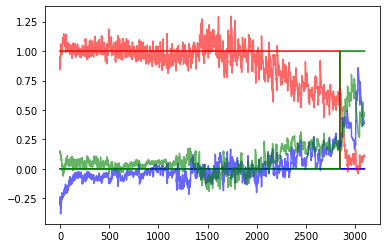

 51%|██████████████████████████████████████████████████████████████████████████████▉                                                                            | 1529/3000 [9:49:41<8:48:51, 21.57s/it]

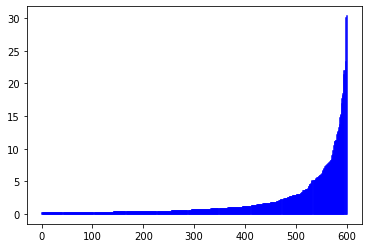

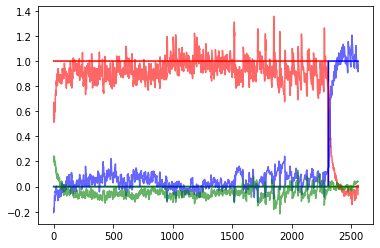

 51%|███████████████████████████████████████████████████████████████████████████████▎                                                                           | 1534/3000 [9:51:27<8:28:29, 20.81s/it]

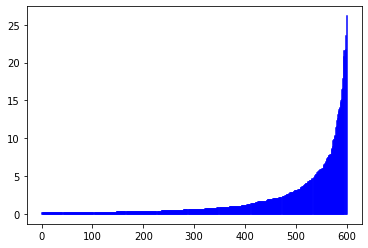

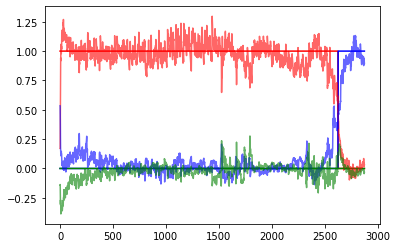

 51%|███████████████████████████████████████████████████████████████████████████████▌                                                                           | 1539/3000 [9:53:15<8:18:26, 20.47s/it]

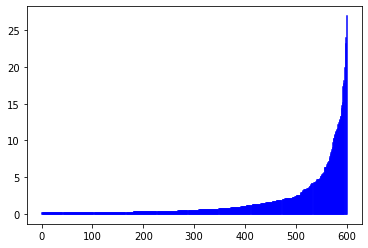

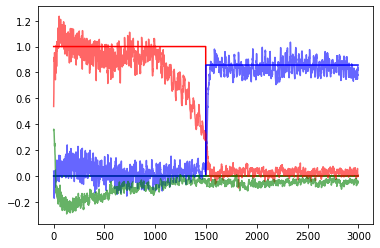

 51%|███████████████████████████████████████████████████████████████████████████████▊                                                                           | 1544/3000 [9:55:09<8:45:40, 21.66s/it]

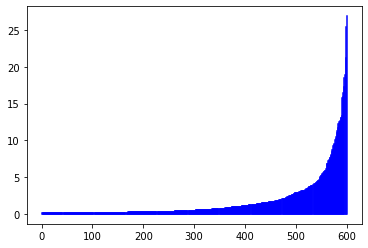

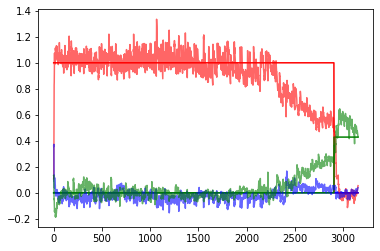

 52%|████████████████████████████████████████████████████████████████████████████████                                                                           | 1549/3000 [9:56:59<8:33:54, 21.25s/it]

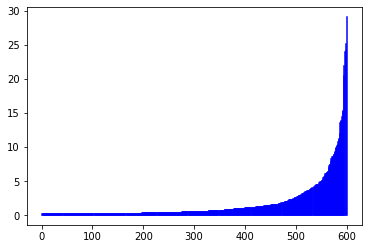

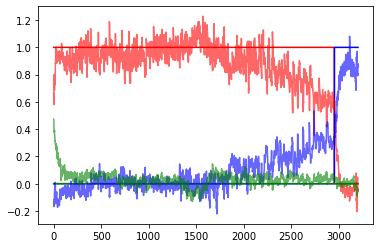

 52%|███████████████████████████████████████████████████████████████████████████████▊                                                                          | 1554/3000 [9:59:42<10:04:08, 25.07s/it]

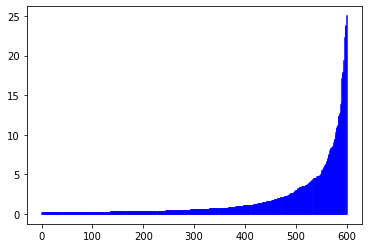

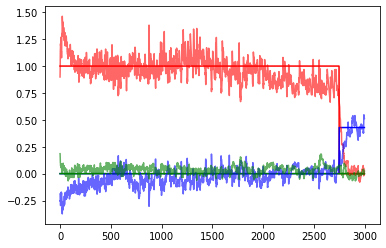

 52%|████████████████████████████████████████████████████████████████████████████████                                                                          | 1559/3000 [10:01:34<8:48:55, 22.02s/it]

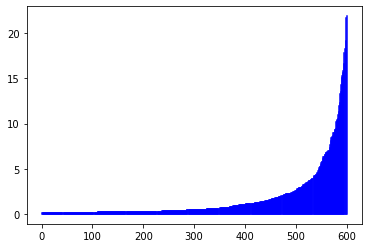

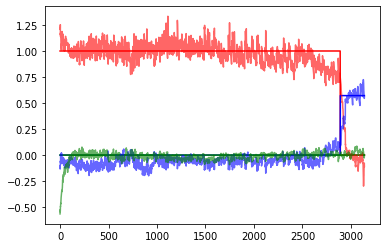

 52%|████████████████████████████████████████████████████████████████████████████████▎                                                                         | 1564/3000 [10:03:22<8:18:19, 20.82s/it]

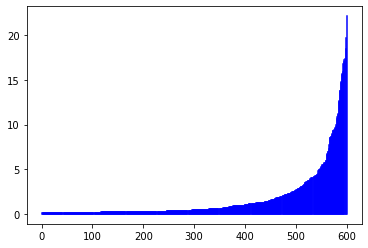

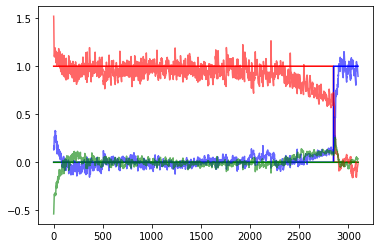

 52%|████████████████████████████████████████████████████████████████████████████████▌                                                                         | 1569/3000 [10:05:13<8:25:57, 21.21s/it]

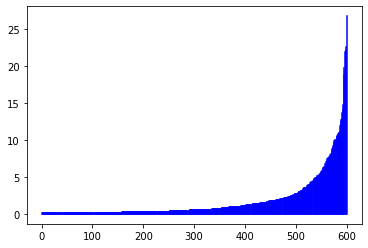

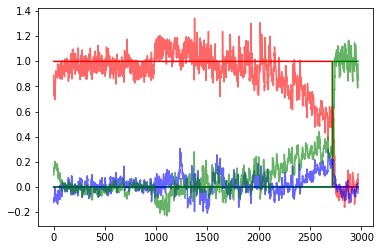

 52%|████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1574/3000 [10:07:05<8:27:11, 21.34s/it]

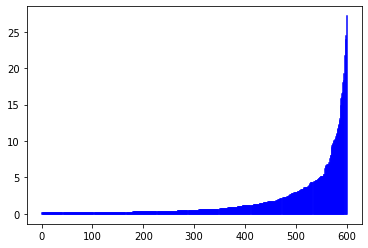

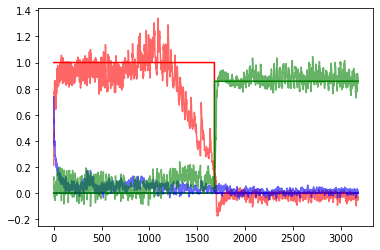

 53%|█████████████████████████████████████████████████████████████████████████████████                                                                         | 1579/3000 [10:08:56<8:23:04, 21.24s/it]

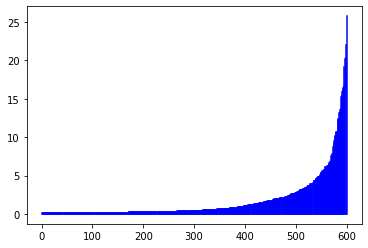

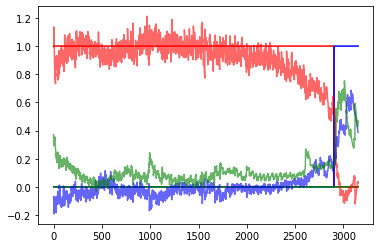

 53%|█████████████████████████████████████████████████████████████████████████████████▎                                                                        | 1584/3000 [10:10:50<8:35:10, 21.83s/it]

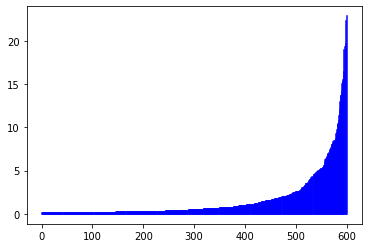

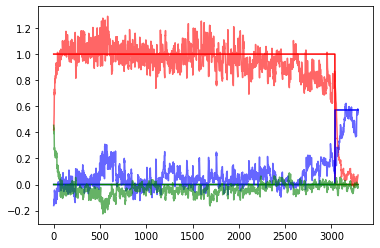

 53%|█████████████████████████████████████████████████████████████████████████████████▌                                                                        | 1589/3000 [10:12:42<8:26:57, 21.56s/it]

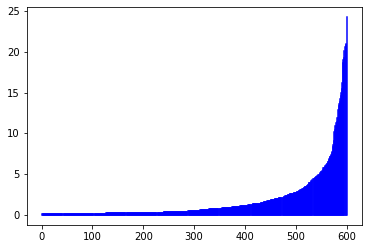

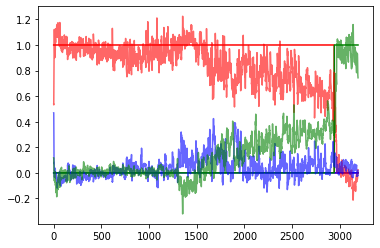

 53%|█████████████████████████████████████████████████████████████████████████████████▊                                                                        | 1594/3000 [10:14:31<8:12:46, 21.03s/it]

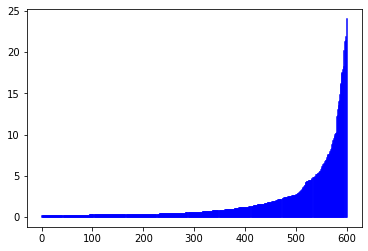

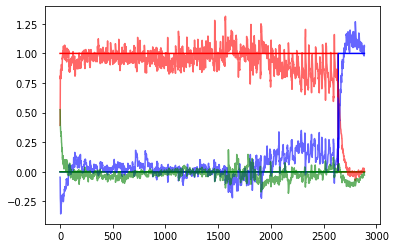

 53%|██████████████████████████████████████████████████████████████████████████████████                                                                        | 1599/3000 [10:16:20<8:14:24, 21.17s/it]

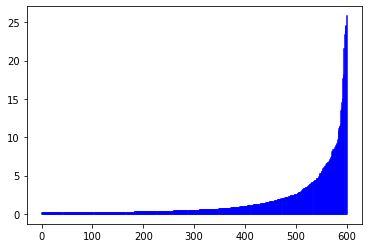

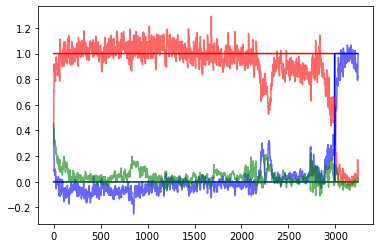

 53%|██████████████████████████████████████████████████████████████████████████████████▎                                                                       | 1604/3000 [10:19:03<9:48:08, 25.28s/it]

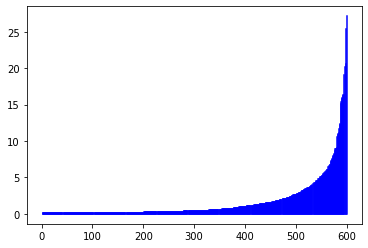

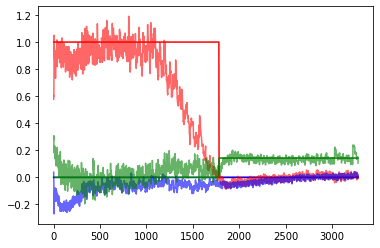

 54%|██████████████████████████████████████████████████████████████████████████████████▌                                                                       | 1609/3000 [10:20:52<8:27:46, 21.90s/it]

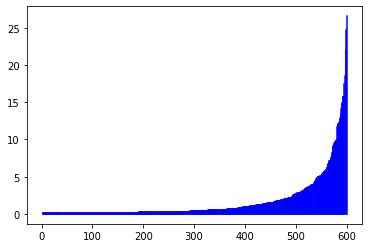

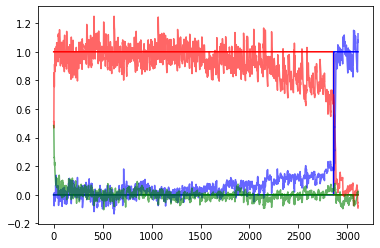

 54%|██████████████████████████████████████████████████████████████████████████████████▊                                                                       | 1614/3000 [10:22:41<8:06:52, 21.08s/it]

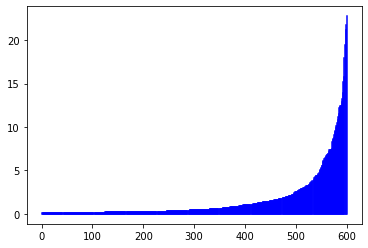

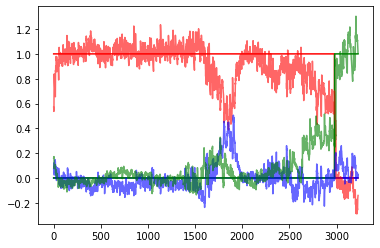

 54%|███████████████████████████████████████████████████████████████████████████████████                                                                       | 1619/3000 [10:24:34<8:19:11, 21.69s/it]

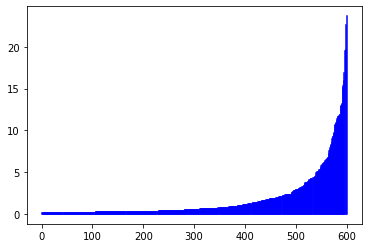

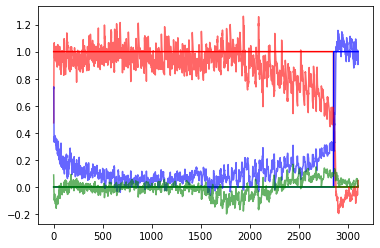

 54%|███████████████████████████████████████████████████████████████████████████████████▎                                                                      | 1624/3000 [10:26:23<8:01:19, 20.99s/it]

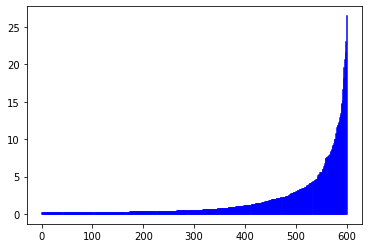

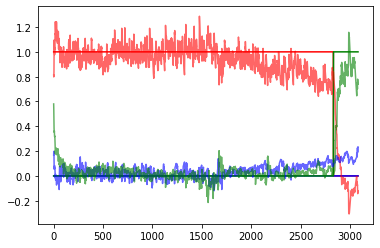

 54%|███████████████████████████████████████████████████████████████████████████████████▌                                                                      | 1629/3000 [10:28:14<8:11:50, 21.53s/it]

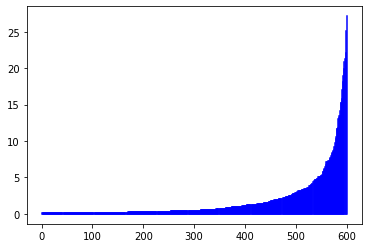

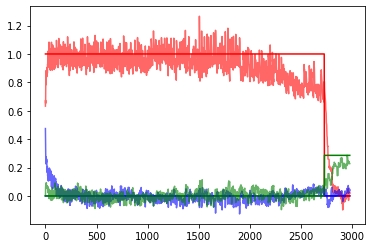

 54%|███████████████████████████████████████████████████████████████████████████████████▉                                                                      | 1634/3000 [10:30:06<8:19:07, 21.92s/it]

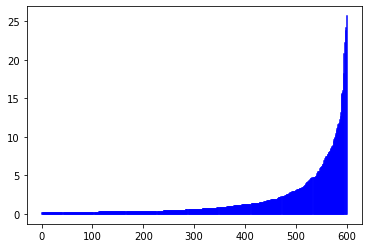

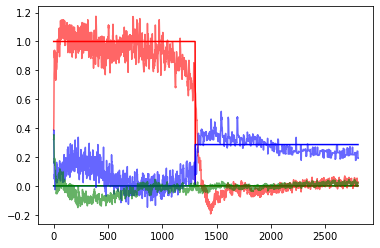

 55%|████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 1639/3000 [10:31:58<8:13:59, 21.78s/it]

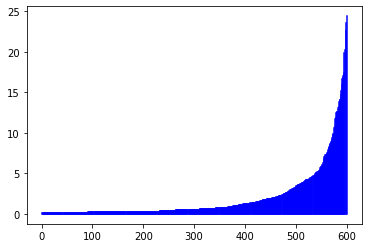

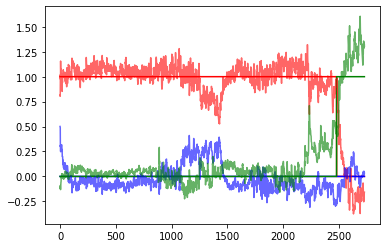

 55%|████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1644/3000 [10:33:45<7:59:21, 21.21s/it]

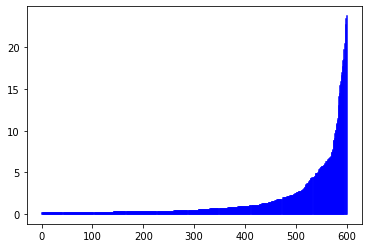

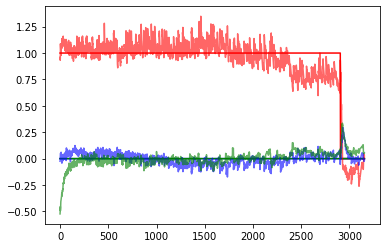

 55%|████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 1649/3000 [10:35:34<7:48:43, 20.82s/it]

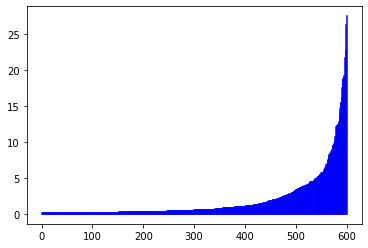

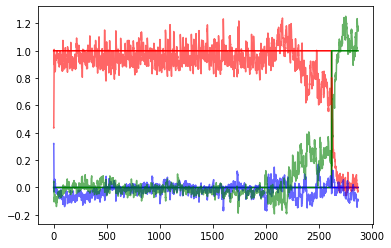

 55%|████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 1654/3000 [10:38:17<9:22:11, 25.06s/it]

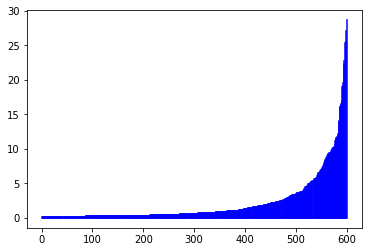

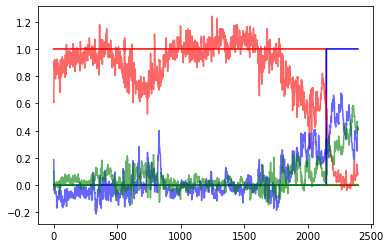

 55%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 1659/3000 [10:40:06<8:08:37, 21.86s/it]

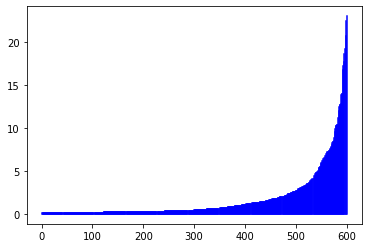

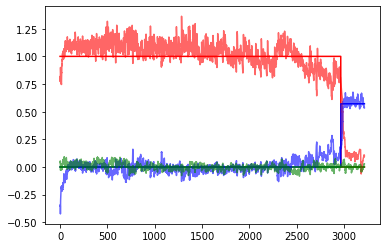

 55%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 1664/3000 [10:41:58<7:57:47, 21.46s/it]

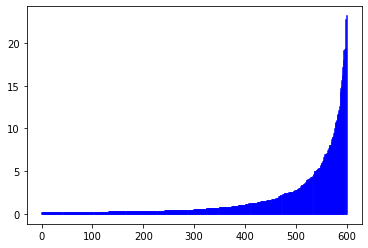

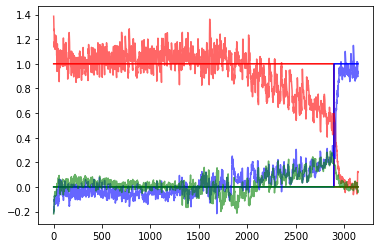

 56%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 1669/3000 [10:43:49<8:00:20, 21.65s/it]

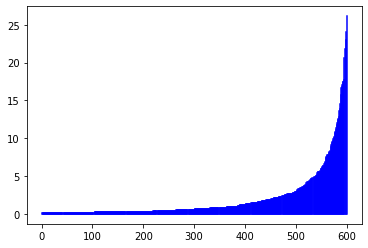

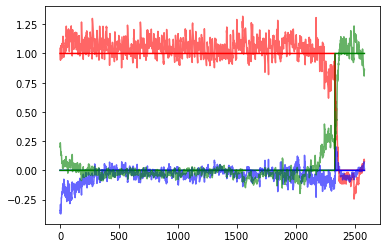

 56%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 1674/3000 [10:45:45<8:12:13, 22.27s/it]

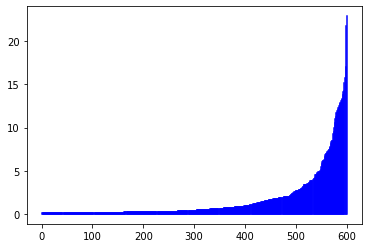

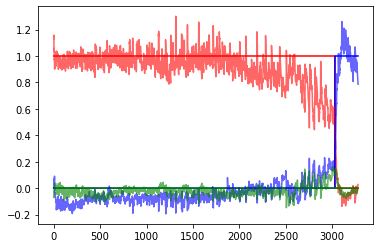

 56%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 1679/3000 [10:47:38<8:02:48, 21.93s/it]

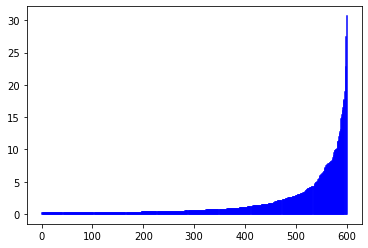

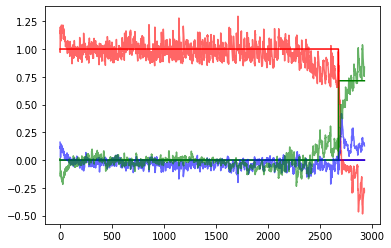

 56%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1684/3000 [10:49:28<7:53:44, 21.60s/it]

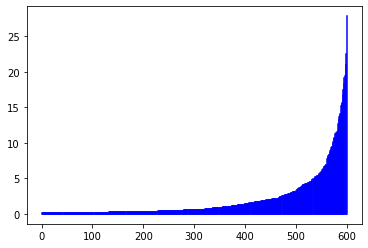

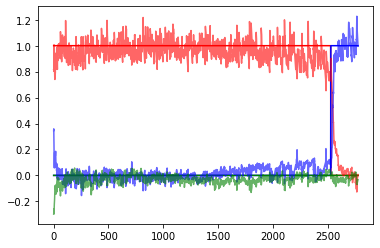

 56%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 1689/3000 [10:51:16<7:37:12, 20.93s/it]

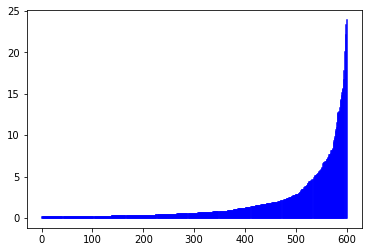

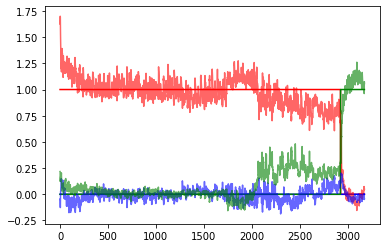

 56%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 1694/3000 [10:53:03<7:28:20, 20.60s/it]

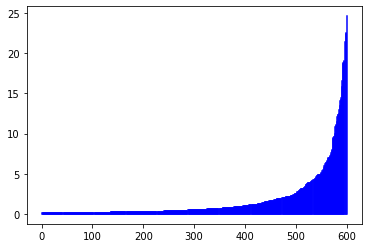

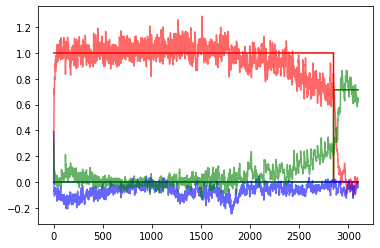

 57%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 1699/3000 [10:54:54<7:34:19, 20.95s/it]

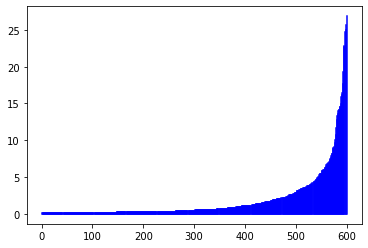

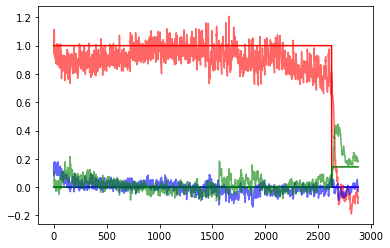

 57%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 1704/3000 [10:57:32<8:54:59, 24.77s/it]

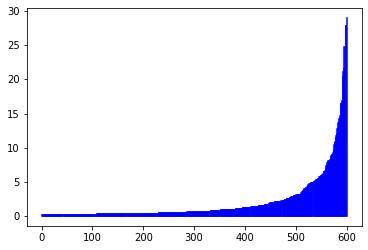

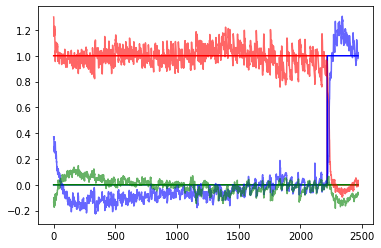

 57%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 1709/3000 [10:59:21<7:53:04, 21.99s/it]

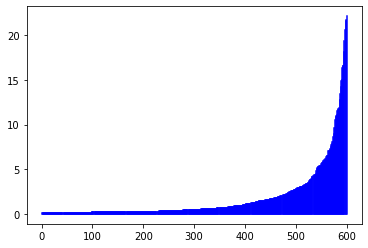

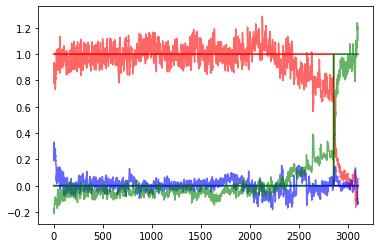

 57%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 1714/3000 [11:01:13<7:42:00, 21.56s/it]

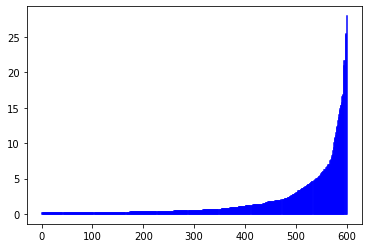

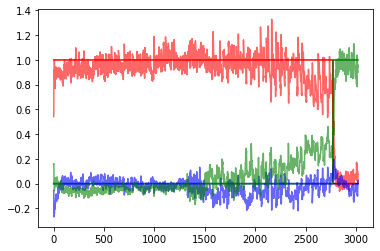

 57%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 1719/3000 [11:02:59<7:23:00, 20.75s/it]

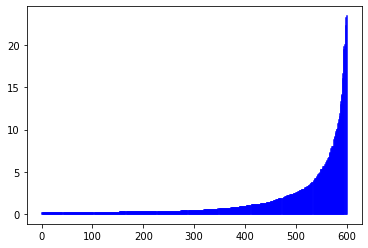

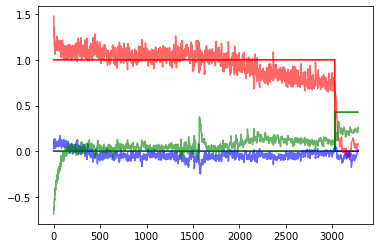

 57%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 1724/3000 [11:04:48<7:28:20, 21.08s/it]

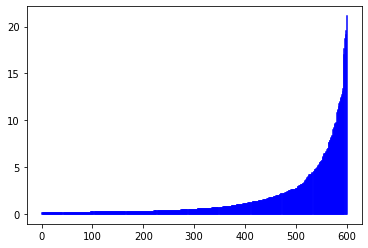

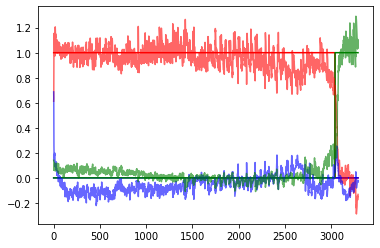

 58%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 1729/3000 [11:06:39<7:36:20, 21.54s/it]

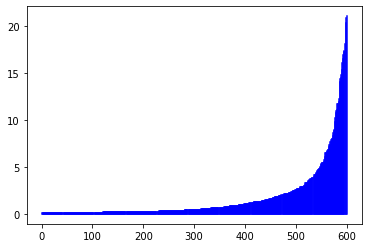

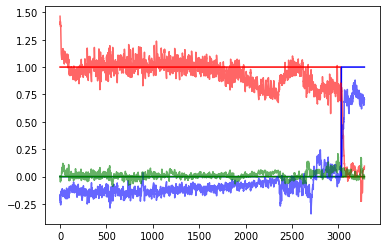

 58%|█████████████████████████████████████████████████████████████████████████████████████████                                                                 | 1734/3000 [11:08:29<7:25:07, 21.10s/it]

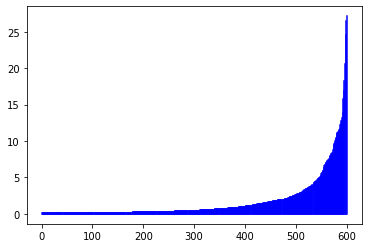

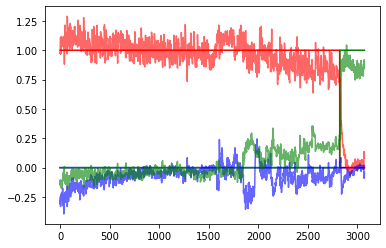

 58%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 1739/3000 [11:10:18<7:23:54, 21.12s/it]

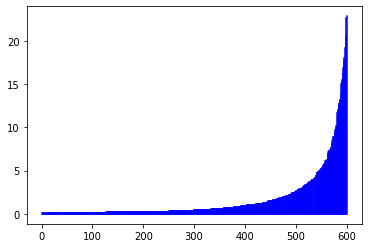

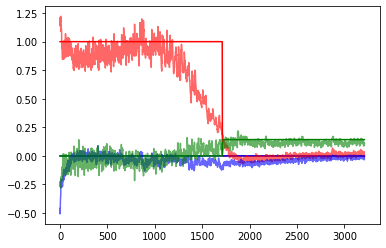

 58%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 1744/3000 [11:12:07<7:23:10, 21.17s/it]

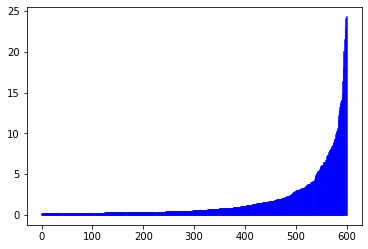

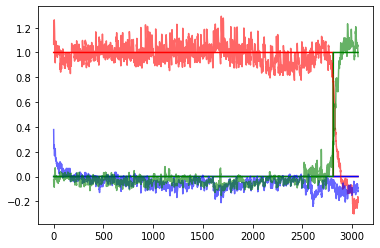

 58%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 1749/3000 [11:13:57<7:23:33, 21.27s/it]

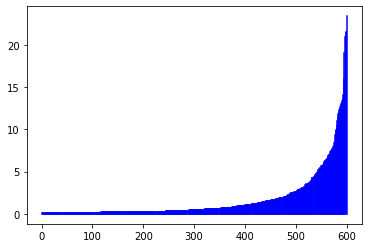

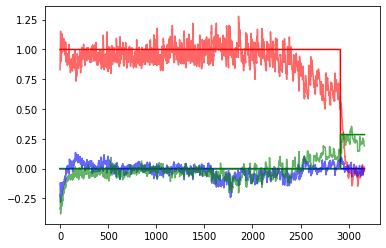

 58%|██████████████████████████████████████████████████████████████████████████████████████████                                                                | 1754/3000 [11:16:36<8:26:00, 24.37s/it]

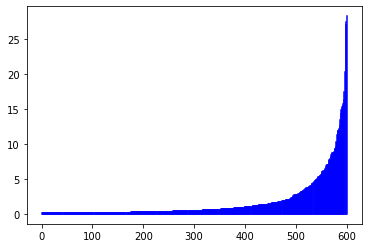

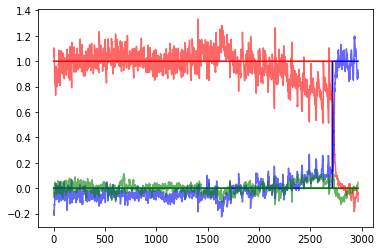

 59%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 1759/3000 [11:18:28<7:33:12, 21.91s/it]

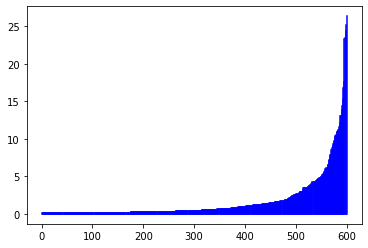

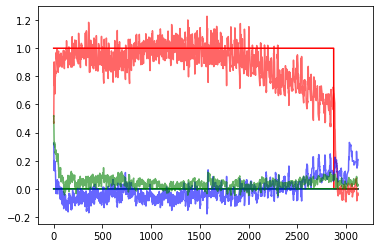

 59%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 1764/3000 [11:20:23<7:34:46, 22.08s/it]

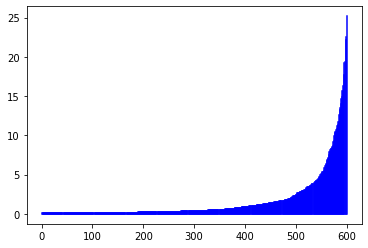

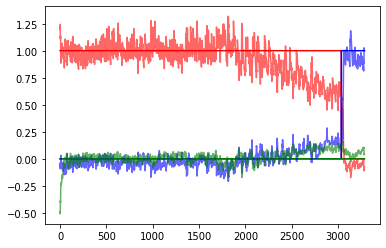

 59%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 1769/3000 [11:22:11<7:14:05, 21.16s/it]

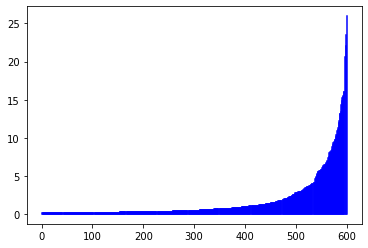

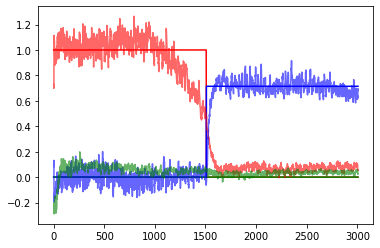

 59%|███████████████████████████████████████████████████████████████████████████████████████████                                                               | 1774/3000 [11:23:58<7:09:40, 21.03s/it]

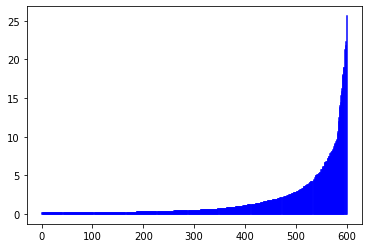

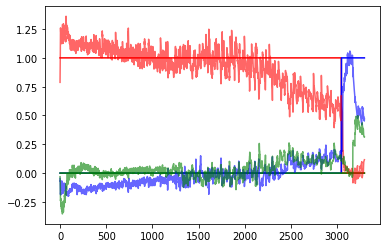

 59%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 1779/3000 [11:25:47<7:04:31, 20.86s/it]

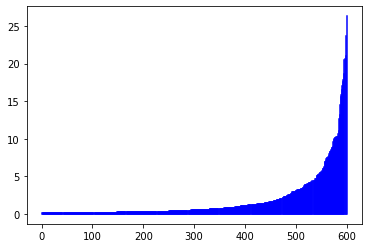

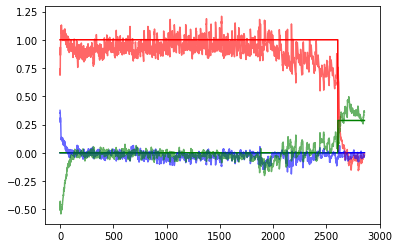

 59%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 1784/3000 [11:27:38<7:13:03, 21.37s/it]

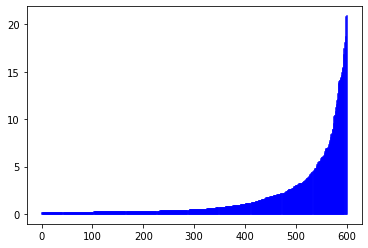

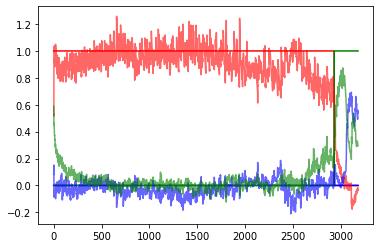

 60%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 1789/3000 [11:29:33<7:25:31, 22.07s/it]

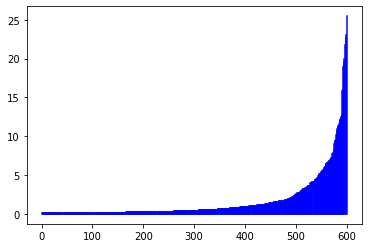

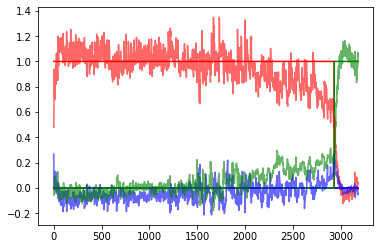

 60%|████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1794/3000 [11:31:24<7:11:32, 21.47s/it]

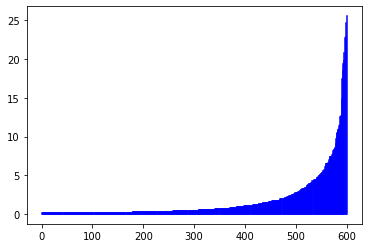

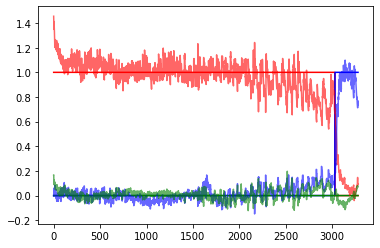

 60%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 1799/3000 [11:33:11<6:52:23, 20.60s/it]

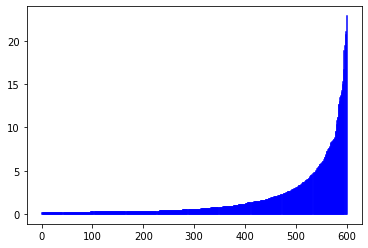

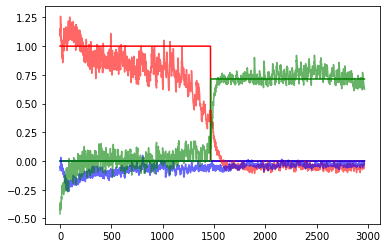

 60%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 1804/3000 [11:35:54<8:24:19, 25.30s/it]

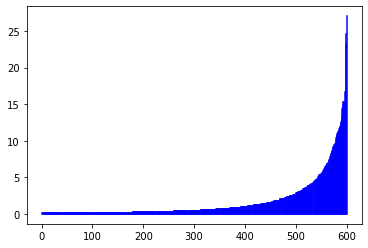

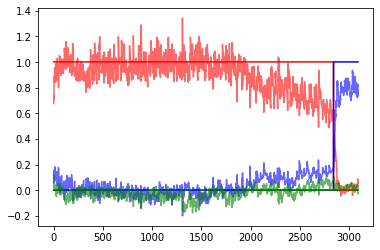

 60%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 1809/3000 [11:37:45<7:18:46, 22.10s/it]

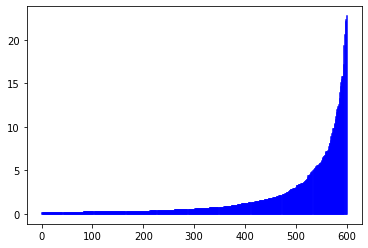

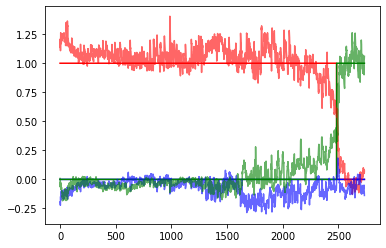

 60%|█████████████████████████████████████████████████████████████████████████████████████████████                                                             | 1814/3000 [11:39:32<6:53:13, 20.90s/it]

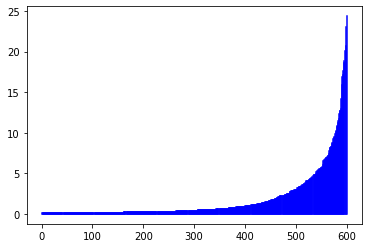

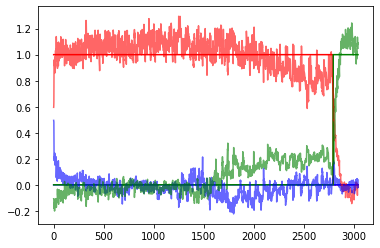

 61%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 1819/3000 [11:41:20<6:42:33, 20.45s/it]

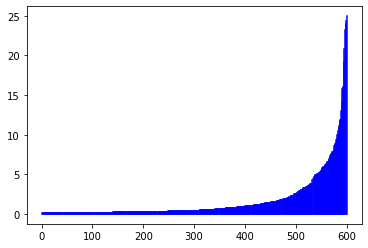

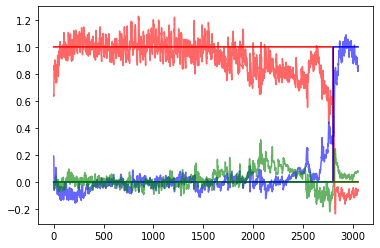

 61%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 1824/3000 [11:43:11<6:46:43, 20.75s/it]

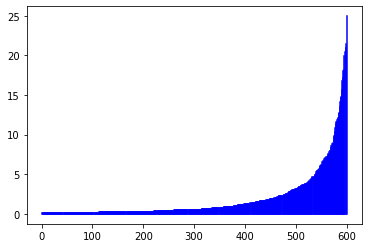

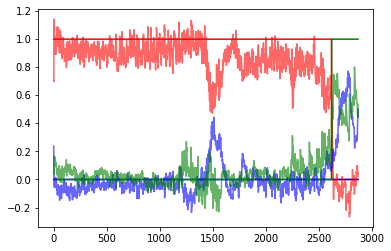

 61%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 1829/3000 [11:45:04<7:10:55, 22.08s/it]

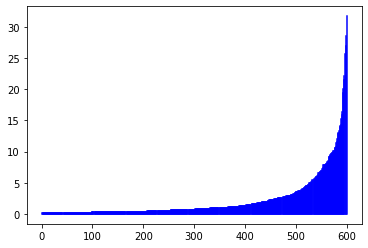

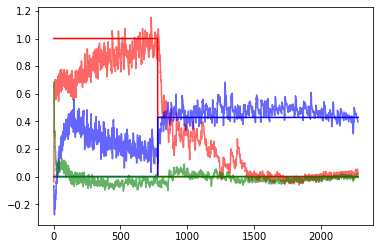

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 1834/3000 [11:46:55<7:04:37, 21.85s/it]

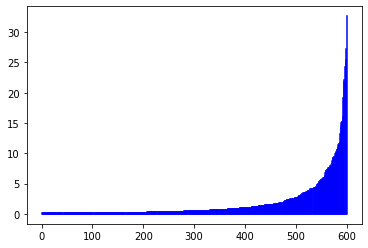

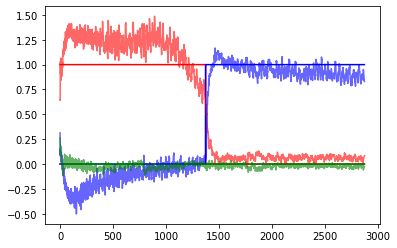

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 1839/3000 [11:48:46<7:00:22, 21.73s/it]

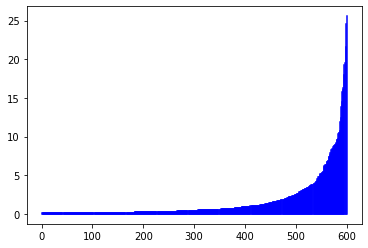

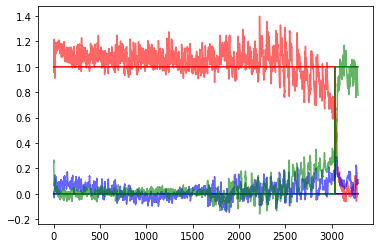

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 1844/3000 [11:50:33<6:38:23, 20.68s/it]

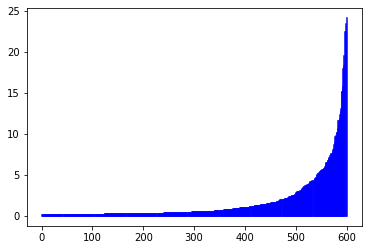

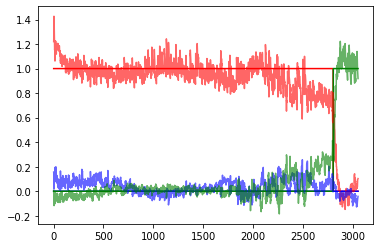

 62%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 1849/3000 [11:52:25<6:44:28, 21.08s/it]

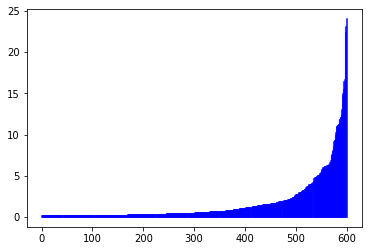

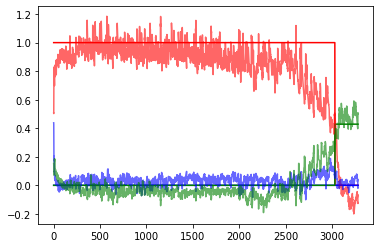

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 1854/3000 [11:55:07<7:52:07, 24.72s/it]

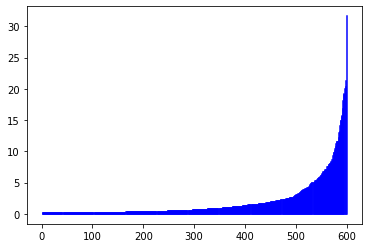

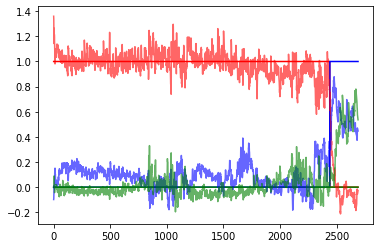

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 1859/3000 [11:56:57<6:57:28, 21.95s/it]

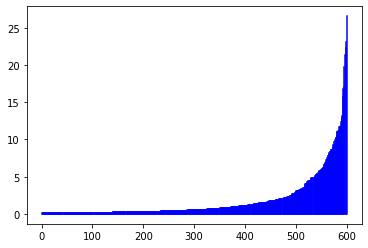

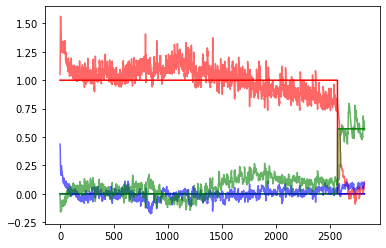

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 1864/3000 [11:58:46<6:45:06, 21.40s/it]

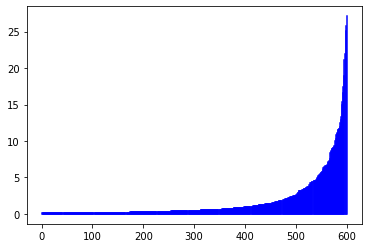

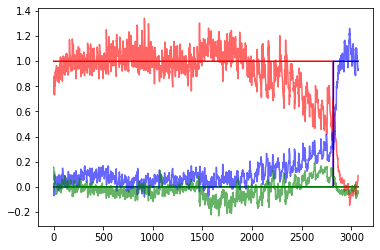

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 1869/3000 [12:00:33<6:28:18, 20.60s/it]

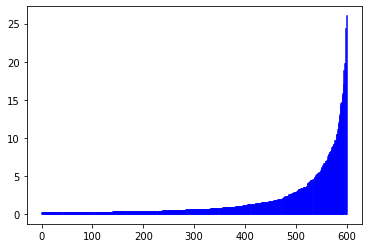

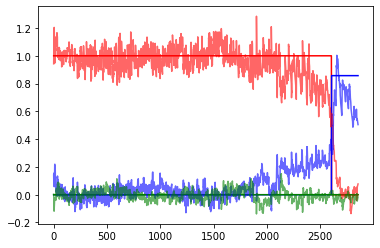

 62%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 1874/3000 [12:02:21<6:34:53, 21.04s/it]

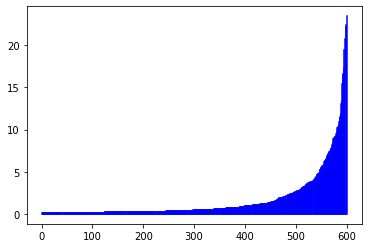

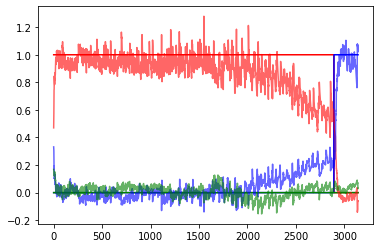

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 1879/3000 [12:04:14<6:48:18, 21.85s/it]

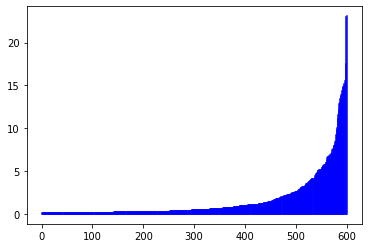

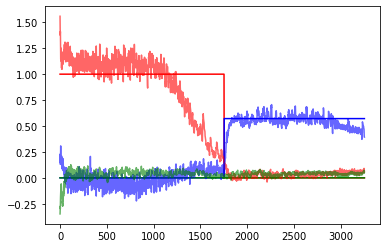

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 1884/3000 [12:06:02<6:32:53, 21.12s/it]

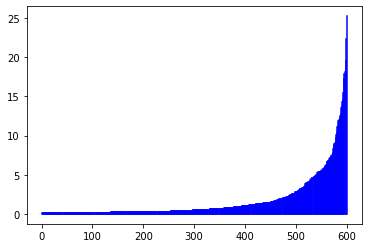

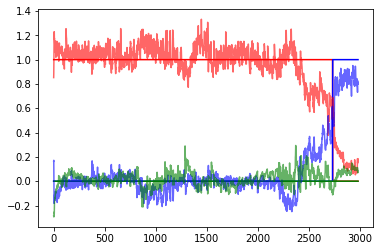

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 1889/3000 [12:07:54<6:39:34, 21.58s/it]

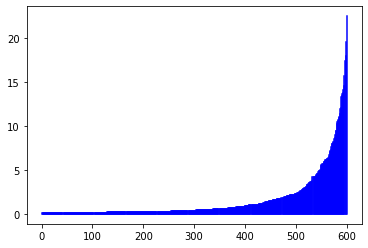

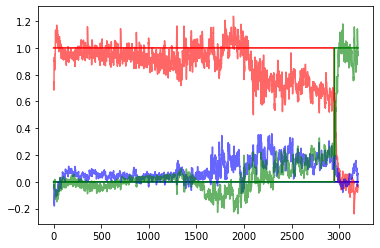

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 1894/3000 [12:09:44<6:32:19, 21.28s/it]

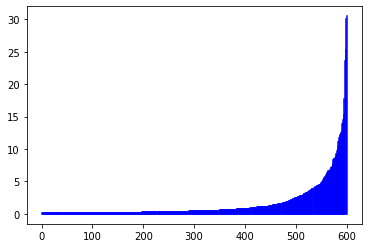

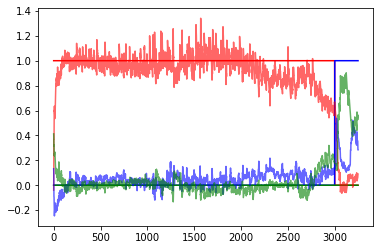

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 1899/3000 [12:11:35<6:33:48, 21.46s/it]

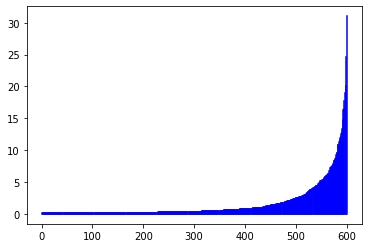

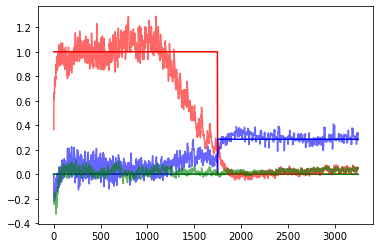

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 1904/3000 [12:14:21<7:49:22, 25.70s/it]

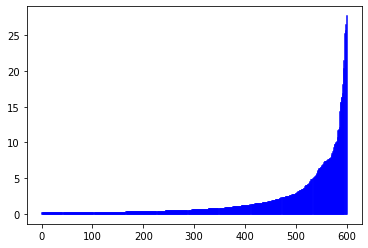

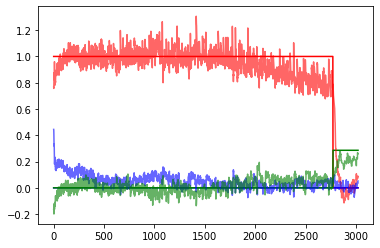

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 1909/3000 [12:16:12<6:44:27, 22.24s/it]

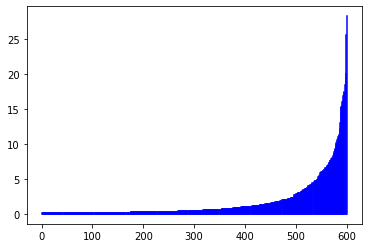

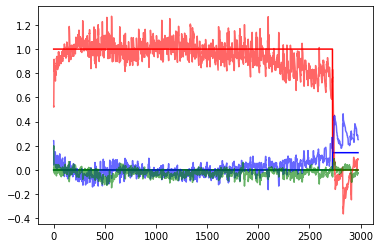

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1914/3000 [12:18:04<6:26:32, 21.36s/it]

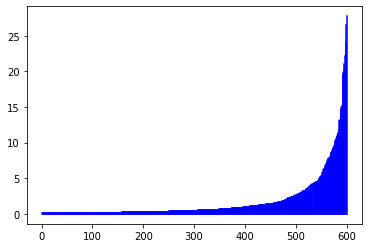

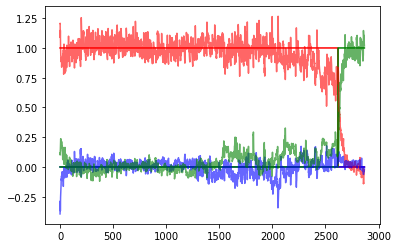

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 1919/3000 [12:19:52<6:14:38, 20.79s/it]

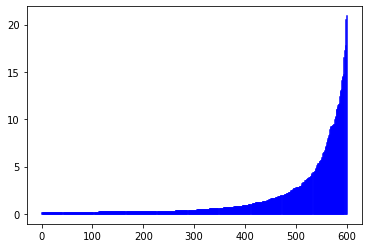

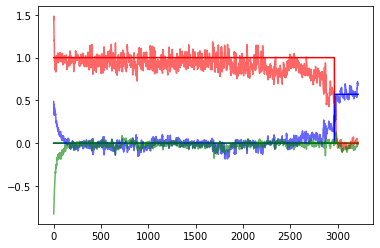

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 1924/3000 [12:21:45<6:31:58, 21.86s/it]

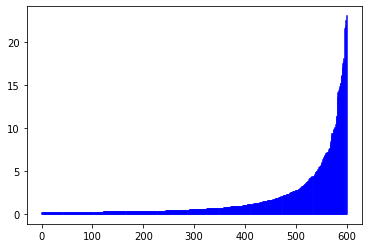

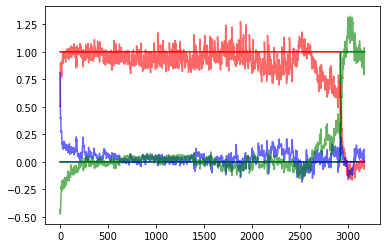

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 1929/3000 [12:23:34<6:17:12, 21.13s/it]

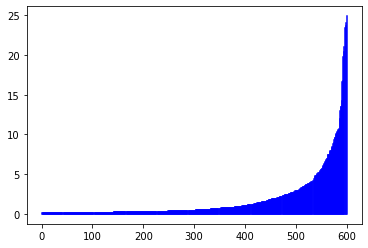

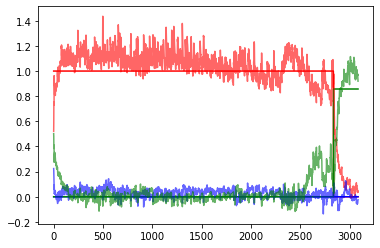

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 1934/3000 [12:25:25<6:19:24, 21.36s/it]

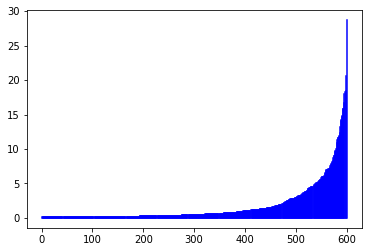

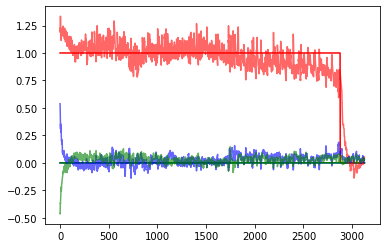

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 1939/3000 [12:27:16<6:16:21, 21.28s/it]

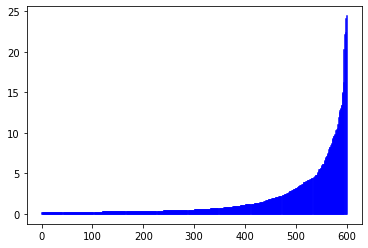

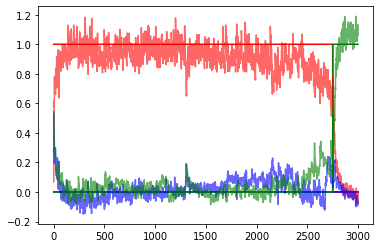

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1944/3000 [12:29:10<6:28:14, 22.06s/it]

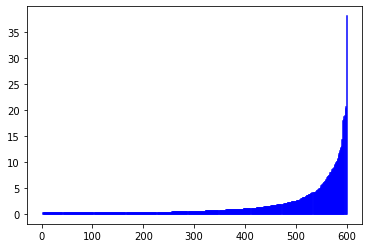

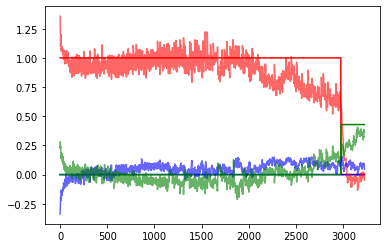

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 1949/3000 [12:31:00<6:12:54, 21.29s/it]

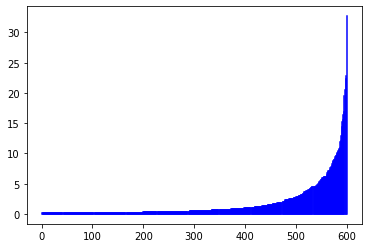

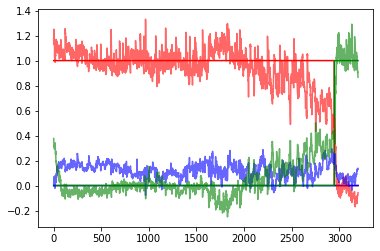

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 1954/3000 [12:33:42<7:17:59, 25.12s/it]

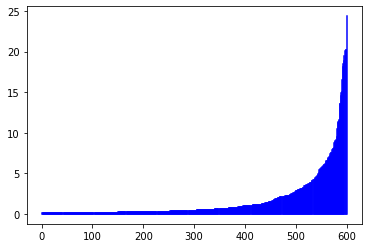

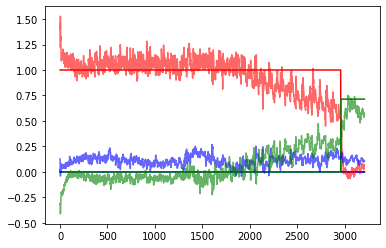

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1959/3000 [12:35:37<6:35:29, 22.79s/it]

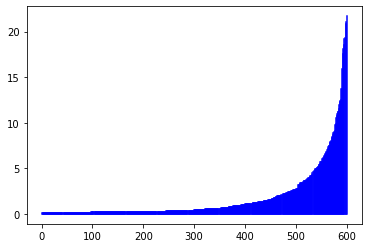

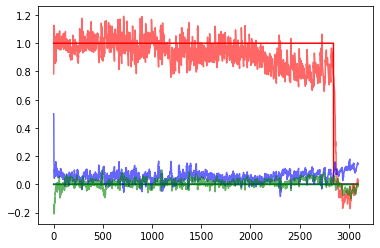

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 1964/3000 [12:37:27<6:15:57, 21.77s/it]

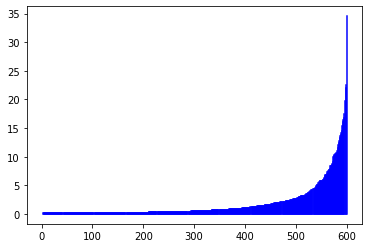

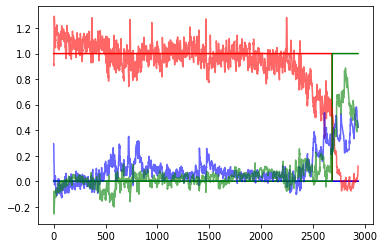

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 1969/3000 [12:39:15<5:56:55, 20.77s/it]

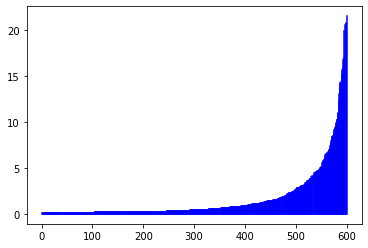

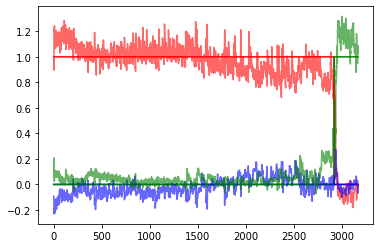

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1974/3000 [12:41:06<6:05:43, 21.39s/it]

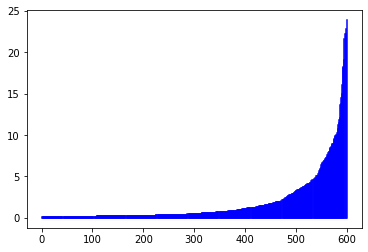

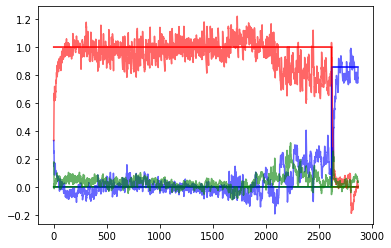

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 1979/3000 [12:42:56<6:05:37, 21.49s/it]

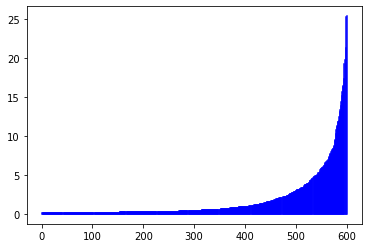

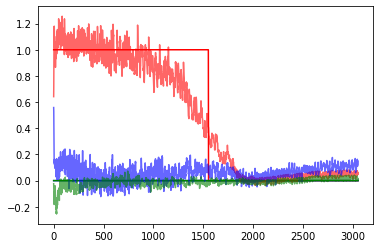

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 1984/3000 [12:44:44<5:53:04, 20.85s/it]

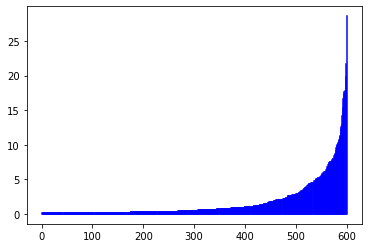

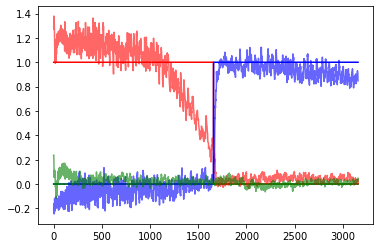

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 1989/3000 [12:46:34<5:51:03, 20.83s/it]

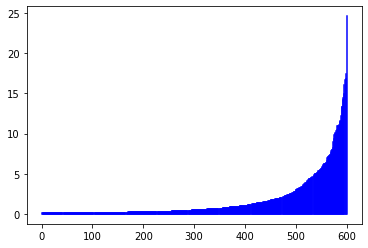

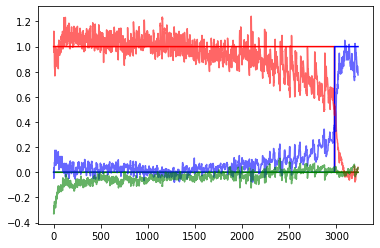

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 1994/3000 [12:48:23<5:48:37, 20.79s/it]

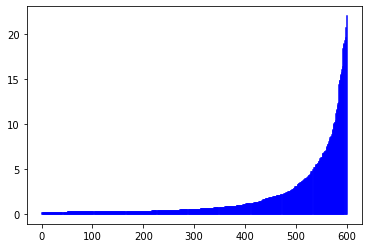

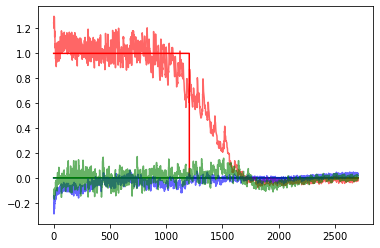

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 1999/3000 [12:50:14<5:54:46, 21.27s/it]

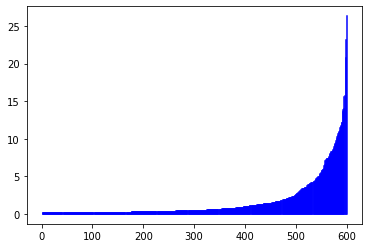

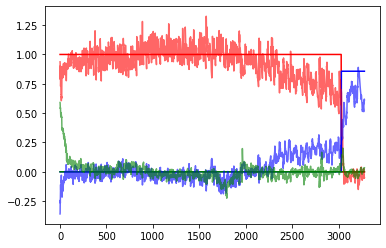

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 2004/3000 [12:52:57<6:49:20, 24.66s/it]

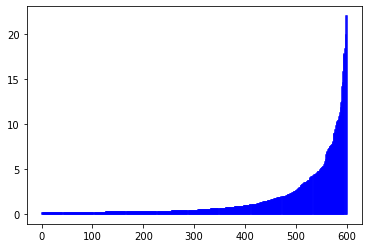

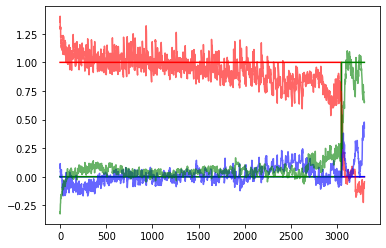

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 2009/3000 [12:54:49<6:04:40, 22.08s/it]

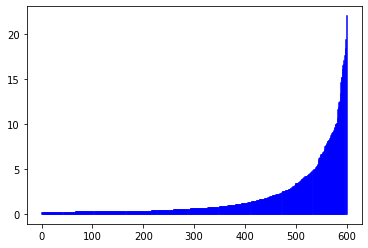

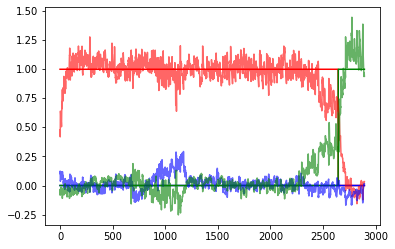

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 2014/3000 [12:56:43<6:04:45, 22.20s/it]

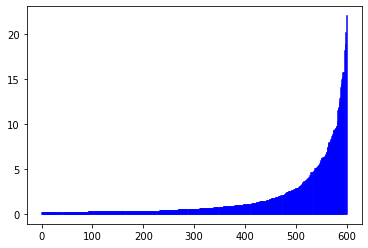

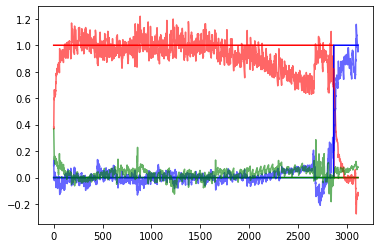

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 2019/3000 [12:58:35<5:54:47, 21.70s/it]

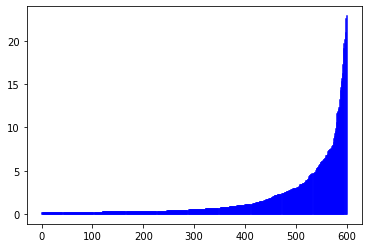

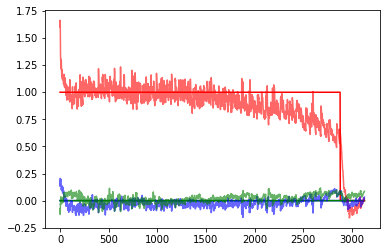

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2024/3000 [13:00:24<5:49:04, 21.46s/it]

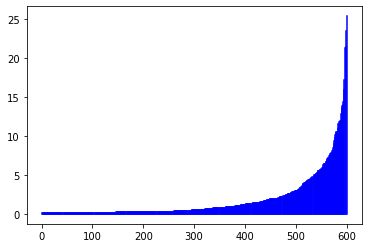

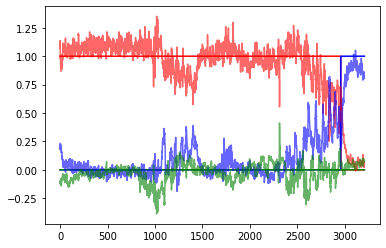

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 2029/3000 [13:02:11<5:37:00, 20.82s/it]

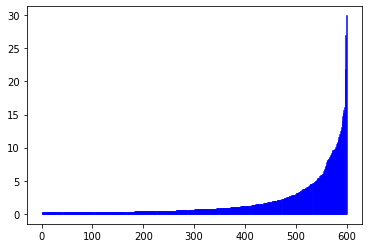

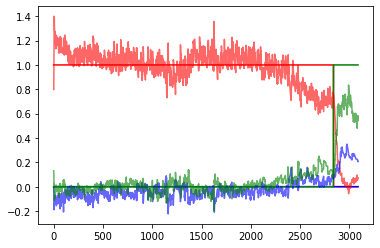

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 2034/3000 [13:03:57<5:26:06, 20.25s/it]

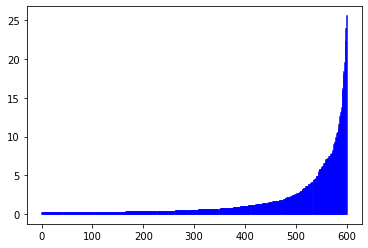

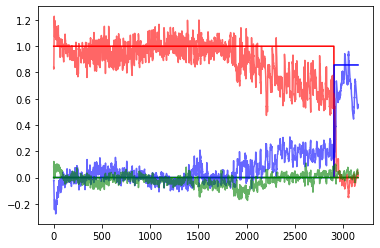

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 2039/3000 [13:05:49<5:43:42, 21.46s/it]

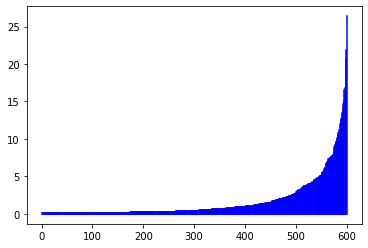

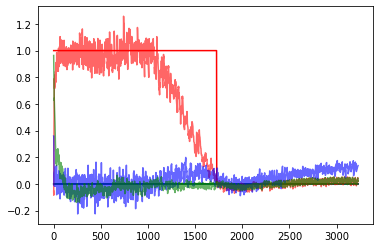

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 2044/3000 [13:07:40<5:42:43, 21.51s/it]

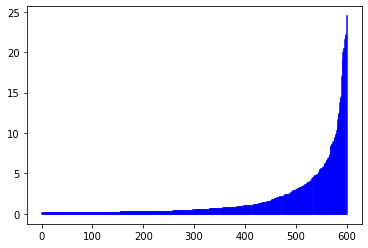

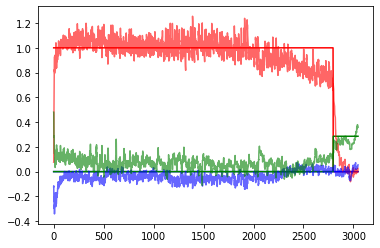

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 2049/3000 [13:09:28<5:30:46, 20.87s/it]

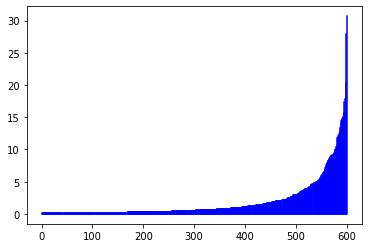

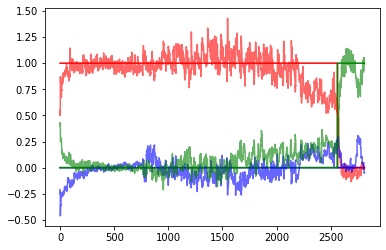

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 2054/3000 [13:12:07<6:26:16, 24.50s/it]

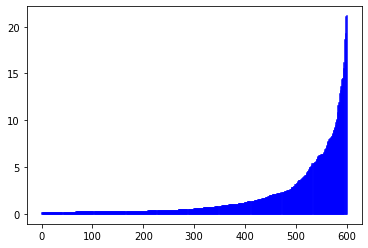

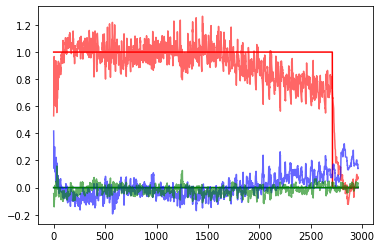

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 2059/3000 [13:13:56<5:43:38, 21.91s/it]

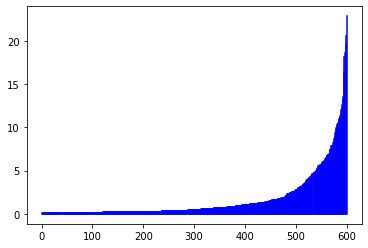

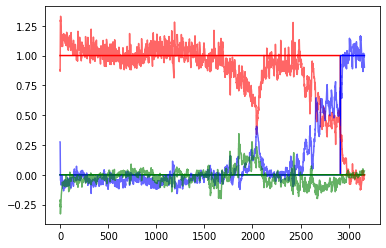

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 2064/3000 [13:15:49<5:38:28, 21.70s/it]

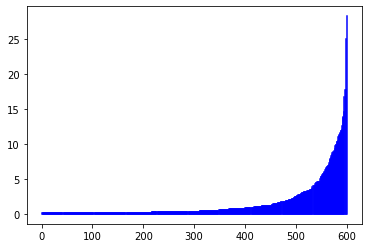

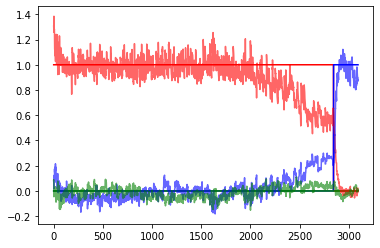

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 2069/3000 [13:17:39<5:32:21, 21.42s/it]

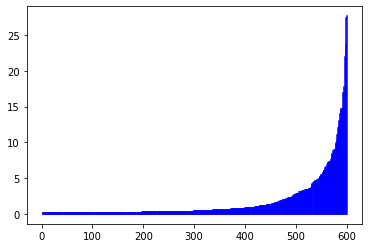

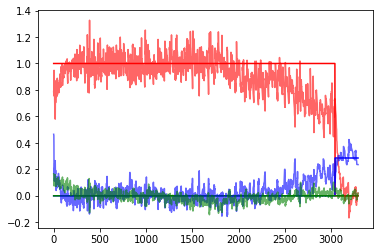

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 2074/3000 [13:19:31<5:29:08, 21.33s/it]

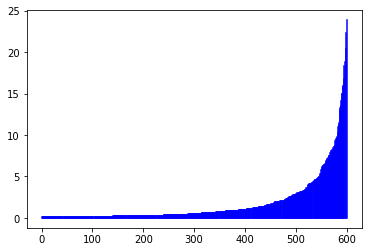

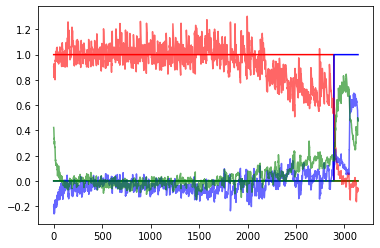

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 2079/3000 [13:21:25<5:38:31, 22.05s/it]

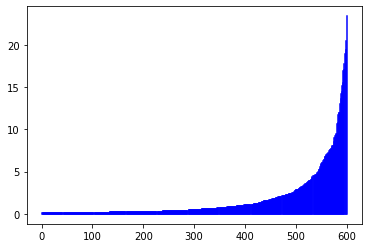

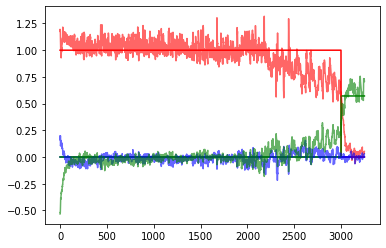

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 2084/3000 [13:23:19<5:38:18, 22.16s/it]

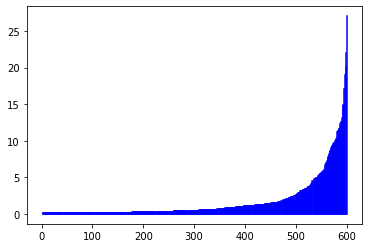

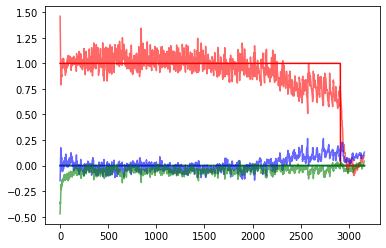

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 2089/3000 [13:25:13<5:36:32, 22.16s/it]

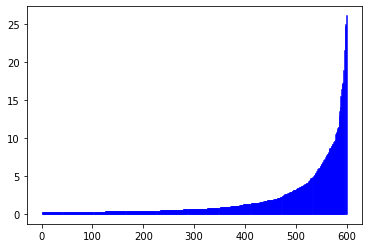

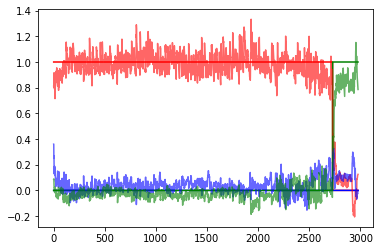

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 2094/3000 [13:27:03<5:20:26, 21.22s/it]

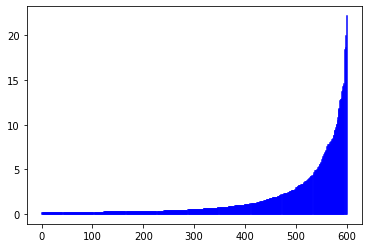

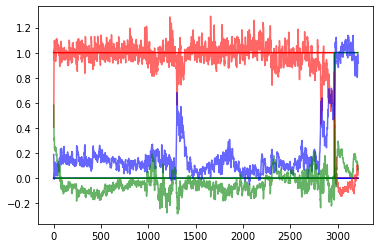

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 2099/3000 [13:28:53<5:23:07, 21.52s/it]

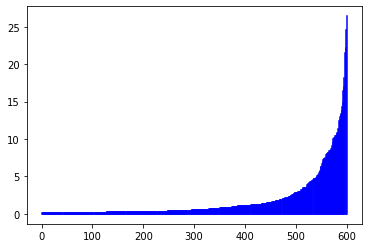

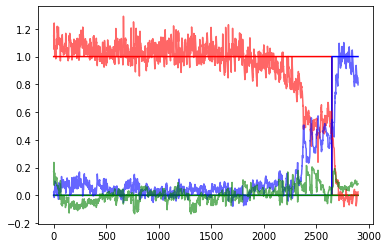

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 2104/3000 [13:31:37<6:25:39, 25.83s/it]

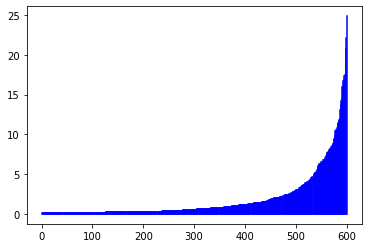

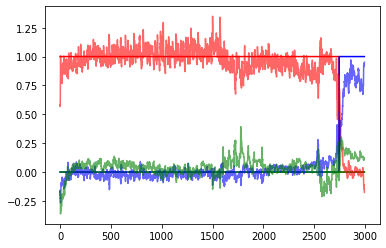

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 2109/3000 [13:33:28<5:29:45, 22.21s/it]

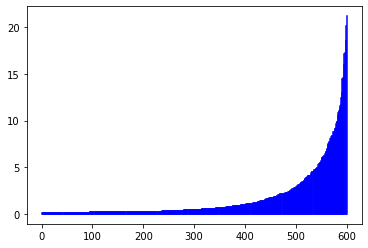

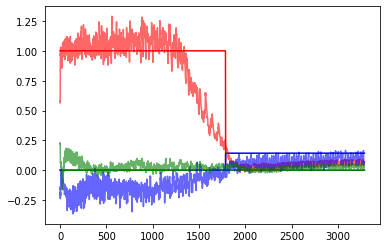

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 2114/3000 [13:35:20<5:18:58, 21.60s/it]

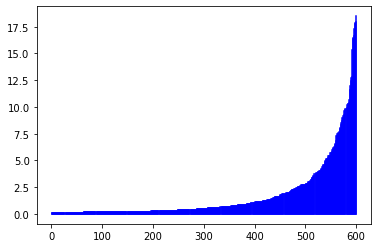

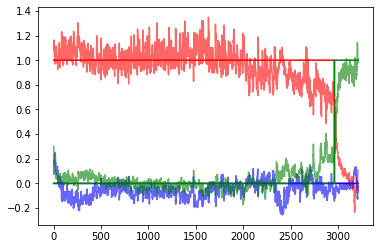

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 2119/3000 [13:37:11<5:13:44, 21.37s/it]

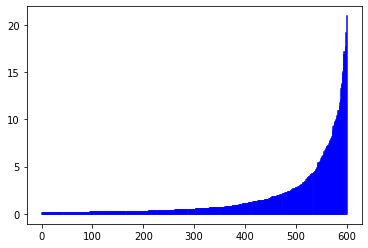

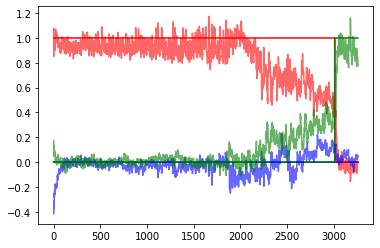

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 2124/3000 [13:39:03<5:15:12, 21.59s/it]

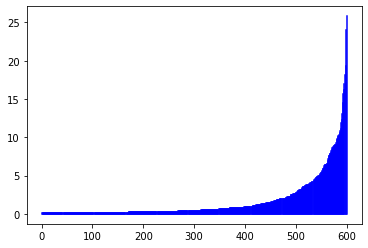

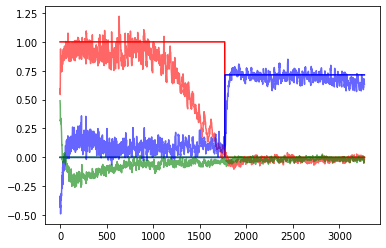

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 2129/3000 [13:40:55<5:16:36, 21.81s/it]

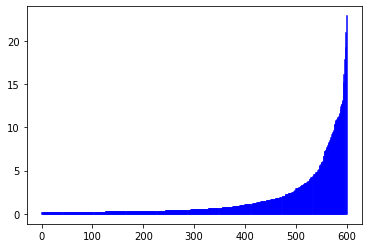

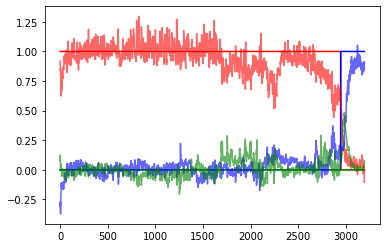

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 2134/3000 [13:42:45<5:09:43, 21.46s/it]

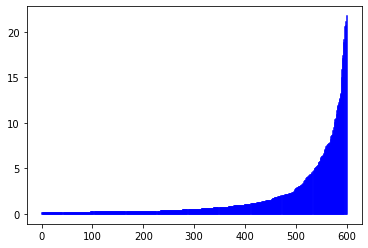

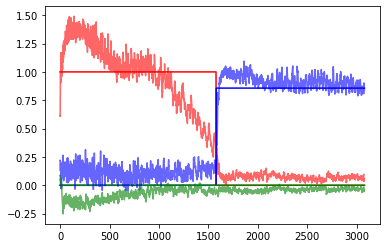

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 2139/3000 [13:44:32<5:04:20, 21.21s/it]

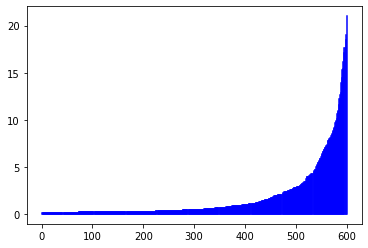

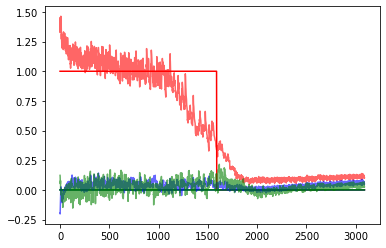

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 2144/3000 [13:46:21<5:03:43, 21.29s/it]

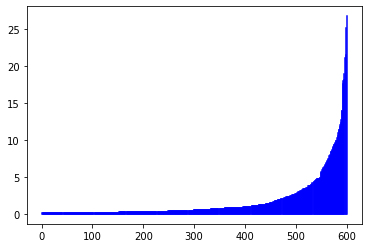

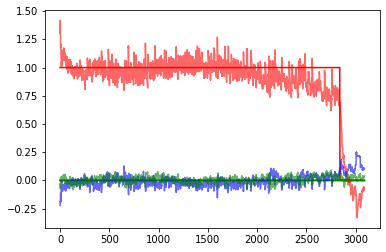

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 2149/3000 [13:48:11<5:00:04, 21.16s/it]

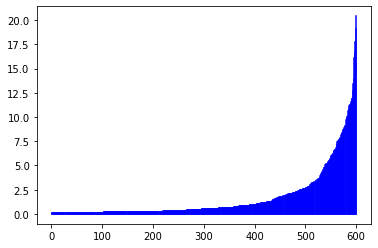

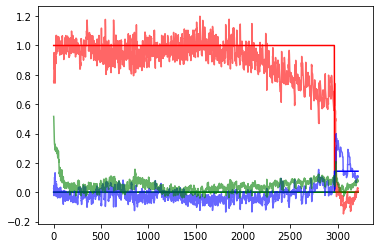

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 2154/3000 [13:50:52<5:53:04, 25.04s/it]

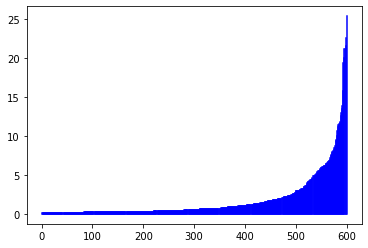

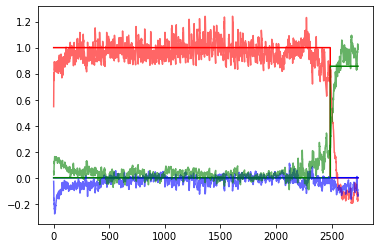

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 2159/3000 [13:52:42<5:05:51, 21.82s/it]

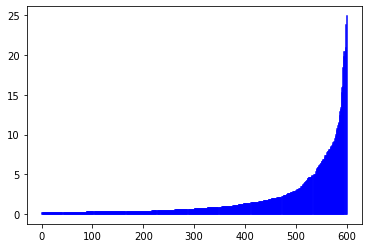

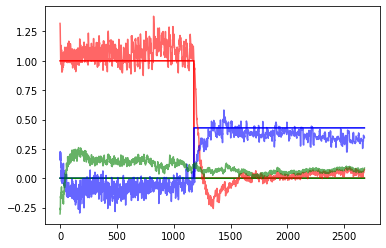

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 2164/3000 [13:54:32<4:57:16, 21.34s/it]

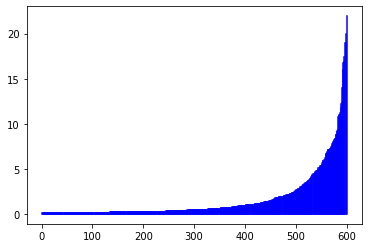

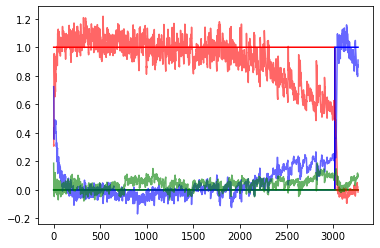

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 2169/3000 [13:56:20<4:51:48, 21.07s/it]

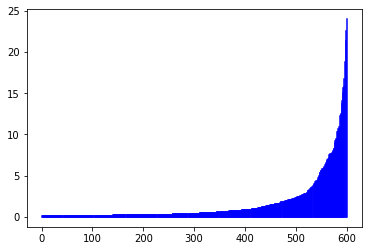

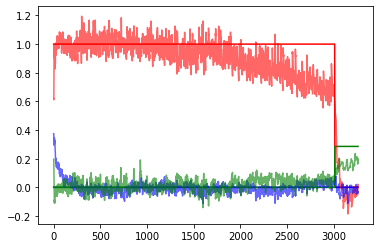

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 2174/3000 [13:58:06<4:42:21, 20.51s/it]

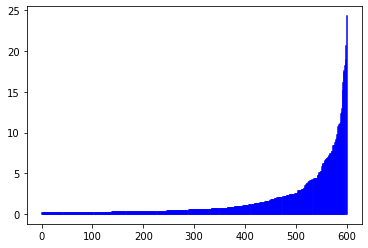

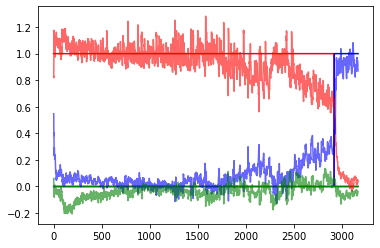

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 2179/3000 [13:59:55<4:49:01, 21.12s/it]

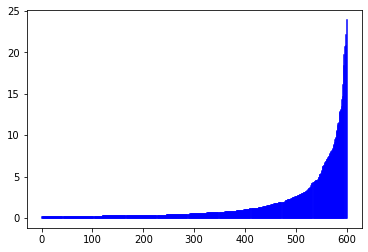

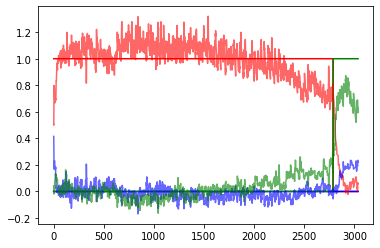

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 2184/3000 [14:01:49<4:59:04, 21.99s/it]

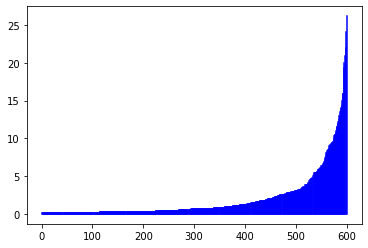

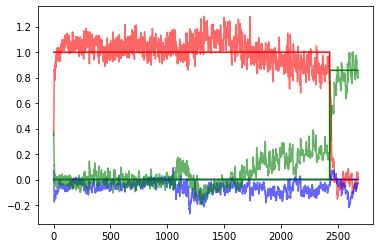

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 2189/3000 [14:03:39<4:46:05, 21.17s/it]

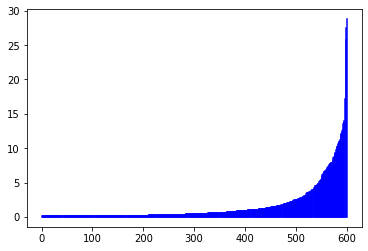

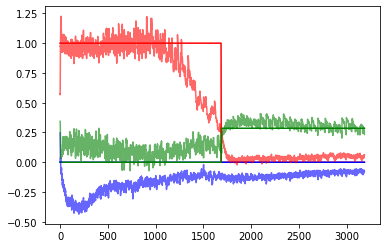

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 2194/3000 [14:05:27<4:40:47, 20.90s/it]

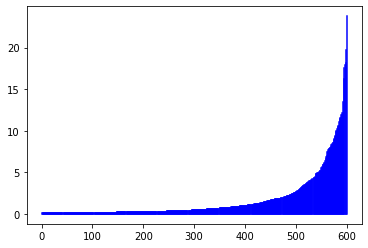

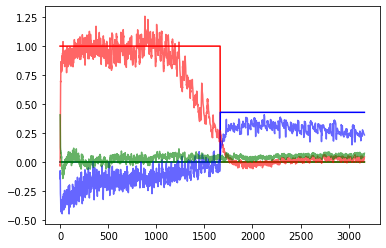

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 2199/3000 [14:07:19<4:47:31, 21.54s/it]

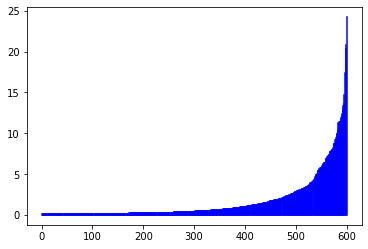

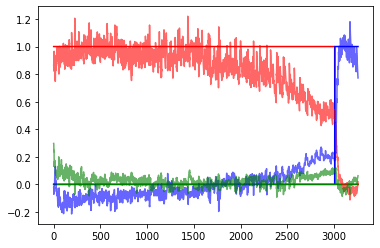

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 2204/3000 [14:09:57<5:29:05, 24.81s/it]

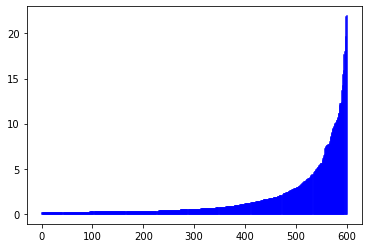

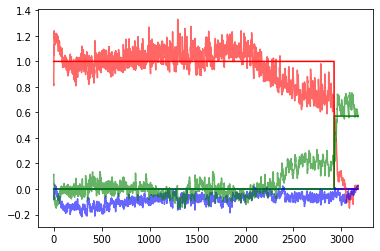

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 2209/3000 [14:11:46<4:46:08, 21.70s/it]

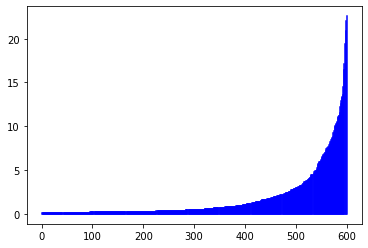

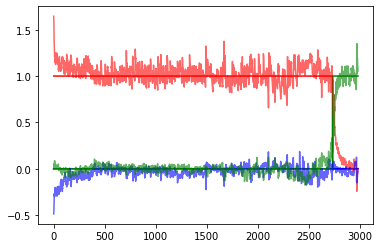

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 2214/3000 [14:13:39<4:44:46, 21.74s/it]

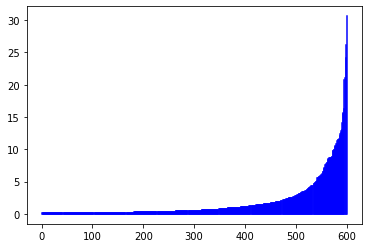

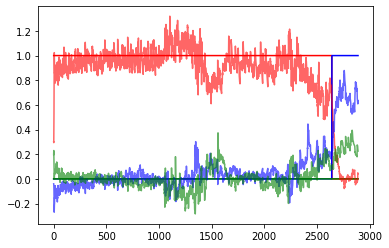

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 2219/3000 [14:15:29<4:37:27, 21.32s/it]

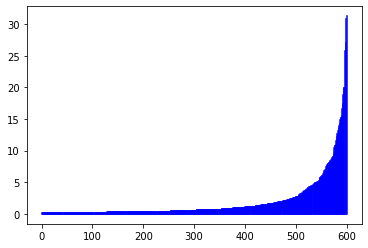

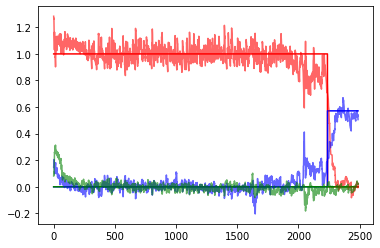

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 2224/3000 [14:17:16<4:30:53, 20.94s/it]

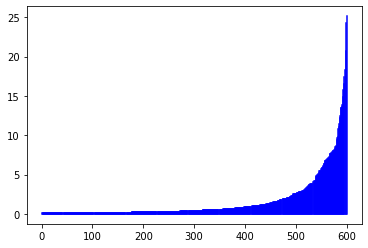

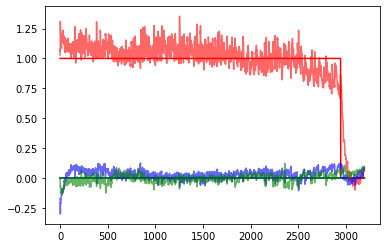

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 2229/3000 [14:19:00<4:18:28, 20.11s/it]

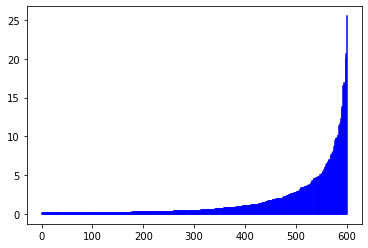

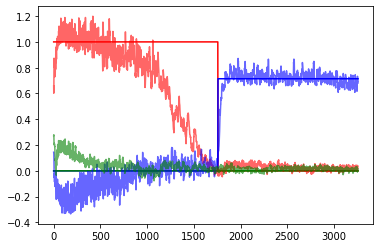

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 2234/3000 [14:20:50<4:25:46, 20.82s/it]

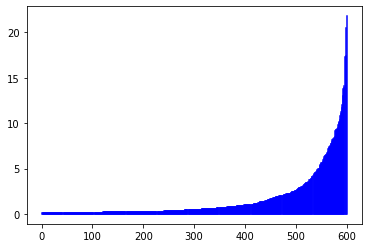

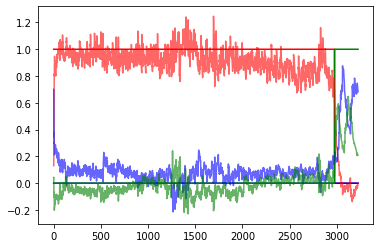

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 2239/3000 [14:22:42<4:30:43, 21.34s/it]

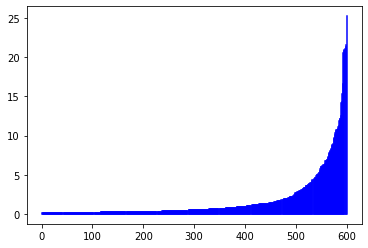

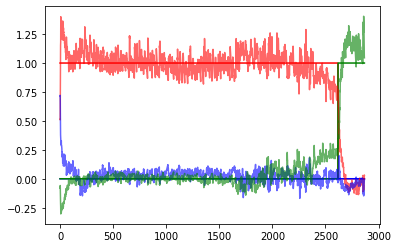

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 2244/3000 [14:24:32<4:27:35, 21.24s/it]

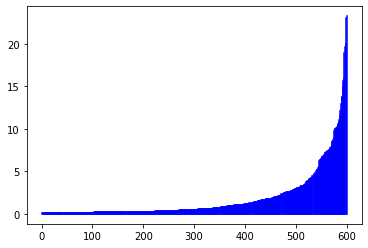

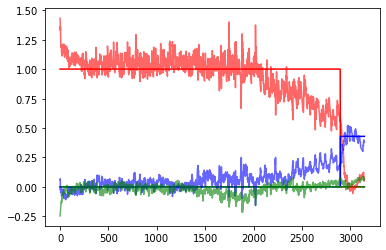

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 2249/3000 [14:26:22<4:23:58, 21.09s/it]

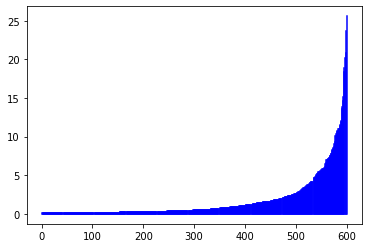

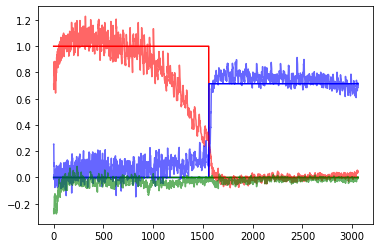

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 2254/3000 [14:29:03<5:07:37, 24.74s/it]

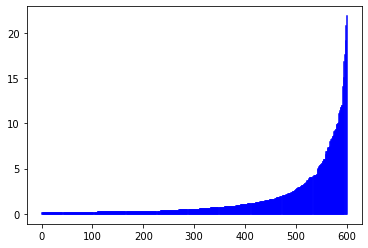

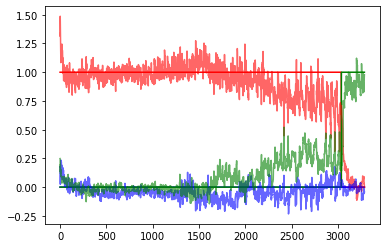

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 2259/3000 [14:30:54<4:29:19, 21.81s/it]

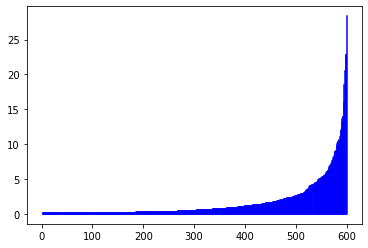

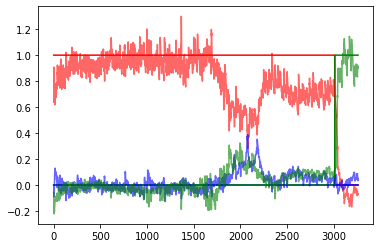

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 2264/3000 [14:32:41<4:16:01, 20.87s/it]

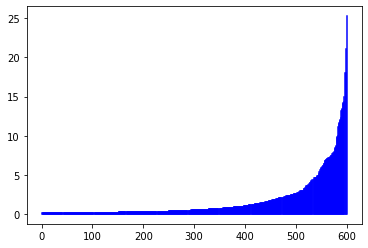

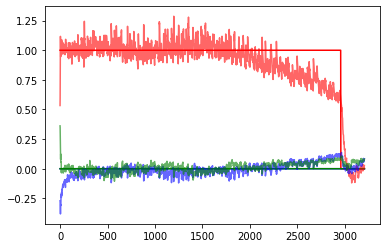

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 2269/3000 [14:34:32<4:20:36, 21.39s/it]

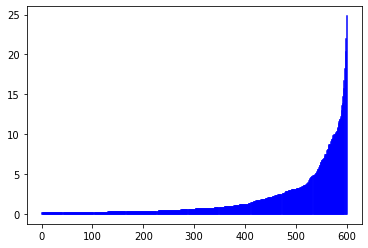

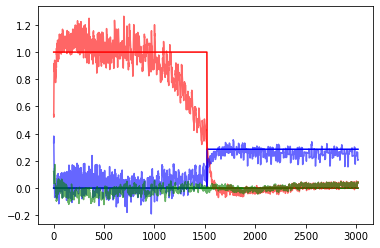

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 2274/3000 [14:36:24<4:19:28, 21.44s/it]

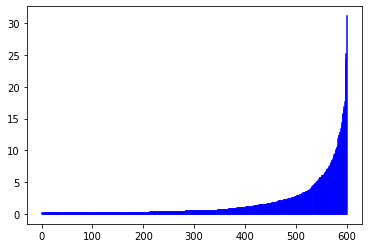

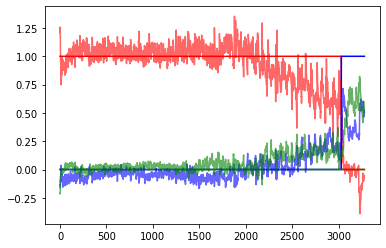

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 2279/3000 [14:38:11<4:04:57, 20.39s/it]

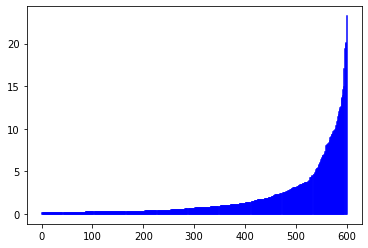

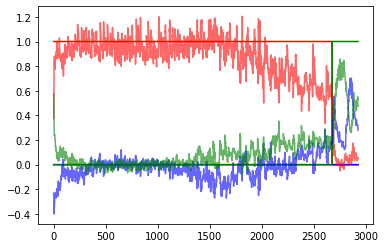

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 2284/3000 [14:40:04<4:18:50, 21.69s/it]

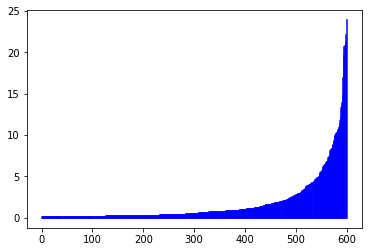

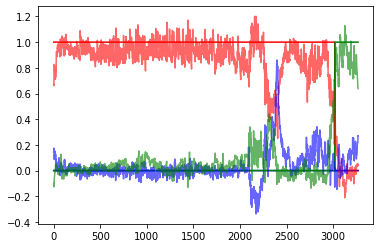

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 2289/3000 [14:41:54<4:12:04, 21.27s/it]

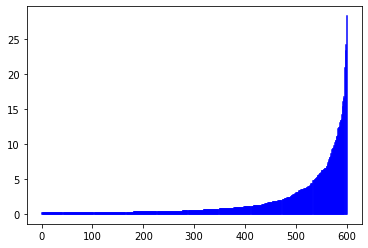

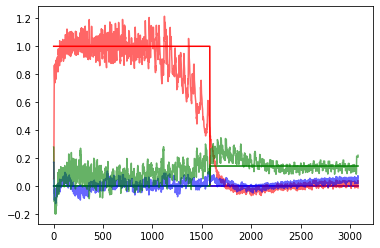

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 2294/3000 [14:43:42<4:07:59, 21.08s/it]

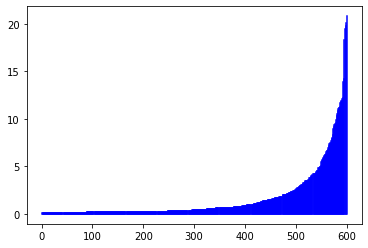

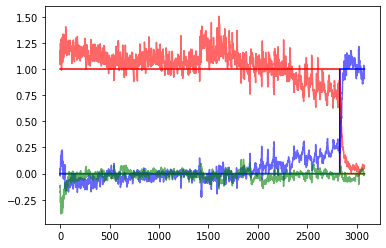

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 2299/3000 [14:45:34<4:08:14, 21.25s/it]

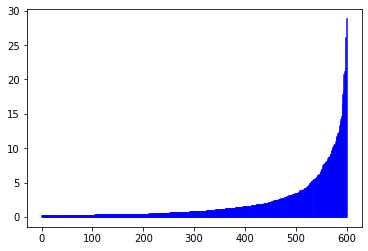

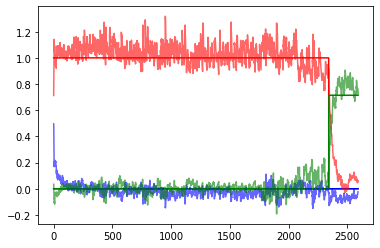

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 2304/3000 [14:48:15<4:46:34, 24.70s/it]

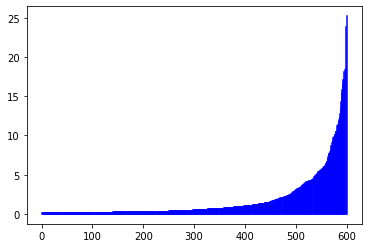

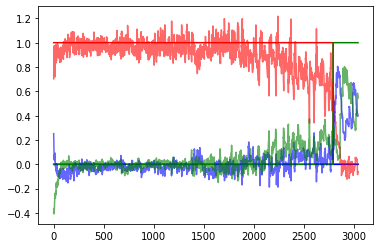

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 2309/3000 [14:50:06<4:10:39, 21.77s/it]

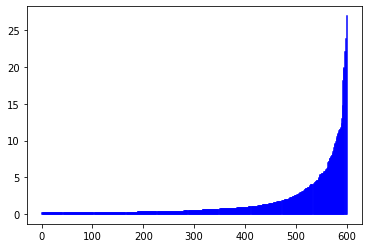

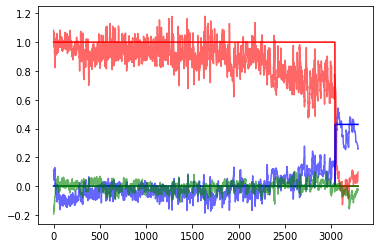

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 2314/3000 [14:51:59<4:07:44, 21.67s/it]

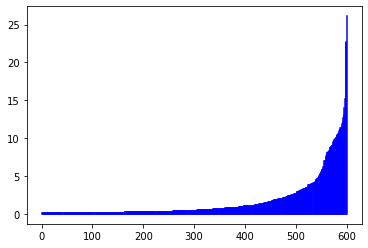

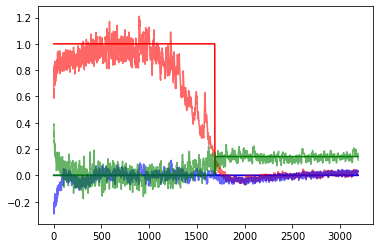

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 2319/3000 [14:53:44<3:50:25, 20.30s/it]

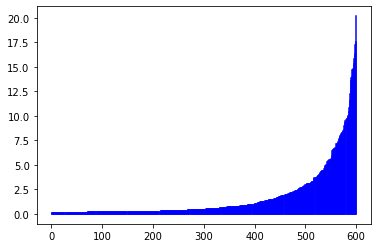

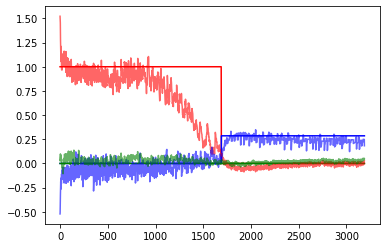

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 2324/3000 [14:55:33<3:57:56, 21.12s/it]

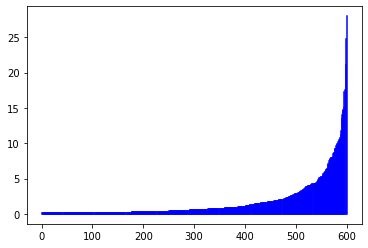

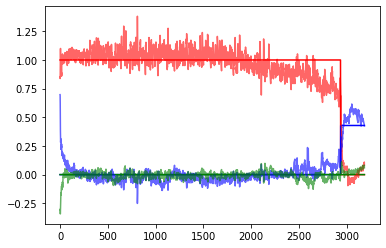

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 2329/3000 [14:57:23<3:54:57, 21.01s/it]

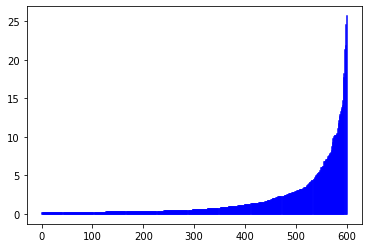

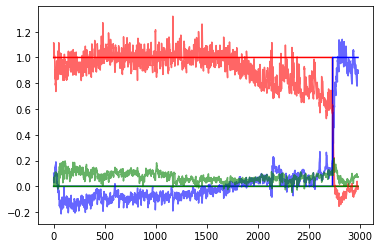

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 2334/3000 [14:59:14<3:59:38, 21.59s/it]

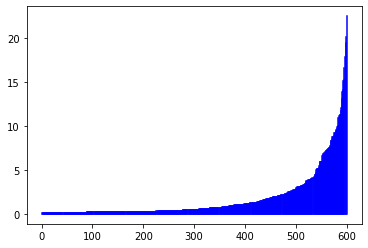

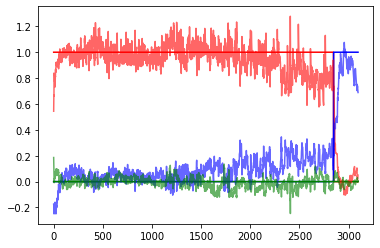

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 2339/3000 [15:01:03<3:55:22, 21.36s/it]

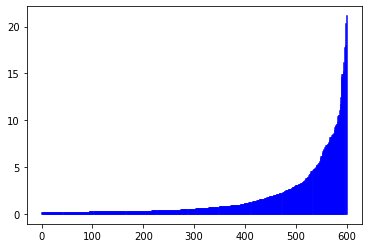

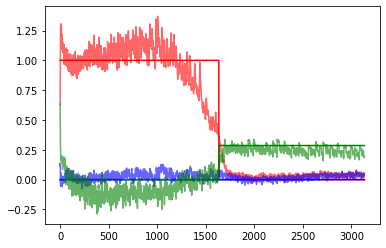

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 2344/3000 [15:02:53<3:52:08, 21.23s/it]

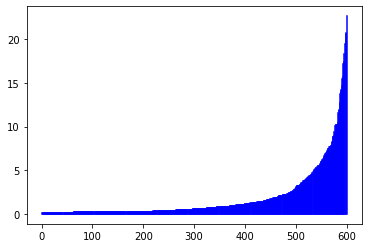

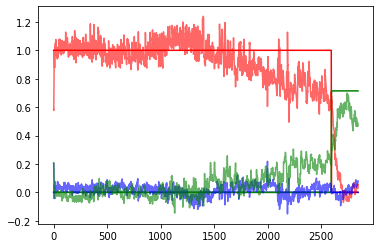

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2349/3000 [15:04:39<3:43:50, 20.63s/it]

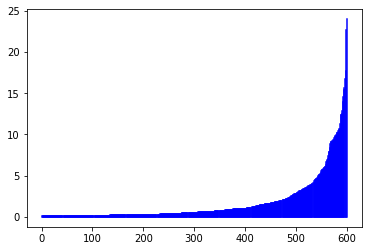

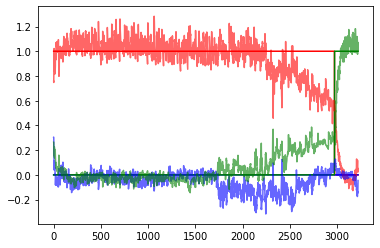

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 2354/3000 [15:07:25<4:37:17, 25.76s/it]

In [ ]:
from cgtasknet.instruments.instrument_accuracy_network import correct_answer
from norse.torch import LIFAdExState
name = f"weights/weights_{neuron_parameters.alpha}_N_{hidden_size}_without_square"
running_loss = 0
sigma = 0

for i in tqdm(range(number_of_epochs)):
    if i == 500:
        sigma = 0.2
    if i == 1000:
        sigma = 0.5
    inputs, target_outputs = Task.dataset(number_of_tasks)

    inputs[:, :, 1:3] += every_bath_generator(
        0, sigma, inputs.shape[0], inputs.shape[1], 2
    )
    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    loss_mask = torch.zeros_like(target_outputs)
    mask_indexes_signes = torch.where(target_outputs[:, :, 0] == 1)
    mask_indexes_zeros = torch.where(target_outputs[:, :, 0] == 0)
    loss_mask[mask_indexes_signes[0], mask_indexes_signes[1], :] = .1
    loss_mask[mask_indexes_zeros[0], mask_indexes_zeros[1], :] = 1
    optimizer.zero_grad()
    init_state = LIFAdExState(
        torch.zeros(batch_size, hidden_size).to(device),
        torch.rand(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
    )
    # forward + backward + optimize
    outputs, _, state = model(
        inputs,
        init_state,
    )

    loss = criterion(outputs, target_outputs, loss_mask, state)
    loss.backward()
    optimizer.step()

    # print statistics
    running_loss = loss.item()
    if i % 50 == 49:
        with open("log_multy.txt", "a") as f:
            f.write("epoch: {:d} loss: {:0.5f}\n".format(i + 1, running_loss / 10))
        running_loss = 0.0
        with torch.no_grad():
            torch.save(
                model.state_dict(),
                name + f'_{i}_',
            )
    if i % 50== 49:

        result = 0
        for j in range(10):
            try:
                del inputs
            except:
                pass
            try:
                del target_outputs
            except:
                pass
            try:
                del outputs
            except:
                pass
            torch.cuda.empty_cache()
            inputs, target_outputs = Task.dataset(1, delay_between=0)
            inputs[:, :, 1:3] += every_bath_generator(
                0, 0.01, inputs.shape[0], inputs.shape[1], 2
            )
            inputs = torch.from_numpy(inputs).type(torch.float).to(device)
            target_outputs = (
                torch.from_numpy(target_outputs).type(torch.float).to(device)
            )
            outputs = model(
                inputs,
                init_state,
            )[0]
            type_tasks = list(
                np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1]
            )
            answers = can.run(
                target_outputs[50:, :, 0].cpu(),
                outputs[50:, :, 0].cpu(),
                target_outputs[50:, :, 1:].cpu(),
                outputs[50:, :, 1:].cpu(),
                type_tasks,
            )
            result += answers

        accuracy = result / batch_size / 10 * 100
        with open("accuracy_multy.txt", "a") as f:
            f.write(f"ecpoch = {i}; correct/all = {accuracy}\n")
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
        del states
    except:
        pass
    if i % 5 == 4:
        check_mean_fr()
    torch.cuda.empty_cache()
print("Finished Training")

In [ ]:
model.save_states = True
sorted_tasks = sorted(tasks)
re_word = "Go"
choices_tasks = []
values_tasks = []
for i in range(len(sorted_tasks)):
    if re_word in sorted_tasks[i]:
        values_tasks.append(i)
    else:
        choices_tasks.append(i)
can = CorrectAnswerNetwork(choices_tasks, values_tasks, 0.15)
inputs, target_outputs = Task.dataset(1, delay_between=0)
inputs[:, :, 1:3] += every_bath_generator(0, 0.01, inputs.shape[0], inputs.shape[1], 2)
inputs = torch.from_numpy(inputs).type(torch.float).to(device)
target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
outputs, states = model(
    inputs,
    init_state,
    additional_current=additional_current_generate(
        len(inputs),
        batch_size,
        hidden_size,
    ).to(device),
)
type_tasks = list(np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1])
answers = can.run(
    target_outputs[:, :, 0].cpu(),
    outputs[:, :, 0].cpu(),
    target_outputs[:, :, 1:].cpu(),
    outputs[:, :, 1:].cpu(),
    type_tasks,
)
result += answers

In [ ]:
inputs, target_outputs = Task.dataset(1, delay_between=0)
inputs = torch.from_numpy(inputs).type(torch.float).to(device)# * 0
target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
init_state = LIFAdExState(
        torch.zeros(batch_size, hidden_size).to(device),
        torch.rand(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
    )
outputs, states, _ = model(
    inputs,
    init_state,
        
    )
task_number = sorted_tasks.index('RomoTask1')

outputs = outputs.cpu().detach()
target_outputs = target_outputs.detach().cpu()
s = []
for i in range(len(states)):
    s.append(states[i].z)
s = torch.stack(s).detach().cpu()

plt.plot(target_outputs[:, task_number, 0].cpu())
plt.plot(outputs[:, task_number, 0].detach().cpu())
plt.show()
plt.close()
plt.plot(target_outputs[:, task_number, 1].cpu())
plt.plot(outputs[:, task_number, 1].detach().cpu())
plt.show()
plt.close()
plt.plot(target_outputs[:, task_number, 2].cpu())
plt.plot(outputs[:, task_number, 2].detach().cpu())
plt.show()
plt.close()
plt.figure(figsize=(20, 10))
plt.imshow(s[:, task_number, :].T, aspect="auto", interpolation="nearest")

In [ ]:
for_sort = torch.sort(torch.mean(torch.mean(s, axis=0), axis=0), dim=0
).indices
s_new = torch.zeros_like(s)
for i in range(hidden_size):
    s_new[:, :, i] = s[:, :, for_sort[i]]
plt.imshow(s_new[:, task_number, :].T, aspect="auto", interpolation="nearest", origin='lower',)

In [ ]:
# spike_sequence = torch.stack(spike_sequence)
freq_sequence = torch.mean(torch.mean(spike_sequence, axis=0), axis=0)

# freq_sequence = sort_elemnts_by_another (freq_sequence, freq_sequence)
print(f"{spike_sequence.shape=}")
print(f"{freq_sequence.shape=}")
for i in range(len(freq_sequence)):
    plt.plot([i + 1] * 2, [0, freq_sequence[i]], c="b")
plt.show()
plt.close()
model.save_states = False

In [ ]:
from cgtasknet.instruments.instrument_subgroups import sort_elemnts_by_another

frequency = torch.mean(torch.mean(s, axis=0), axis=0) * 1e3
frequency = sort_elemnts_by_another(freq_sequence, frequency)
for i in range(len(frequency)):
    plt.plot([i + 1] * 2, [0, frequency[i]], c="b")

In [ ]:
result

In [ ]:
list(np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1])

# Тестовая функция

In [ ]:
def test_network(
        test_sigma: float, number_of_trials: int = 100, plot_data: bool = True
):
    result = 0
    for j in tqdm(range(number_of_trials)):
        try:
            del inputs
        except:
            pass
        try:
            del target_outputs
        except:
            pass
        try:
            del outputs
        except:
            pass
        torch.cuda.empty_cache()
        inputs, target_outputs = Task.dataset(1, delay_between=0)
        inputs[:, :, :3] += every_bath_generator(
            0, test_sigma, inputs.shape[0], inputs.shape[1], 3
        )
        inputs = torch.from_numpy(inputs).type(torch.float).to(device)
        target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
        outputs = model(inputs)[0]
        answers = correct_answer(
            outputs[:, :, 1:], target_outputs[:, :, 1:], target_outputs[:, :, 0]
        )
        result += torch.sum(answers).item()

    accuracy = result / batch_size / number_of_trials * 100
    if plot_data:
        plot_results(inputs, target_outputs, outputs)
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
    except:
        pass
    torch.cuda.empty_cache()
    return accuracy

# Тестирование
```  np.random.normal(0, 0.01, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.01, 1)
print(accuracy)

# Тестирование
```  np.random.normal(0, 0.05, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.05, 10)
print(accuracy)

# Тестирование
```  np.random.normal(0, 0.1, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.1)
print(accuracy)

# Тестирование
```  np.random.normal(0, 0.5, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.5)
print(accuracy)

In [ ]:
result = 0
for j in tqdm(range(1)):
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
    except:
        pass
    torch.cuda.empty_cache()
    inputs, target_outputs = Task.dataset(1, delay_between=0)
    inputs[:, :, :3] += np.random.normal(0, 0.5, size=inputs[:, :, :3].shape)
    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    outputs = model(inputs)[0]
    answers = correct_answer(
        outputs[:, :, 1:], target_outputs[:, :, 1:], target_outputs[:, :, 0]
    )
    result += torch.sum(answers).item()

accuracy = result / batch_size / 100 * 100
print(accuracy)
plot_results(inputs, target_outputs, outputs)
try:
    del inputs
except:
    pass
try:
    del target_outputs
except:
    pass
try:
    del outputs
except:
    pass
torch.cuda.empty_cache()

In [ ]:
result = 0
for j in tqdm(range(1)):
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
    except:
        pass
    torch.cuda.empty_cache()
    inputs, target_outputs = Task.dataset(1, delay_between=0)
    inputs[:, :, :3] += np.random.normal(0, 0.7, size=inputs[:, :, :3].shape)
    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    outputs = model(inputs)[0]
    answers = correct_answer(
        outputs[:, :, 1:], target_outputs[:, :, 1:], target_outputs[:, :, 0]
    )
    result += torch.sum(answers).item()

accuracy = result / batch_size / 100 * 100
print(accuracy)
plot_results(inputs, target_outputs, outputs)
try:
    del inputs
except:
    pass
try:
    del target_outputs
except:
    pass
try:
    del outputs
except:
    pass
torch.cuda.empty_cache()

In [ ]:
inputs = 0
outputs = 0

In [ ]:
lines = []
with open("accuracy_multy.txt", "r") as f:
    while line := f.readline():
        lines.append(float(line.split("=")[2]))

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot([*range(9, 3000, 50)], lines, ".", linestyle="--", markersize=5)
plt.ylabel(r"Accuracy%")
plt.xlabel(r"Epochs")

In [ ]:
start_sigma = 0
stop_sigma = 2
step_sigma = 0.05
sigma_array = np.arange(start_sigma, stop_sigma, step_sigma)
for test_sigma in tqdm(sigma_array):
    result = 0
    for j in range(20):
        try:
            del inputs
        except:
            pass
        try:
            del target_outputs
        except:
            pass
        try:
            del outputs
        except:
            pass
        torch.cuda.empty_cache()
        inputs, target_outputs = Task.dataset(1, delay_between=0)
        inputs[:, :, 1:3] += np.random.normal(
            0, test_sigma, size=inputs[:, :, 1:3].shape
        )
        inputs = torch.from_numpy(inputs).type(torch.float).to(device)
        target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
        outputs = model(inputs)[0]
        type_tasks = list(np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1])
        answers = can.run(
            target_outputs[50:, :, 0].cpu(),
            outputs[50:, :, 0].cpu(),
            target_outputs[50:, :, 1:].cpu(),
            outputs[50:, :, 1:].cpu(),
            type_tasks,
        )
        result += answers
    accuracy = result / batch_size / 20 * 100
    with open("accuracy_vs_noise.txt", "a") as f:
        f.write(f"noise={test_sigma}:accuracy={accuracy}\n")

In [ ]:
import matplotlib.patches as patches

plt.style.use("ggplot")


def parser(line_text: str) -> tuple:
    """
    Function parses text in form:
    ```v_name_1=v1:v_name_2:v2```
    and return (v1, v2)
    :param line_text:
    :return: (v1, v2)
    """
    line_text = line_text.split(":")
    print(line_text)
    v1 = line_text[0].split("=")[1]
    v2 = line_text[1].split("=")[1]
    return float(v1), float(v2)


x, y = [], []
# with open('accuracy_vs_noise.txt', 'r') as f:
with open(
        r"accuracy_vs_noise.txt",
        "r",
) as f:
    while line := f.readline():
        t_x, t_y = parser(line)
        x.append(t_x)
        y.append(t_y)

fig, ax = plt.subplots()
ax.plot(x, y, ".", linestyle="--")
# ax.plot([.5]*2, [50, 100])
ax.set_ylabel("Accuracy,%")
ax.set_xlabel(r"$\sigma$")
ax.add_patch(
    patches.Rectangle(
        (0, 50), 0.5, 50, edgecolor="grey", facecolor="grey", alpha=0.5, fill=True
    )
)

plt.show()
plt.close()

In [ ]:
batch_size = 1
number_of_tasks = 1
romo_parameters = RomoTaskRandomModParameters(
    romo=RomoTaskParameters(
        delay=0.6,
        positive_shift_delay_time=0.0,
        trial_time=0.1,
        positive_shift_trial_time=0.2,
    ),
)
dm_parameters = DMTaskRandomModParameters(
    dm=DMTaskParameters(trial_time=0.6, positive_shift_trial_time=0.0)
)
ctx_parameters = CtxDMTaskParameters(dm=dm_parameters.dm)
go_parameters = GoTaskRandomModParameters(
    go=GoTaskParameters(
        trial_time=0.1,
        positive_shift_trial_time=0.8,
    )
)
gort_parameters = GoRtTaskRandomModParameters(
    go=GoRtTaskParameters(
        trial_time=0.1,
        positive_shift_trial_time=0.8,
    )
)
godl_parameters = GoDlTaskRandomModParameters(
    go_dl=GoDlTaskParameters(
        go=GoTaskParameters(trial_time=0.1, positive_shift_trial_time=0.2),
        delay=0.1,
        positive_shift_delay_time=1.4,
    )
)
sigma = 0.5
tasks = [
    "RomoTask1",
    "RomoTask2",
    "DMTask1",
    "DMTask2",
    "CtxDMTask1",
    "CtxDMTask2",
    "GoTask1",
    "GoTask2",
    "GoRtTask1",
    "GoRtTask2",
    "GoDlTask1",
    "GoDlTask2",
]
task_dict = {
    tasks[0]: romo_parameters,
    tasks[1]: romo_parameters,
    tasks[2]: dm_parameters,
    tasks[3]: dm_parameters,
    tasks[4]: ctx_parameters,
    tasks[5]: ctx_parameters,
    tasks[6]: go_parameters,
    tasks[7]: go_parameters,
    tasks[8]: gort_parameters,
    tasks[9]: gort_parameters,
    tasks[10]: godl_parameters,
    tasks[11]: godl_parameters,
}

tasks_sequence = [
    MultyReduceTasks(
        tasks=task_dict,
        batch_size=batch_size,
        delay_between=0,
        enable_fixation_delay=True,
        task_number=i,
    )
    for i in range(len(tasks))
]

In [ ]:
tasks_and_names = dict([*zip(sorted(tasks), tasks_sequence)])
chosed_tasks = ["CtxDMTask1", "GoTask1", "GoRtTask1", "GoDlTask1", "RomoTask1"]
chosed_tasks_dict = {}
for key, item in tasks_and_names.items():
    if key in chosed_tasks:
        chosed_tasks_dict[key] = item
print("Tasks for PCA")
print(chosed_tasks_dict)

In [ ]:
import matplotlib.pyplot as plt
from cgtasknet.instruments.instrument_accuracy_network import correct_answer
from cgtasknet.net.states import LIFAdExInitState

name = f"Train_dm_and_romo_task_reduce_lif_adex_without_refrac_random_delay_long_a_alpha_{neuron_parameters.alpha}_N_{hidden_size}"
init_state = LIFAdExInitState(batch_size, hidden_size, device=device)
data, t_outputs = tasks_and_names["DMTask1"].dataset(2, delay_between=0)
data[:, :, 1:3] += every_bath_generator(0, sigma, data.shape[0], data.shape[1], 2)
data = torch.from_numpy(data).type(torch.float).to(device)
out, states = model(data, init_state.random_state())
out = out.detach().cpu().numpy()
plt.figure()
plt.plot(t_outputs[:, 0, 0])
plt.plot(t_outputs[:, 0, 1])
plt.plot(t_outputs[:, 0, 2])

plt.figure()
plt.plot(out[:, 0, 0])
plt.plot(out[:, 0, 1])
plt.plot(out[:, 0, 2])

In [ ]:

for name, param in model.named_parameters():
    if name == 'alif.recurrent_weights':
        final_parameters = torch.clone(param.detach().cpu())


In [ ]:
eigs_final = torch.eig(final_parameters)[0]
eigs_initial = torch.eig(initial_parameters)[0]

In [ ]:
x_final = eigs_final[:, 0]
y_final = eigs_final[:, 1]

x_initial = eigs_initial[:, 0]
y_initial = eigs_initial[:, 1]

In [ ]:
plt.scatter(x_initial, y_initial)
plt.scatter(x_final, y_final)

In [ ]:
Task_test = MultyReduceTasks(
    tasks=task_dict,
    batch_size=batch_size,
    delay_between=0,
    enable_fixation_delay=True,
    mode="random",
    task_number=0
)

In [ ]:
model.save_states = True
init_state = LIFAdExState(
        torch.zeros(batch_size, hidden_size).to(device),
        torch.rand(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
    )
inputs, target_outputs = Task.dataset(2)#Task_test.dataset(1)

inputs = torch.from_numpy(inputs).type(torch.float).to(device)
target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
result = model(inputs, init_state,)
#del inputs, init_state
torch.cuda.empty_cache()
states = result[-1]
spikes = []
for state in states:
    spikes.append(state.detach().cpu())
    
s = torch.stack(spikes)
freq_sequence_new = torch.sort(
    torch.mean(torch.mean(s, axis=0), axis=0), dim=0
).values
for i in range(len(freq_sequence_new)):
    plt.plot([i + 1] * 2, [0, freq_sequence_new[i] * 1e3], c="b")

In [ ]:
freq_sequence_new[105] * 1e3

In [ ]:
last_fix = torch.where(inputs[:, :, 0] == 1)[0][-1].item()
s = torch.stack(spikes)[:last_fix, ...]
freq_sequence_new = torch.sort(
    torch.mean(torch.mean(s, axis=0), axis=0), dim=0
).values
for i in range(len(freq_sequence_new)):
    plt.plot([i + 1] * 2, [0, freq_sequence_new[i] * 1e3], c="b")

In [ ]:
index=10
plt.plot(target_outputs[:, index, 0].detach().cpu(), c='r')
plt.plot(target_outputs[:, index, 1].detach().cpu(), c='b')
plt.plot(target_outputs[:, index, 2].detach().cpu(), c='g')

plt.plot(result[0][:, index, 0].detach().cpu(), c='r', alpha=.6
        )
plt.plot(result[0][:, index, 1].detach().cpu(), c='b', alpha=.6
        )
plt.plot(result[0][:, index, 2].detach().cpu(), c='g', alpha=.6
        )


plt.plot(inputs[:, index, 0].detach().cpu() + 1.5)

plt.plot(inputs[:, index, 1].detach().cpu() + 1.5)
plt.plot(inputs[:, index, 2].detach().cpu() + 1.5)
plt.yticks([])

In [ ]:
plt.plot(torch.sort(torch.mean(final_parameters, axis=1)).values)
plt.plot(torch.sort(torch.mean(initial_parameters, axis=1)).values)

In [ ]:
torch.mean(final_parameters, axis=1).shape

In [ ]:
torch.sort(torch.mean(final_parameters, axis=1))

In [ ]:
torch.mean(torch.zeros((10, 20)), axis=1).shape

In [ ]:
plt.plot(torch.sort(torch.mean(initial_parameters, axis=1)).values)
plt.plot(torch.sort(torch.mean(final_parameters, axis=1)).values)

In [ ]:
plt.plot(torch.sort(torch.mean(initial_parameters, axis=1)).values)